In [2]:
import numpy as np
import xarray as xr
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker
from matplotlib.colors import ListedColormap
import geopandas as gpd
import os
import cartopy.crs as ccrs
import pandas as pd
import warnings
import importlib.util
from statsmodels.tools.tools import add_constant
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import ListedColormap, BoundaryNorm
from scipy import stats
from scipy.stats import wilcoxon
from pypalettes import load_cmap
import mpltern
import cartopy.feature as cfeature
import matplotlib.cm as cm
from scipy.interpolate import interp1d
from statsmodels.nonparametric.smoothers_lowess import lowess
from numpy.ma import masked_array
from statsmodels.formula.api import ols
from sklearn.metrics import r2_score
import math
from scipy.stats import linregress

repo_dir = os.getcwd()

In [3]:
#Metrics
Metrics_PFT = xr.open_dataset(repo_dir+'/input/Metrics_PFT.nc')
Metrics_GC = xr.open_dataset(repo_dir+'/input/Metrics_GC.nc')
prim_pft=xr.open_dataset(repo_dir+'/utils/primaryPFT.nc')

# trait data
trait_data = xr.open_dataset(repo_dir+'/input/Traits.nc')
veg_mask = xr.open_dataset(repo_dir + '/utils/veg_mask.nc').veg_mask

forcings = xr.open_dataset(repo_dir+'/utils/ForcingsAnnual.nc')
ELI = xr.open_dataset(repo_dir+'/utils/ELI.nc')
whit = xr.open_dataset(repo_dir+'/utils/whit.nc')
inds = xr.merge([trait_data,forcings,ELI,whit])

#results ORG-FAST
GPP_PFT = xr.open_dataset(repo_dir+'/output/ORGFAST_GPP.nc')
Stress_PFT = xr.open_dataset(repo_dir+'/output/ORGFAST_Stress.nc')
DroughtSens_PFT = xr.open_dataset(repo_dir+'/output/ORGFAST_DroughtSens.nc')


#results ECO-FAST
DroughtSens_GC = xr.open_dataset(repo_dir+'/output/ECOFAST_DroughtSens.nc')

In [4]:
def get_map(da,sgmap=None, file=repo_dir+'/utils/sgmap.nc'):
    if not sgmap:
        sgmap=xr.open_dataset(file)
    return da.sel(gridcell=sgmap.cclass).where(sgmap.notnan).compute()

def plotppgp(data):
    data['S1'] = data.S1 / data.S1.sum(dim = 'trait')
    hydraulic_traits = ['kmax', 'psi50']
    carbon_economy_traits = ['leafcn', 'slatop', 'jmaxb0', 'jmaxb1', 'wc2wjb0']
    stomatal_traits =  ['medlynslope']
    
    all_traits = hydraulic_traits+carbon_economy_traits+stomatal_traits
    
    data['H'] = data.sel(trait = hydraulic_traits).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')
    data['CE'] = data.sel(trait = carbon_economy_traits).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')
    data['S'] = data.sel(trait = stomatal_traits).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')

  
    new_data = data.apply(lambda x: x.where(np.isfinite(x), np.nan))

    return new_data

def plotppgp_GC(data):
    data['S1'] = data.S1 / data.S1.sum(dim = 'trait')
    lunas = ['jmaxb0', 'jmaxb1', 'wc2wjb0']

    hydraulic_means = ['kmaxMean', 'psi50Mean']
    carbon_economy_means = ['leafcnMean', 'slatopMean']
    stomatal_means = ['medlynslopeMean']
    
    hydraulic_sds = ['kmaxCV', 'psi50CV']
    carbon_economy_sds = ['leafcnCV', 'slatopCV']
    stomatal_sds = ['medlynslopeCV']
    
    hydraulic_traits = hydraulic_means + hydraulic_sds
    carbon_economy_traits = carbon_economy_means + carbon_economy_sds + lunas
    stomatal_traits = stomatal_means + stomatal_sds
    
    means = hydraulic_means+carbon_economy_means+stomatal_means
    sds = hydraulic_sds+carbon_economy_sds+stomatal_sds
    
    all_traits = hydraulic_traits+carbon_economy_traits+stomatal_traits

    data['H'] = data.sel(trait = hydraulic_traits).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')
    data['CE'] = data.sel(trait = carbon_economy_traits).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')
    data['S'] = data.sel(trait = stomatal_traits).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')

    data['HMean'] = data.sel(trait = hydraulic_means).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')
    data['CEMean'] = data.sel(trait = carbon_economy_means).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')
    data['SMean'] = data.sel(trait = stomatal_means).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')

    data['HDiversity'] = data.sel(trait = hydraulic_sds).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')
    data['CEDiversity'] = data.sel(trait = carbon_economy_sds).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')
    data['SDiversity'] = data.sel(trait = stomatal_sds).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')

    data['Mean'] = data.sel(trait = means).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')
    data['Diversity'] = data.sel(trait = sds).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')
    data['Universals'] = data.sel(trait = lunas).S1.sum(dim = 'trait') / data.sel(trait = all_traits).S1.sum(dim = 'trait')
    
    new_data = data.apply(lambda x: x.where(np.isfinite(x), np.nan))

    return new_data

In [5]:
#org level
GPP_PFT=plotppgp(GPP_PFT)
Stress_PFT = plotppgp(Stress_PFT)
DroughtSens_PFT = plotppgp(DroughtSens_PFT)

#eco level
DroughtSens_GC = plotppgp_GC(DroughtSens_GC)

## Main Text ##

### Figure 1 ###

In [8]:
def fig1(data, title = '', plot_name = '', a = '', b = '', c = '', save = False):
    # -------------------------------
    # Panel 1: Cartopy Map Plot
    # -------------------------------
    data1 = data.copy()
    data1 = data1.where(veg_mask)
    
    # Compute normalized components
    magenta = data1.CE
    blue = data1.H
    yellow = data1.S
    
    
    magenta_norm_rgb = np.outer(magenta,np.array([216/255, 27/255, 96/255])) # Magenta for CE
    blue_norm_rgb =  np.outer(blue,np.array([30/255, 136/255, 229/255]))  # Sky Blue for H
    yellow_norm_rgb = np.outer(yellow, np.array([255/255, 193/255, 7/255]))  # Yellow for LUNA
    colors1 = magenta_norm_rgb + blue_norm_rgb + yellow_norm_rgb
    
    data1['color'] = xr.DataArray(
        colors1,
        dims=['gridcell', 'rgb'],
        coords={'gridcell': np.arange(400), 'rgb': ['r','g','b']}
    )
    
    map_data = get_map(data1, file=repo_dir+'/utils/sgmap.nc').sel(lat=slice(-54, None))
    map_data = map_data.assign_coords(lon=((map_data.lon + 180) % 360) - 180).sortby("lon")
    color_data = map_data['color'].values
    color_data = masked_array(color_data, np.isnan(color_data))
    
    # -------------------------------
    # Panel 2: Biome Plot
    # -------------------------------
    data2 = data.copy().where(veg_mask)
    #data2 = data2.where(data2.r2_test > .1)
    
    magenta = data2.CE
    blue = data2.H
    yellow = data2.S
    
    magenta_norm_rgb = np.outer(magenta,np.array([216/255, 27/255, 96/255])) # Magenta for CE
    blue_norm_rgb =  np.outer(blue,np.array([30/255, 136/255, 229/255]))  # Sky Blue for H
    yellow_norm_rgb = np.outer(yellow, np.array([255/255, 193/255, 7/255]))  # Yellow for LUNA
    
    
    # Combine the RGB values by summing them
    colors2 = magenta_norm_rgb + blue_norm_rgb + yellow_norm_rgb
    
    data2['color'] = xr.DataArray(
        colors2,
        dims=['gridcell', 'rgb'],
        coords={'gridcell': np.arange(400), 'rgb': ['r','g','b']}
    )
    
    # Group by biome (assuming inds.biome exists) and compute the mean, dropping biome==0.
    data2_grouped = data2.groupby(inds.biome).mean().drop_sel(biome=0)
    colors_array = data2_grouped.color.values  # each row is an RGB triplet
    colors_array = np.clip(colors_array, None, 1)
    cmap = ListedColormap(colors_array)
    biomes_list = list(data2_grouped.coords['biome'].values)
    
    whitpol = gpd.read_file(repo_dir + '/whit/whittaker.shp')
    whitpol.crs = None
    whitpol.loc[whitpol["biome"] == "Tundra", "B_ID"] = 9
    whitpol.loc[whitpol["biome"] == "Boreal forest", "B_ID"] = 8
    whitpol.loc[whitpol["biome"] == "Temperate grassland/desert", "B_ID"] = 7
    whitpol.loc[whitpol["biome"] == "Woodland/shrubland", "B_ID"] = 6
    whitpol.loc[whitpol["biome"] == "Temperate seasonal forest", "B_ID"] = 5
    whitpol.loc[whitpol["biome"] == "Temperate rain forest", "B_ID"] = 4
    whitpol.loc[whitpol["biome"] == "Tropical rain forest", "B_ID"] = 1
    whitpol.loc[whitpol["biome"] == "Tropical seasonal forest/savanna", "B_ID"] = 2
    whitpol.loc[whitpol["biome"] == "Subtropical desert", "B_ID"] = 3
    whitpol['centroid'] = whitpol.geometry.centroid
    whitpol['X'] = whitpol.centroid.x
    whitpol['Y'] = whitpol.centroid.y
    whitpol["label"] = whitpol["biome"] + " (" + whitpol["b_score"].astype(str) + ")"
    
    # -------------------------------
    # Panel 3: Ternary Plot via mpltern
    # -------------------------------
    r_values = data2.CE.values
    y_values = data2.S.values
    b_values = data2.H.values
    
    # -------------------------------
    # Create Combined Figure with 3 Subpanels
    # -------------------------------
    # Increase the overall figure width and use custom width_ratios to give Panel 1 more space.
    figure_width_mm = 169
    figure_height_mm = 120
    
    # Convert millimeters to inches
    figure_width_inches = figure_width_mm / 25.4
    figure_height_inches = figure_height_mm / 25.4

    fig = plt.figure(figsize=(figure_width_inches, figure_height_inches), dpi = 300)
    gs = gridspec.GridSpec(1, 3, width_ratios=[2.5, 1.2, 1.2])
    
    # Panel 1: Cartopy map with Robinson projection
    ax1 = fig.add_subplot(gs[0], projection=ccrs.Robinson(central_longitude=0))
    ax1.set_extent([map_data.lon.min(), map_data.lon.max(), -60, map_data.lat.max()], crs=ccrs.PlateCarree())
    ax1.imshow(
        color_data,
        origin='lower',
        transform=ccrs.PlateCarree(),
        extent=(map_data.lon.min(), map_data.lon.max(), map_data.lat.min(), map_data.lat.max()),
        interpolation='none'
    )
    ax1.coastlines(linewidth=0.3)
    ax1.gridlines(draw_labels=False, linewidth=0.3, color='gray', linestyle='--', alpha = 0.3)
    
    # Panel 2: Biome plot
    ax2 = fig.add_subplot(gs[1])
    whitpol.plot(column="B_ID", cmap=cmap, edgecolor="gray", linewidth=1, ax=ax2, legend=False)
    for idx, row in whitpol.iterrows():
        ax2.text(row['X'], row['Y'], str(int(row['B_ID'])), 
                 fontsize=5, color='black', ha='center', va='center')
    def scale_yticks(y, _):
        return f"{int(y * 100)}"
    ax2.yaxis.set_major_formatter(mticker.FuncFormatter(scale_yticks))
    ax2.set_xlabel("Average Annual Temperature (°C)       ", fontsize=7)
    ax2.set_ylabel("Precipitation (mm/yr)", fontsize=7)
    ax2.tick_params(labelsize=7)
    ax2.set_xticks([-10, 0, 10, 20, 30])
    ax2.set_xticklabels(['-10', '0', '10', '20', '30'])
    ax2.set_yticks([0, 10, 20, 30, 40])
    #gs.update(wspace=0.7)
    # Panel 3: Ternary plot
    ax3 = fig.add_subplot(gs[2], projection="ternary")
    ax3.scatter(b_values, y_values, r_values, c='black', s=0.5)
    ax3.set_llabel('Stomatal\nTraits', fontsize=7)
    ax3.set_rlabel('Carbon\nEconomy\nTraits', fontsize=7)
    ax3.set_tlabel('Hydraulic Traits', fontsize=7)
    ax3.tick_params(labelsize=5)
    ax3.grid()
    custom_ticks = [0, 0.25, 0.5, 0.75, 1.0]
    ax3.taxis.set_ticks(custom_ticks)  # Top axis (Hydraulic)
    ax3.laxis.set_ticks([0.25, 0.5, 0.75, 1.0])  # Left axis (Stomatal)
    ax3.raxis.set_ticks(custom_ticks)  # Right axis (Carbon Economy)
    for spine in ax3.spines.values():
        spine.set_linewidth(0.5)
    # Thin the borders for ax1 (Cartopy map)
    for spine in ax1.spines.values():
        spine.set_linewidth(0.5)
    
    # Thin the borders for ax2 (Whitaker plot)
    for spine in ax2.spines.values():
        spine.set_linewidth(0.5)
    
    
    fig.text(0.02, 0.6, a, fontsize=10, fontweight='bold', transform=fig.transFigure)
    fig.text(0.33, 0.6, b, fontsize=10, fontweight='bold', transform=fig.transFigure)
    fig.text(0.66, 0.6, c, fontsize=10, fontweight='bold', transform=fig.transFigure)
    
    box = ax3.get_position()
    ax3.set_position([box.x0, box.y0, box.width, box.height])
    
    fig.text(-0.0, 0.5, title, rotation=90, fontsize=10, fontweight='bold', va='center', ha='center', transform=fig.transFigure)
    
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.4)
    if save == True:
        plt.savefig(repo_dir+'/figs/'+plot_name, transparent = True, dpi=300, bbox_inches=None)
    
    plt.show()

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


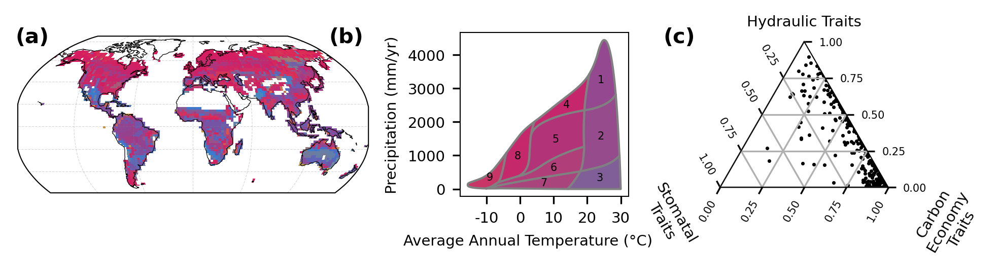

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


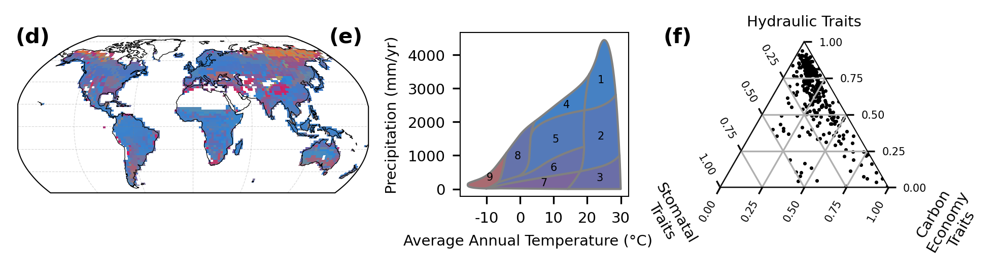

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


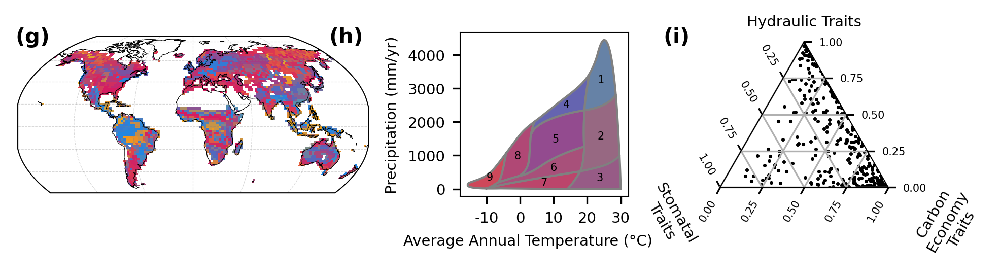

In [9]:
fig1(GPP_PFT, '', 'Fig1_GPP.png', a='(a)', b = '(b)', c = '(c)', save = False)
fig1(Stress_PFT, '', 'Fig1_Stress.png', a='(d)', b = '(e)', c = '(f)', save = False)
fig1(DroughtSens_PFT, '', 'Fig1_DroughtSens.png', a='(g)', b = '(h)', c = '(i)', save = False)

### Figure 2 ###

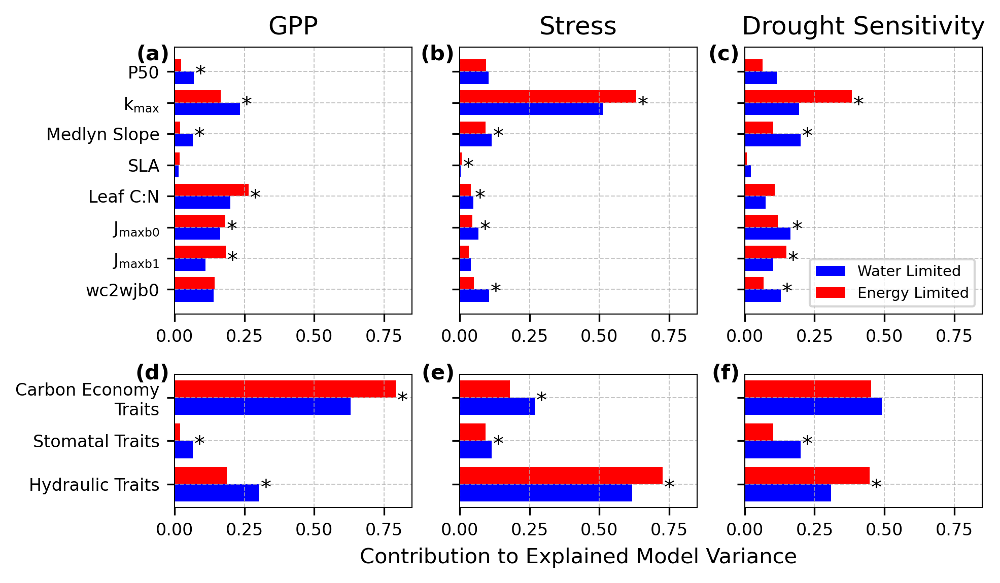

In [16]:
# List of datasets and corresponding titles
datasets = [GPP_PFT, Stress_PFT, DroughtSens_PFT]
titles = ["GPP", "Stress", "Drought Sensitivity"]

# Define trait groupings
hydraulic_traits = ['kmax', 'psi50']
carbon_economy_traits = ['leafcn', 'slatop', 'jmaxb0', 'jmaxb1', 'wc2wjb0']
stomatal_traits = ['medlynslope']
group_names = ['Hydraulic Traits', 'Stomatal Traits', 'Carbon Economy\nTraits']

# Set up figure with 2 rows and 3 columns (datasets are columns, traits vs. groups are rows)
# Increase the overall figure width and use custom width_ratios to give Panel 1 more space.
figure_width_mm = 169
figure_height_mm = 100

# Convert millimeters to inches
figure_width_inches = figure_width_mm / 25.4
figure_height_inches = figure_height_mm / 25.4

fig, ax = plt.subplots(2, 3, figsize=(figure_width_inches, figure_height_inches), gridspec_kw={'height_ratios': [10, 5]}, dpi = 300)

ylabels = [
    'P50',
    r'$\mathrm{k}_{\mathrm{max}}$',
    'Medlyn Slope',
    'SLA',
    'Leaf C:N',
    r'$\mathrm{J}_{\mathrm{maxb0}}$',
    r'$\mathrm{J}_{\mathrm{maxb1}}$',
    'wc2wjb0'
]

trait_order = ['wc2wjb0', 'jmaxb1',  'jmaxb0', 'leafcn', 'slatop', 'medlynslope', 'kmax', 'psi50']

for col_idx, (data, title) in enumerate(zip(datasets, titles)):

    data = data.sel(trait = trait_order)
    data = data.where(veg_mask)
    data = data.where(data.r2_test > .20, drop = True)

    ### ROW 1: Individual Traits ###
    # Means
    testW = data.S1.where(inds.ELI > 0, drop=True).mean(dim='gridcell').to_dataframe().reset_index()
    testE = data.S1.where(inds.ELI < 0, drop=True).mean(dim='gridcell').to_dataframe().reset_index()

    # Standard deviations
    testW_std = data.S1.where(inds.ELI > 0, drop=True).std(dim='gridcell').to_dataframe().reset_index()
    testE_std = data.S1.where(inds.ELI < 0, drop=True).std(dim='gridcell').to_dataframe().reset_index()

    testW['ELI'] = 'Water Limited'
    testE['ELI'] = 'Energy Limited'

    testW['std_dev'] = testW_std['S1']
    testE['std_dev'] = testE_std['S1']

    df = pd.concat([testW, testE])

    p_value_list_1 = []
    for trait in data.trait.values:
        group1 = data.sel(trait=trait).S1.where(inds.ELI > 0, drop=True).values
        group1 = group1[~np.isnan(group1)]

        group2 = data.sel(trait=trait).S1.where(inds.ELI < 0, drop=True).values
        group2 = group2[~np.isnan(group2)]

        statistic, p_value = stats.mannwhitneyu(group1, group2)
        p_value_list_1.append(p_value)

    pvalue1df = pd.DataFrame({'trait': data.trait.values, 'pvalue': p_value_list_1})

    # Merge the p-values into the main dataframe
    merged_df_all_traits = df.merge(pvalue1df, on="trait", how="left")

    # Separate the data by ELI
    water_limited = merged_df_all_traits[merged_df_all_traits['ELI'] == 'Water Limited']
    energy_limited = merged_df_all_traits[merged_df_all_traits['ELI'] == 'Energy Limited']

    # Define the x positions for the traits
    x = np.arange(len(water_limited))

    # Width of the bars
    bar_width = 0.4
    
    # Plot water-limited bars
    bars1 = ax[0, col_idx].barh(x - bar_width / 2, water_limited['S1'], bar_width, color='blue', label='Water Limited')

    # Plot energy-limited bars
    bars2 = ax[0, col_idx].barh(x + bar_width / 2, energy_limited['S1'], bar_width, color='red', label='Energy Limited')

    # Add asterisks for significant p-values (only one per trait)
    for i, trait in enumerate(trait_order):
        pval = water_limited.iloc[i]['pvalue']
        if not np.isnan(pval) and pval < 0.05:
            max_width = max(bars1[i].get_width(), bars2[i].get_width())
            ax[0, col_idx].text(max_width + 0.005, bars1[i].get_y() + bar_width * 0.75, '*', va='center', color='black', fontsize=10)

    ax[0, col_idx].set_yticks(x)
    ax[0, col_idx].set_yticklabels(ylabels[::-1])
    ax[0, col_idx].set_title(title, fontsize=12)

    ### ROW 2: Trait Groups ###
    hydraulic_W = data.H.where(inds.ELI > 0, drop=True)
    hydraulic_E = data.H.where(inds.ELI < 0, drop=True)

    stomatal_W = data.S.where(inds.ELI > 0, drop=True)
    stomatal_E = data.S.where(inds.ELI < 0, drop=True)

    carbon_economy_W = data.CE.where(inds.ELI > 0, drop=True)
    carbon_economy_E = data.CE.where(inds.ELI < 0, drop=True)

    pvalue2df2 = pd.DataFrame({'trait': group_names * 2,
                               'S1': [hydraulic_W.mean().values, stomatal_W.mean().values, carbon_economy_W.mean().values,
                                      hydraulic_E.mean().values, stomatal_E.mean().values, carbon_economy_E.mean().values],
                               'ELI': ['Water Limited', 'Water Limited', 'Water Limited',
                                       'Energy Limited', 'Energy Limited', 'Energy Limited']})

    water_limited_group = pvalue2df2[pvalue2df2['ELI'] == 'Water Limited']
    energy_limited_group = pvalue2df2[pvalue2df2['ELI'] == 'Energy Limited']

    x = np.arange(len(water_limited_group))

    bars1 = ax[1, col_idx].barh(x - bar_width / 2, water_limited_group['S1'], bar_width, color='blue', label='Water Limited')
    bars2 = ax[1, col_idx].barh(x + bar_width / 2, energy_limited_group['S1'], bar_width, color='red', label='Energy Limited')

    # Add asterisks for significant differences in the trait groups
    for i, trait in enumerate(water_limited_group['trait']):
        pval = stats.mannwhitneyu(
            hydraulic_W.where(~hydraulic_W.isnull(), drop = True).values if trait == "Hydraulic Traits" else 
            stomatal_W.where(~stomatal_W.isnull(), drop = True).values if trait == "Stomatal Traits" else 
            carbon_economy_W.where(~carbon_economy_W.isnull(), drop = True).values,
            
            hydraulic_E.where(~hydraulic_E.isnull(), drop = True).values if trait == "Hydraulic Traits" else 
            stomatal_E.where(~stomatal_E.isnull(), drop = True).values if trait == "Stomatal Traits" else 
            carbon_economy_E.where(~carbon_economy_E.isnull(), drop = True).values
        )[1]  # Extract p-value
    
        if not np.isnan(pval) and pval < 0.05:
            max_width = max(bars1[i].get_width(), bars2[i].get_width())
            ax[1, col_idx].text(max_width + 0.005, bars1[i].get_y() + bar_width * 0.75, '*', 
                                va='center', color='black', fontsize=10)
        
    ax[1, col_idx].set_yticks(x)
    ax[1, col_idx].set_yticklabels(group_names)
    
# Global x-axis label
ax[1, 1].set_xlabel('Contribution to Explained Model Variance', fontsize=10)
for i in range(2):  # Rows
    for j in range(3):  # Columns
        ax[i, j].grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
        ax[i, j].set_xlim(0, 0.85)
        ax[i, j].tick_params(axis='y', which='major', labelsize=8)
        ax[i, j].tick_params(axis='x', which='major', labelsize=8)
        if j > 0:  # Hide y-axis labels for columns 2 and 3
            ax[i, j].set_yticklabels([])
            ax[i, j].set_ylabel("")
        if ((j > 1) & (i == 0)):
            ax[i, j].legend(fontsize = 7, loc = 'lower right')


# Add annotations (a), (b), and (c) to the top-left of each subplot in the first row
annotations = ['(a)', '(b)', '(c)']
for col_idx in range(3):  # Iterate over the 3 top row subplots
    ax[0, col_idx].text(-0.02, 1.01, annotations[col_idx], transform=ax[0, col_idx].transAxes,
                         fontsize=10, fontweight='bold', va='top', ha='right')
annotations = ['(d)', '(e)', '(f)']
for col_idx in range(3):  # Iterate over the 3 top row subplots
    ax[1, col_idx].text(-0.02, 1.08, annotations[col_idx], transform=ax[1, col_idx].transAxes,
                         fontsize=10, fontweight='bold', va='top', ha='right')
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.2,  # horizontal spacing (default ~0.2–0.3)
    hspace=0.3   # vertical spacing (default ~0.4)
)

for row in ax:
    for a in row:
        for spine in a.spines.values():
            spine.set_linewidth(0.5)  # thinner border (default ~1)
            
plt.savefig(repo_dir+'/figs/Fig2.png', transparent = True, bbox_inches='tight')

plt.show()


### Figure 3 ###

/glade/derecho/scratch/emargiotta/tmp/ipykernel_3960/1470564719.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10', num_biomes)
/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


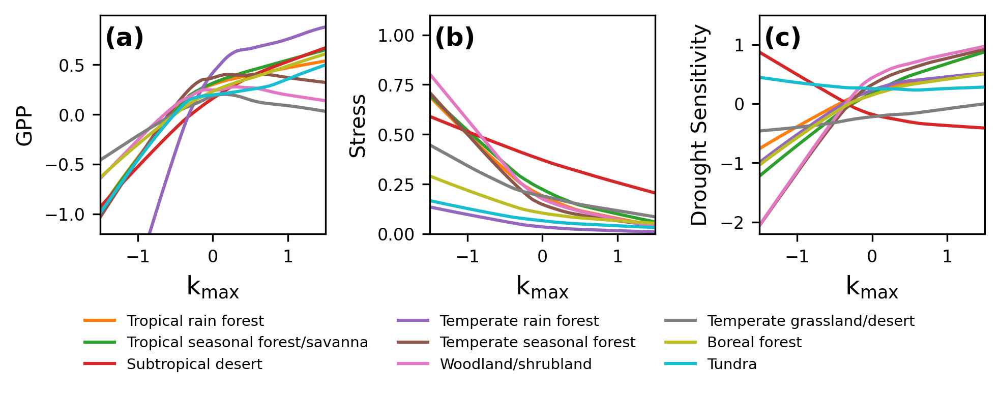

In [34]:
# --- Shared settings ---
# --- Font sizes ---
xlabelsize = 12
ylabelsize = 10
ticksize = 8
panelsize = 6

xtraits_PFT = ['kmax_Norm','leafcn_Norm','medlynslope_Norm','psi50_Norm','slatop_Norm','jmaxb0','jmaxb1','wc2wjb0']

trait_ds = trait_data[xtraits_PFT]
trait_ds = (trait_ds - trait_ds.mean(dim = 'ens'))/ trait_ds.std(dim = 'ens')
inds_test_PFT = xr.merge([trait_ds, Metrics_PFT])
rename_dict = {var: var.replace("_Norm", "") for var in inds_test_PFT.data_vars}
inds_test_PFT = inds_test_PFT.rename(rename_dict)
xtraits_PFT = ['kmax','leafcn','medlynslope','psi50','slatop','jmaxb0','jmaxb1','wc2wjb0']
inds_test_PFT['Stress'] = 1 - inds_test_PFT['B']

dslist = []
for i in inds_test_PFT.gridcell.values:
    sub = inds_test_PFT.sel(gridcell = i)
    ppft = prim_pft.pft.sel(gridcell = i)
    sub = sub.sel(pft = ppft)
    dslist.append(sub)
inds_test_PFT = xr.concat(dslist, dim = 'gridcell')

biome_ids = np.unique(inds.biome.values[~np.isnan(inds.biome.values)]).astype(int)
biome_names = inds.biome_name.values
num_biomes = len(biome_ids)
cmap = cm.get_cmap('tab10', num_biomes)
biome_colors = {bid: cmap(i) for i, bid in enumerate(biome_ids)}

panel_labels_top = ['(a)', '(b)', '(c)']
panel_labels_bottom = ['(d)', '(e)', '(f)']

# Trait name and derivative label
trait_label = r'$\mathrm{k}_{\mathrm{max}}$'

grad_label = r"$\frac{\partial\,\mathrm{Metric}}{\partial\,k_{\mathrm{max}}}$"

# --- Set up 2x3 plot ---
figure_width_mm = 169
figure_height_mm = 55
fig, axes = plt.subplots(1, 3, figsize=(figure_width_mm / 25.4, figure_height_mm / 25.4), dpi=300)

# ----------------------------
# 🔹 Panel (a): Stress vs Trait (kmax) — With dots, stars, and annotations
# ----------------------------
ax = axes[0]
trait = 'kmax'
data_top = inds_test_PFT.where(veg_mask)
#data_top = data_top.where(GPP_PFT.r2_test > 0.1)
data_top = data_top.where(GPP_PFT.S1.sel(trait = trait) > 0.1)

for b in biome_ids:
    d_trait = data_top.where(inds.biome == b).median(dim='gridcell')
    x = d_trait[trait].values
    y = ((d_trait.GPP - d_trait.GPP.mean())/d_trait.GPP.std()).values
    mask = np.isfinite(x) & np.isfinite(y)
    if np.any(mask):
        sm = lowess(y[mask], x[mask], frac=0.75, return_sorted=True)
        f_interp = interp1d(sm[:, 0], sm[:, 1], bounds_error=False, fill_value="extrapolate")
    
        # Main curve
        x_interp = np.linspace(-1.5, 1.5, 200)
        y_interp = f_interp(x_interp)
        ax.plot(x_interp, y_interp, color=biome_colors[b], linewidth=1.5, label=biome_names[b])

ax.set_xlabel(trait_label, fontsize=xlabelsize)
ax.set_ylabel('GPP', fontsize=ylabelsize)
ax.tick_params(axis='both', labelsize=ticksize) 
ax.set_ylim(-1.2, 1)
ax.set_xlim(-1.5, 1.5)
ax.set_xticks([-1, 0, 1])
ax.set_yticks([-1, -.5, 0, .5])
ax.text(0.02, 0.95, panel_labels_top[0], transform=ax.transAxes,
        fontsize=12, fontweight='bold', va='top')

# ----------------------------
# 🔹 Panel (b): Stress vs Trait (kmax) — With dots, stars, and annotations
# ----------------------------
ax = axes[1]
trait = 'kmax'
data_top = inds_test_PFT.where(veg_mask)
#data_top = data_top.where(Stress_PFT.r2_test > 0.1)
data_top = data_top.where(Stress_PFT.S1.sel(trait = trait) > 0.1)


for b in biome_ids:
    d_trait = data_top.where(inds.biome == b).median(dim='gridcell')
    x = d_trait[trait].values
    y = d_trait.Stress
    mask = np.isfinite(x) & np.isfinite(y)
    if np.any(mask):
        sm = lowess(y[mask], x[mask], frac=0.75, return_sorted=True)
        f_interp = interp1d(sm[:, 0], sm[:, 1], bounds_error=False, fill_value="extrapolate")
    
        # Main curve
        x_interp = np.linspace(-1.5, 1.5, 200)
        y_interp = f_interp(x_interp)
        ax.plot(x_interp, y_interp, color=biome_colors[b], linewidth=1.5, label=biome_names[b])

ax.set_xlabel(trait_label, fontsize=xlabelsize)
ax.set_ylabel('Stress', fontsize=ylabelsize)
ax.tick_params(axis='both', labelsize=ticksize) 
ax.set_ylim(0, 1.1)
ax.set_xlim(-1.5, 1.5)
ax.set_xticks([-1, 0, 1])
ax.set_yticks([0, .25, .5, 0.75, 1])
ax.text(0.02, 0.95, panel_labels_top[1], transform=ax.transAxes,
        fontsize=12, fontweight='bold', va='top')
# ----------------------------
# 🔹 Panel (c): Stress vs Trait (kmax) — With dots, stars, and annotations
# ----------------------------
ax = axes[2]
trait = 'kmax'
data_top = inds_test_PFT.where(veg_mask)
#data_top = data_top.where(DroughtSens_PFT.r2_test > 0.1)
data_top = data_top.where(DroughtSens_PFT.S1.sel(trait = trait) > 0.1)

for b in biome_ids:
    d_trait = data_top.where(inds.biome == b).median(dim='gridcell')
    x = d_trait[trait].values
    y = ((d_trait.DroughtSens - d_trait.DroughtSens.mean())/d_trait.DroughtSens.std()).values
    mask = np.isfinite(x) & np.isfinite(y)
    if np.any(mask):
        sm = lowess(y[mask], x[mask], frac=0.75, return_sorted=True)
        f_interp = interp1d(sm[:, 0], sm[:, 1], bounds_error=False, fill_value="extrapolate")
    
        # Main curve
        x_interp = np.linspace(-1.5, 1.5, 200)
        y_interp = f_interp(x_interp)
        ax.plot(x_interp, y_interp, color=biome_colors[b], linewidth=1.5, label=biome_names[b])

ax.set_xlabel(trait_label, fontsize=xlabelsize)
ax.set_ylabel('Drought Sensitivity', fontsize=ylabelsize)
ax.tick_params(axis='both', labelsize=ticksize) 
ax.set_xticks([-1, 0, 1])
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-2.2, 1.5)
ax.set_yticks([-2,-1,0,1])
ax.text(0.02, 0.95, panel_labels_top[2], transform=ax.transAxes,
        fontsize=12, fontweight='bold', va='top')




handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc='lower center',
    ncol=int(np.ceil(len(labels) / 3)),
    frameon=False,
    fontsize=7,
    bbox_to_anchor=(0.5, -0.19)
)
plt.tight_layout()
plt.savefig(repo_dir + '/figs/Fig3.png', transparent=True, bbox_inches='tight', dpi = 300)
plt.show()

### Figure 4 ###

In [10]:
def fig4def(data, title, plot_name, save = False):
    import numpy as np
    import xarray as xr
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.ticker as mticker
    import matplotlib.colors as mcolors
    from matplotlib.colors import ListedColormap
    import cartopy.crs as ccrs
    import geopandas as gpd
    import mpltern  # ensures ternary projection is registered
    from numpy.ma import masked_array
    import matplotlib.gridspec as gridspec
    
    # -------------------------------
    # Panel 1: Cartopy Map Plot
    # -------------------------------
    data1 = data.copy()
    data1 = data1.where(veg_mask)
    
    # Compute normalized components
    magenta = data1.CE
    blue = data1.H
    yellow = data1.S
    
    magenta_norm = (magenta - magenta.min()) / (magenta.max() - magenta.min())
    blue_norm = (blue - blue.min()) / (blue.max() - blue.min())
    yellow_norm = (yellow - yellow.min()) / (yellow.max() - yellow.min())
    
    
    magenta_norm_rgb = np.outer(magenta_norm,np.array([216/255, 27/255, 96/255])) # Magenta for CE
    blue_norm_rgb =  np.outer(blue_norm,np.array([30/255, 136/255, 229/255]))  # Sky Blue for H
    yellow_norm_rgb = np.outer(yellow_norm, np.array([255/255, 193/255, 7/255]))  # Yellow for LUNA
    colors1 = magenta_norm_rgb + blue_norm_rgb + yellow_norm_rgb
    
    data1['color'] = xr.DataArray(
        colors1,
        dims=['gridcell', 'rgb'],
        coords={'gridcell': np.arange(400), 'rgb': ['r','g','b']}
    )
    
    map_data = get_map(data1, file=repo_dir+'/utils/sgmap.nc').sel(lat=slice(-54, None))
    map_data = map_data.assign_coords(lon=((map_data.lon + 180) % 360) - 180).sortby("lon")
    color_data = map_data['color'].values
    color_data = masked_array(color_data, np.isnan(color_data))
    
    # -------------------------------
    # Panel 2: Biome Plot via Geopandas
    # -------------------------------
    data2 = data.copy().where(veg_mask)
    #data2 = data2.where(data2.r2_test > .1)
    
    magenta = data2.CE
    blue = data2.H
    yellow = data2.S
    
    magenta_norm = (magenta - magenta.min()) / (magenta.max() - magenta.min())
    blue_norm = (blue - blue.min()) / (blue.max() - blue.min())
    yellow_norm = (yellow - yellow.min()) / (yellow.max() - yellow.min())
    
    
    magenta_norm_rgb = np.outer(magenta_norm,np.array([216/255, 27/255, 96/255])) # Magenta for CE
    blue_norm_rgb =  np.outer(blue_norm,np.array([30/255, 136/255, 229/255]))  # Sky Blue for H
    yellow_norm_rgb = np.outer(yellow_norm, np.array([255/255, 193/255, 7/255]))  # Yellow for LUNA
    
    
    # Combine the RGB values by summing them
    colors2 = magenta_norm_rgb + blue_norm_rgb + yellow_norm_rgb
    
    data2['color'] = xr.DataArray(
        colors2,
        dims=['gridcell', 'rgb'],
        coords={'gridcell': np.arange(400), 'rgb': ['r','g','b']}
    )
    
    # Group by biome (assuming inds.biome exists) and compute the mean, dropping biome==0.
    data2_grouped = data2.groupby(inds.biome).mean().drop_sel(biome=0)
    colors_array = data2_grouped.color.values  # each row is an RGB triplet
    cmap = ListedColormap(colors_array)
    biomes_list = list(data2_grouped.coords['biome'].values)
    
    whitpol = gpd.read_file(repo_dir + '/whit/whittaker.shp')
    whitpol.crs = None
    whitpol.loc[whitpol["biome"] == "Tundra", "B_ID"] = 9
    whitpol.loc[whitpol["biome"] == "Boreal forest", "B_ID"] = 8
    whitpol.loc[whitpol["biome"] == "Temperate grassland/desert", "B_ID"] = 7
    whitpol.loc[whitpol["biome"] == "Woodland/shrubland", "B_ID"] = 6
    whitpol.loc[whitpol["biome"] == "Temperate seasonal forest", "B_ID"] = 5
    whitpol.loc[whitpol["biome"] == "Temperate rain forest", "B_ID"] = 4
    whitpol.loc[whitpol["biome"] == "Tropical rain forest", "B_ID"] = 1
    whitpol.loc[whitpol["biome"] == "Tropical seasonal forest/savanna", "B_ID"] = 2
    whitpol.loc[whitpol["biome"] == "Subtropical desert", "B_ID"] = 3
    whitpol['centroid'] = whitpol.geometry.centroid
    whitpol['X'] = whitpol.centroid.x
    whitpol['Y'] = whitpol.centroid.y
    whitpol["label"] = whitpol["biome"] + " (" + whitpol["b_score"].astype(str) + ")"
    
    # -------------------------------
    # Panel 3: Ternary Plot via mpltern
    # -------------------------------
    r_values = data2.CE.values
    y_values = data2.S.values
    b_values = data2.H.values
    
    # -------------------------------
    # Create Combined Figure with 3 Subpanels
    # -------------------------------
    # Increase the overall figure width and use custom width_ratios to give Panel 1 more space.
    figure_width_mm = 169
    figure_height_mm = 120
    
    # Convert millimeters to inches
    figure_width_inches = figure_width_mm / 25.4
    figure_height_inches = figure_height_mm / 25.4

    fig = plt.figure(figsize=(figure_width_inches, figure_height_inches), dpi = 300)
    gs = gridspec.GridSpec(1, 3, width_ratios=[2.5, 1.2, 1.2])
    
    # Panel 1: Cartopy map with Robinson projection
    ax1 = fig.add_subplot(gs[0], projection=ccrs.Robinson(central_longitude=0))
    ax1.set_extent([map_data.lon.min(), map_data.lon.max(), -60, map_data.lat.max()], crs=ccrs.PlateCarree())
    ax1.imshow(
        color_data,
        origin='lower',
        transform=ccrs.PlateCarree(),
        extent=(map_data.lon.min(), map_data.lon.max(), map_data.lat.min(), map_data.lat.max()),
        interpolation='none'
    )
    ax1.coastlines(linewidth=0.3)
    ax1.gridlines(draw_labels=False, linewidth=0.3, color='gray', linestyle='--', alpha = 0.3)
    
    # Panel 2: Biome plot
    ax2 = fig.add_subplot(gs[1])
    whitpol.plot(column="B_ID", cmap=cmap, edgecolor="gray", linewidth=1, ax=ax2, legend=False)
    for idx, row in whitpol.iterrows():
        ax2.text(row['X'], row['Y'], str(int(row['B_ID'])), 
                 fontsize=5, color='black', ha='center', va='center')
    def scale_yticks(y, _):
        return f"{int(y * 100)}"
    ax2.yaxis.set_major_formatter(mticker.FuncFormatter(scale_yticks))
    ax2.set_xlabel("Average Annual Temperature (°C)", fontsize=7)
    ax2.set_ylabel("Precipitation (mm/yr)", fontsize=7)
    ax2.tick_params(labelsize=7)
    ax2.set_xticks([-10, 0, 10, 20, 30])
    ax2.set_xticklabels(['-10', '0', '10', '20', '30'])
    
    # Panel 3: Ternary plot
    ax3 = fig.add_subplot(gs[2], projection="ternary")
    ax3.scatter(b_values, y_values, r_values, c='black', s=.5)
    ax3.set_llabel('Stomatal\nTraits', fontsize=7)
    ax3.set_rlabel('Carbon\nEconomy\nTraits', fontsize=7)
    ax3.set_tlabel('Hydraulic Traits', fontsize=7)
    ax3.tick_params(labelsize=5)
    ax3.grid()
    custom_ticks = [0, 0.25, 0.5, 0.75, 1.0]
    ax3.taxis.set_ticks(custom_ticks)  # Top axis (Hydraulic)
    ax3.laxis.set_ticks([0.25, 0.5, 0.75, 1.0])  # Left axis (Stomatal)
    ax3.raxis.set_ticks(custom_ticks)  # Right axis (Carbon Economy)

    
    fig.text(0.02, 0.6, '(d)', fontsize=10, fontweight='bold', transform=fig.transFigure)
    fig.text(0.38, 0.6, '(e)', fontsize=10, fontweight='bold', transform=fig.transFigure)
    fig.text(0.7, 0.6, '(f)', fontsize=10, fontweight='bold', transform=fig.transFigure)
    
    fig.text(-0.02, 0.5, title, rotation=90, fontsize=30, fontweight='bold', va='center', ha='center', transform=fig.transFigure)
    
    for spine in ax3.spines.values():
        spine.set_linewidth(0.5)
    # Thin the borders for ax1 (Cartopy map)
    for spine in ax1.spines.values():
        spine.set_linewidth(0.5)
    
    # Thin the borders for ax2 (Whitaker plot)
    for spine in ax2.spines.values():
        spine.set_linewidth(0.5)
    
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5)
    if save == True:
        plt.savefig(repo_dir+'/figs/'+plot_name, transparent = True, bbox_inches='tight', dpi = 300)
    
    plt.show()

def fig4abc(data, title, plot_name, save = False):
    import numpy as np
    import xarray as xr
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.ticker as mticker
    import matplotlib.colors as mcolors
    from matplotlib.colors import ListedColormap
    import cartopy.crs as ccrs
    import geopandas as gpd
    import mpltern  # ensures ternary projection is registered
    from numpy.ma import masked_array
    import matplotlib.gridspec as gridspec
    
    # -------------------------------
    # Panel 1: Cartopy Map Plot
    # -------------------------------
    data1 = data.copy()
    data1 = data1.where(veg_mask)
    
    # Compute normalized components
    brown = data1.Mean
    green = data1.Diversity
    white = data1.Universals
    
    brown_norm = (brown - brown.min()) / (brown.max() - brown.min())
    green_norm = (green - green.min()) / (green.max() - green.min())
    white_norm = (white - white.min()) / (white.max() - white.min())
    
    brown_norm_rgb = np.outer(brown_norm, np.array([84*2/255, 48*2/255, 5*2/255]))
    green_norm_rgb = np.outer(green_norm, np.array([0*2/255, 60*2/255, 48*2/255]))
    white_norm_rgb = np.outer(white_norm, np.array([200/255, 200/255, 200/255]))
    colors1 = brown_norm_rgb + green_norm_rgb + white_norm_rgb
    
    data1['color'] = xr.DataArray(
        colors1,
        dims=['gridcell', 'rgb'],
        coords={'gridcell': np.arange(400), 'rgb': ['r','g','b']}
    )
    
    map_data = get_map(data1, file=repo_dir+'/utils/sgmap.nc').sel(lat=slice(-54, None))
    map_data = map_data.assign_coords(lon=((map_data.lon + 180) % 360) - 180).sortby("lon")
    color_data = map_data['color'].values
    color_data = masked_array(color_data, np.isnan(color_data))
    
    # -------------------------------
    # Panel 2: Biome Plot via Geopandas
    # -------------------------------
    data2 = data.copy().where(veg_mask)
    data2 = data2.where(data2.r2_test > .1)

    
    brown = data2.Mean
    green = data2.Diversity
    white = data2.Universals
    
    brown_norm = (brown - brown.min()) / (brown.max() - brown.min())
    green_norm = (green - green.min()) / (green.max() - green.min())
    white_norm = (white - white.min()) / (white.max() - white.min())
    
    brown_norm_rgb = np.outer(brown_norm, np.array([84*2/255, 48*2/255, 5*2/255]))
    green_norm_rgb = np.outer(green_norm, np.array([0*2/255, 60*2/255, 48*2/255]))
    white_norm_rgb = np.outer(white_norm, np.array([200/255, 200/255, 200/255]))
    colors2 = brown_norm_rgb + green_norm_rgb + white_norm_rgb
    
    data2['color'] = xr.DataArray(
        colors2,
        dims=['gridcell', 'rgb'],
        coords={'gridcell': np.arange(400), 'rgb': ['r','g','b']}
    )
    
    # Group by biome (assuming inds.biome exists) and compute the mean, dropping biome==0.
    data2_grouped = data2.groupby(inds.biome).mean().drop_sel(biome=0)
    colors_array = data2_grouped.color.values  # each row is an RGB triplet
    cmap = ListedColormap(colors_array)
    biomes_list = list(data2_grouped.coords['biome'].values)
    
    whitpol = gpd.read_file(repo_dir + '/whit/whittaker.shp')
    whitpol.crs = None
    whitpol.loc[whitpol["biome"] == "Tundra", "B_ID"] = 9
    whitpol.loc[whitpol["biome"] == "Boreal forest", "B_ID"] = 8
    whitpol.loc[whitpol["biome"] == "Temperate grassland/desert", "B_ID"] = 7
    whitpol.loc[whitpol["biome"] == "Woodland/shrubland", "B_ID"] = 6
    whitpol.loc[whitpol["biome"] == "Temperate seasonal forest", "B_ID"] = 5
    whitpol.loc[whitpol["biome"] == "Temperate rain forest", "B_ID"] = 4
    whitpol.loc[whitpol["biome"] == "Tropical rain forest", "B_ID"] = 1
    whitpol.loc[whitpol["biome"] == "Tropical seasonal forest/savanna", "B_ID"] = 2
    whitpol.loc[whitpol["biome"] == "Subtropical desert", "B_ID"] = 3
    whitpol['centroid'] = whitpol.geometry.centroid
    whitpol['X'] = whitpol.centroid.x
    whitpol['Y'] = whitpol.centroid.y
    whitpol["label"] = whitpol["biome"] + " (" + whitpol["b_score"].astype(str) + ")"
    
    # -------------------------------
    # Panel 3: Ternary Plot via mpltern
    # -------------------------------
    data2 = data.copy().where(veg_mask)
    r_values = data2.Mean.values
    y_values = data2.Universals.values
    b_values = data2.Diversity.values
    
    # -------------------------------
    # Create Combined Figure with 3 Subpanels
    # -------------------------------
    # Increase the overall figure width and use custom width_ratios to give Panel 1 more space.
    figure_width_mm = 169
    figure_height_mm = 120
    
    # Convert millimeters to inches
    figure_width_inches = figure_width_mm / 25.4
    figure_height_inches = figure_height_mm / 25.4

    fig = plt.figure(figsize=(figure_width_inches, figure_height_inches), dpi = 300)
    gs = gridspec.GridSpec(1, 3, width_ratios=[2.5, 1.2, 1.2])
    
    # Panel 1: Cartopy map with Robinson projection
    ax1 = fig.add_subplot(gs[0], projection=ccrs.Robinson(central_longitude=0))
    ax1.set_extent([map_data.lon.min(), map_data.lon.max(), -60, map_data.lat.max()], crs=ccrs.PlateCarree())
    ax1.imshow(
        color_data,
        origin='lower',
        transform=ccrs.PlateCarree(),
        extent=(map_data.lon.min(), map_data.lon.max(), map_data.lat.min(), map_data.lat.max()),
        interpolation='none'
    )
    ax1.coastlines(linewidth=0.3)
    ax1.gridlines(draw_labels=False, linewidth=0.3, color='gray', linestyle='--', alpha = 0.3)
    
    # Panel 2: Biome plot
    ax2 = fig.add_subplot(gs[1])
    whitpol.plot(column="B_ID", cmap=cmap, edgecolor="gray", linewidth=1, ax=ax2, legend=False)
    for idx, row in whitpol.iterrows():
        ax2.text(row['X'], row['Y'], str(int(row['B_ID'])), 
                 fontsize=5, color='black', ha='center', va='center')
    def scale_yticks(y, _):
        return f"{int(y * 100)}"
    ax2.yaxis.set_major_formatter(mticker.FuncFormatter(scale_yticks))
    ax2.set_xlabel("Average Annual Temperature (°C)     ", fontsize=7)
    ax2.set_ylabel("Precipitation (mm/yr)", fontsize=7)
    ax2.tick_params(labelsize=7)
    ax2.set_xticks([-10, 0, 10, 20, 30])
    ax2.set_xticklabels(['-10', '0', '10', '20', '30'])
    
    # Panel 3: Ternary plot
    ax3 = fig.add_subplot(gs[2], projection="ternary")
    ax3.scatter(b_values, y_values, r_values, c='black', s=.5)
    ax3.set_llabel('Global\nTraits', fontsize=7)
    ax3.set_rlabel('Trait\nMeans', fontsize=7)
    ax3.set_tlabel('Trait CVs', fontsize=7)
    
    ax3.tick_params(labelsize=5)
    ax3.grid()
    custom_ticks = [0, 0.25, 0.5, 0.75, 1.0]
    ax3.taxis.set_ticks(custom_ticks)  # Top axis (Hydraulic)
    ax3.laxis.set_ticks([0.25, 0.5, 0.75, 1.0])  # Left axis (Stomatal)
    ax3.raxis.set_ticks(custom_ticks)  # Right axis (Carbon Economy)
    
    fig.text(0.02, 0.6, '(a)', fontsize=10, fontweight='bold', transform=fig.transFigure)
    fig.text(0.38, 0.6, '(b)', fontsize=10, fontweight='bold', transform=fig.transFigure)
    fig.text(0.7, 0.6, '(c)', fontsize=10, fontweight='bold', transform=fig.transFigure)
    
    fig.text(-0.02, 0.5, title, rotation=90, fontsize=30, fontweight='bold', va='center', ha='center', transform=fig.transFigure)
    
    for spine in ax3.spines.values():
        spine.set_linewidth(0.5)
    # Thin the borders for ax1 (Cartopy map)
    for spine in ax1.spines.values():
        spine.set_linewidth(0.5)
    # Thin the borders for ax2 (Whitaker plot)
    for spine in ax2.spines.values():
        spine.set_linewidth(0.5)
    
    fig.text(-0.02, 0.5, title, rotation=90, fontsize=30, fontweight='bold', va='center', ha='center', transform=fig.transFigure)
    

    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5)
    
    if save == True:
        plt.savefig(repo_dir+'/figs/'+plot_name, transparent = True, bbox_inches='tight')
    plt.show()

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


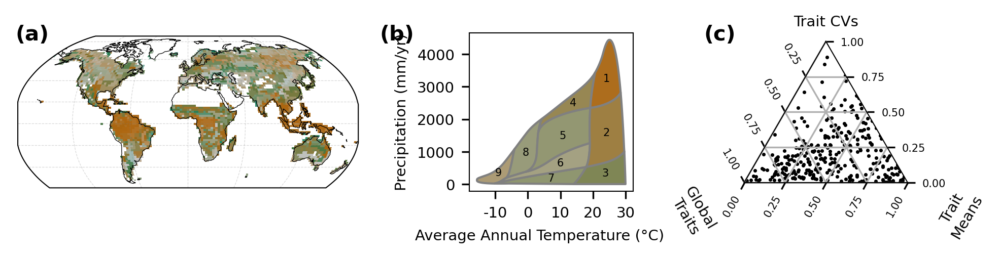

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


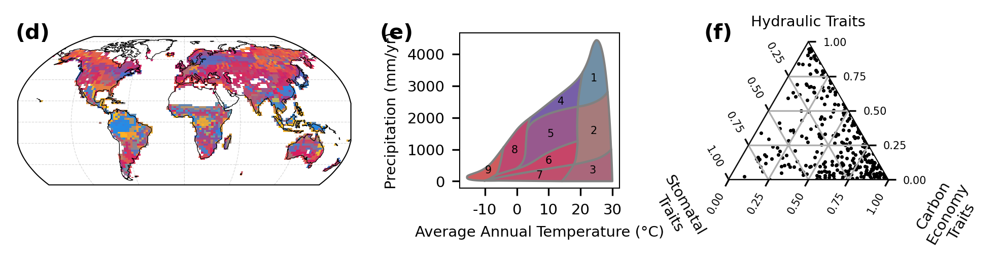

In [11]:
fig4abc(DroughtSens_GC, title = '', plot_name = 'Fig4_abc.png', save = False)
fig4def(DroughtSens_GC, title = '', plot_name = 'Fig4_def.png', save = False)

### Figure 5 ###

In [21]:
def test_concavity(x, y):
    df = pd.DataFrame({'x': x, 'y': y}).dropna()
    if len(df) < 20:
        return '', np.nan, np.nan
    df['x2'] = df['x'] ** 2
    model = ols('y ~ x + x2', data=df).fit()
    beta2 = model.params['x2']
    pval = model.pvalues['x2']
    sign = '+' if beta2 > 0 and pval < 0.05 else '−' if beta2 < 0 and pval < 0.05 else '0'
    return sign, pval, beta2

def test_diversity_effect(grads):
    grads = grads[np.isfinite(grads)]
    if len(grads) < 20:
        return '', np.nan, np.nan
    try:
        stat, pval = wilcoxon(grads - 0, alternative='two-sided')
        median = np.median(grads)
        sign = '+' if median > 0 and pval < 0.05 else '−' if median < 0 and pval < 0.05 else '0'
        return sign, pval, median
    except:
        return '', np.nan, np.nan

def concav_table(data, trait):
    trait_cv = trait +'CV'
    trait_mean = trait +'Mean'
    
    sign_rows = []
    pval_rows = []
    test_value_rows = []
    
    for biome_id in biome_ids:
        biome_name = biome_names[biome_id]
    
        # --- Concavity test ---
        d_trait = inds_test_PFT
        d_trait = d_trait.where(DroughtSens_PFT.S1.sel(trait = 'kmax') > .1)
        d_trait = d_trait.where((inds.biome == biome_id) & veg_mask).median(dim='gridcell')
        #d_trait = inds_test_PFT.where((inds.biome == biome_id) & veg_mask).median(dim='gridcell')

        x = d_trait[trait].values
        y = ((d_trait.DroughtSens - d_trait.DroughtSens.mean()) / d_trait.DroughtSens.std()).values
        concavity_sign, concavity_pval, beta2 = test_concavity(x, y)
    
        # --- Diversity effect test ---
        gridcells = inds.gridcell.where(inds.biome == biome_id, drop=True)
        try:
            grads = data.sel(trait=trait_cv).grads.sel(gridcell=gridcells).median(dim='gridcell')
            diversity_sign, diversity_pval, grad_median = test_diversity_effect(grads)
        except:
            diversity_sign, diversity_pval, grad_median = '', np.nan, np.nan
    
        # Fill all three tables in one loop
        sign_rows.append([biome_name, concavity_sign, diversity_sign])
        pval_rows.append([biome_name, concavity_pval, diversity_pval])
        test_value_rows.append([biome_name, beta2, grad_median])
    
    # Create DataFrames
    sign_df = pd.DataFrame(sign_rows, columns=[
        'Biome',
        'trait concavity', 'trait diversity effect'
    ])
    
    pval_df = pd.DataFrame(pval_rows, columns=[
        'Biome',
        'trait concavity p', 'trait diversity p'
    ]).round(3)
    
    test_val_df = pd.DataFrame(test_value_rows, columns=[
        'Biome',
        'Concavity', 
        'Diversity Effect'
    ]).round(4)

    return test_val_df


/glade/derecho/scratch/emargiotta/tmp/ipykernel_7420/340011340.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10', num_biomes)
/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


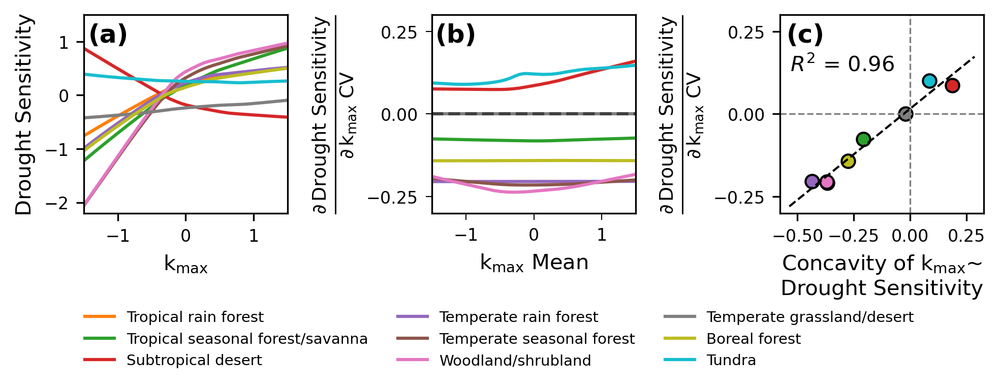

In [32]:
xlabelsize = 10
ylabelsize = 10
ticksize = 8
lettersize = 12
figure_width_mm = 169
figure_height_mm = 55

xtraits_PFT = ['kmax_Norm','leafcn_Norm','medlynslope_Norm','psi50_Norm','slatop_Norm','jmaxb0','jmaxb1','wc2wjb0']

trait_ds = trait_data[xtraits_PFT]
trait_ds = (trait_ds - trait_ds.mean(dim = 'ens'))/ trait_ds.std(dim = 'ens')
inds_test_PFT = xr.merge([trait_ds, Metrics_PFT])
rename_dict = {var: var.replace("_Norm", "") for var in inds_test_PFT.data_vars}
inds_test_PFT = inds_test_PFT.rename(rename_dict)
xtraits_PFT = ['kmax','leafcn','medlynslope','psi50','slatop','jmaxb0','jmaxb1','wc2wjb0']
inds_test_PFT['Stress'] = 1 - inds_test_PFT['B']

dslist = []
for i in inds_test_PFT.gridcell.values:
    sub = inds_test_PFT.sel(gridcell = i)
    ppft = prim_pft.pft.sel(gridcell = i)
    sub = sub.sel(pft = ppft)
    dslist.append(sub)
inds_test_PFT = xr.concat(dslist, dim = 'gridcell')


# Define biome IDs and assign consistent colors
biome_ids = np.unique(inds.biome.values[~np.isnan(inds.biome.values)]).astype(int)
biome_names = inds.biome_name.values
num_biomes = len(biome_ids)

# Consistent colormap
cmap = cm.get_cmap('tab10', num_biomes)
biome_colors = {bid: cmap(i) for i, bid in enumerate(biome_ids)}

# Biome ID list and colormap
biome_ids = np.unique(inds.biome.values[~np.isnan(inds.biome.values)]).astype(int)
num_biomes = len(biome_ids)
biome_names = inds.biome_name.values


fig, axes = plt.subplots(1, 3, figsize=(figure_width_mm / 25.4, figure_height_mm / 25.4), dpi=300)
axes = axes.flatten()

# Panel a
ax = axes[0]
trait = 'kmax'
data_top = inds_test_PFT.where(veg_mask)
#data_top = data_top.where(DroughtSens_PFT.r2_test>0.1)
data_top = data_top.where(DroughtSens_PFT.sel(trait = 'kmax').S1>0.1)

for b in biome_ids:
    d_trait = data_top.where(inds.biome == b).median(dim='gridcell')
    x = d_trait[trait]
    x = (x - x.mean(dim = 'ens'))/x.std(dim = 'ens')
    y = ((d_trait.DroughtSens - d_trait.DroughtSens.mean())/d_trait.DroughtSens.std()).values
    mask = np.isfinite(x) & np.isfinite(y)
    if np.any(mask):
        sm = lowess(y[mask], x[mask], frac=0.75, return_sorted=True)
        f_interp = interp1d(sm[:, 0], sm[:, 1], bounds_error=False, fill_value="extrapolate")
    
        # Main curve
        x_interp = np.linspace(-1.5, 1.5, 200)
        y_interp = f_interp(x_interp)
        ax.plot(x_interp, y_interp, color=biome_colors[b], linewidth=1.5, label=biome_names[b])

ax.set_xlabel(r'$\mathrm{k}_{\mathrm{max}}$', fontsize=xlabelsize)
ax.set_ylabel('Drought Sensitivity', fontsize=ylabelsize)
ax.tick_params(axis='both', labelsize=ticksize) 
ax.set_xticks([-1, 0, 1])
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-2.2, 1.5)
ax.set_yticks([-2,-1,0,1])
ax.text(0.22, 0.96, f'(a)', transform=ax.transAxes,
        fontsize=lettersize, fontweight='bold', va='top', ha='right')

# panel b 
# Filter data
data = DroughtSens_GC
data = data.where(veg_mask)
data = data.where(data.S1 > 0.1)
#data = data.where(data.r2_test > 0.1)


ax = axes[1]
mean_trait_lookup = {
    'kmaxCV': 'kmaxMean'}
trait = 'kmaxCV'
grad_trait = trait
x_trait = mean_trait_lookup[trait]

d_grad = data.sel(trait=grad_trait)
d_mean = data.sel(trait=x_trait)

for biome_id in biome_ids:
    gridcells = inds.gridcell.where(inds.biome == biome_id, drop=True).values

    try:
        x_vals = d_mean.X.sel(gridcell=gridcells)
        y_vals = d_grad.grads.sel(gridcell=gridcells)

        x_median = x_vals.median(dim='gridcell', skipna=True).values
        y_median = y_vals.median(dim='gridcell', skipna=True).values

        mask = np.isfinite(x_median) & np.isfinite(y_median)

        if np.count_nonzero(mask) > 20:
            x_valid = x_median[mask]
            y_valid = y_median[mask]
            sm = lowess(y_valid, x_valid, frac=0.75, return_sorted=True)
            f_interp = interp1d(sm[:, 0], sm[:, 1], bounds_error=False, fill_value="extrapolate")
            x_interp = np.linspace(-1.5, 1.5, 200)
            y_interp = f_interp(x_interp)
            ax.plot(x_interp, y_interp, color=biome_colors[biome_id], label=biome_names[biome_id], linewidth=1.5)

            if np.any(lowess_result[:, 1] > 2) or np.any(lowess_result[:, 1] < -2):
                continue

    except Exception as e:
        continue

# Aesthetics
ax.hlines(0, xmin=-2, xmax=2, color='black', linestyle='--', alpha=0.5)
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-.3, .3)
ax.set_xticks([-1, 0, 1])
ax.set_yticks([-.25, 0, .25])



ax.set_xlabel(r'$\mathrm{k}_{\mathrm{max}}$ Mean', fontsize=xlabelsize)
ax.tick_params(axis='both', labelsize=ticksize, length=3, width=.5)
ax.set_ylabel(r'$\frac{\partial\,\mathrm{Drought\ Sensitivity}}{\partial\,\mathrm{k}_{\mathrm{max}}\ \mathrm{CV}}$',fontsize=ylabelsize*1.3)

ax.text(0.22, 0.96, f'(b)', transform=ax.transAxes,
        fontsize=lettersize, fontweight='bold', va='top', ha='right')

# panel c
ax = axes[2]
name_to_id = dict(zip(biome_names, biome_ids))
concav_data = concav_table(data, trait = 'kmax')

# Plot scatter with biome color
for x, y, b in zip(concav_data['Concavity'], concav_data['Diversity Effect'], concav_data['Biome']):
    biome_id = name_to_id.get(b, None)
    color = biome_colors.get(biome_id, 'gray')
    ax.scatter(x, y, color=color, edgecolor='black', s=40)

# Best-fit line and R²

x = concav_data['Concavity'].values.astype(float)
y = concav_data['Diversity Effect'].values.astype(float)

# Mask out non-finite values
mask = np.isfinite(x) & np.isfinite(y)
x_clean = x[mask]
y_clean = y[mask]

slope, intercept = np.polyfit(x_clean, y_clean, 1)
y_fit = slope * x_clean + intercept
r2 = r2_score(y_clean, y_fit)

x_line = np.linspace(min(x_clean) - 0.1, max(x_clean) + 0.1, 100)
y_line = slope * x_line + intercept
ax.plot(x_line, y_line, color='black', linestyle='--', linewidth=1)

# Annotate R²
ax.text(0.05, 0.80, f'$R^2$ = {r2:.2f}', transform=ax.transAxes,
        fontsize=10, ha='left', va='top')

# Dashed grey lines at x=0, y=0
ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)
ax.axvline(0, color='gray', linestyle='--', linewidth=0.8)

# Labels
ax.set_ylabel(r'$\frac{\partial\,\mathrm{Drought\ Sensitivity}}{\partial\,\mathrm{k}_{\mathrm{max}}\ \mathrm{CV}}$',fontsize=ylabelsize*1.3)
ax.set_xlabel(
    'Concavity of ' + r'$\mathrm{k}_{\mathrm{max}}$' + '~\nDrought Sensitivity',
    fontsize=xlabelsize)
ax.tick_params(axis='both', labelsize=ticksize)
ax.text(0.22, 0.96, f'(c)', transform=ax.transAxes,
        fontsize=lettersize, fontweight='bold', va='top', ha='right')
ax.set_ylim(-.3, .3)
ax.set_yticks([-.25, 0, .25])

# ----------------------------
# 🔹 Legend underneath the last row
# ----------------------------
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc='lower center',
    ncol=int(np.ceil(len(labels) / 3)),
    frameon=False,
    fontsize=7,
    bbox_to_anchor=(0.5, -0.18)
)

plt.tight_layout()
plt.savefig(repo_dir+'/figs/Fig5.png', transparent=True, bbox_inches='tight')
plt.show()


### Figure 6 ###

In [18]:
def fig4_1(data_PFT, data_GC, plot_name, save = False):
    data_PFT = data_PFT.where(veg_mask)
    data_GC = data_GC.where(veg_mask)

    data_PFTs = data_PFT
    data_GCs = data_GC

    data_PFT['S1'] = data_PFT.S1/data_PFT.S1.sum(dim = 'trait')
    data_GC['S1'] = data_GC.S1/data_GC.S1.sum(dim = 'trait')
    
    #data_PFT = data_PFT.where(data_PFT.r2_test > 0.1)
    #data_GC = data_GC.where(data_GC.r2_test > 0.1)
    
    traits = ['kmax', 'leafcn', 'psi50', 'slatop', 'medlynslope']
    univs = ['jmaxb0', 'jmaxb1', 'wc2wjb0']
    
    for trait in traits:
        data_GC[trait] = data_GC.S1.sel(trait=[f'{trait}Mean', f'{trait}CV']).sum(dim = 'trait')
    for univ in univs:
        data_GC[univ] = data_GC.S1.sel(trait=univ)
    
    
    for trait in traits:
        data_PFT[trait] = data_PFT.S1.sel(trait=[f'{trait}']).sum(dim = 'trait')
    for univ in univs:
        data_PFT[univ] = data_PFT.S1.sel(trait=univ)
        
    data_GC = data_GC[traits+univs]
    data_PFT = data_PFT[traits+univs]

    
    
    data_GC_vec = data_GC.to_array(dim='trait')  # dims: trait, gridcell
    data_PFT_vec = data_PFT.to_array(dim='trait')  # dims: trait, gridcell
    
    # Compute the dot product for each gridcell (summing over traits)
    dot_prod = (data_GC_vec * data_PFT_vec).sum(dim='trait')
    
    # Compute the norms (Euclidean norm) for each gridcell
    norm_gc = np.sqrt((data_GC_vec ** 2).sum(dim='trait'))
    norm_pft = np.sqrt((data_PFT_vec ** 2).sum(dim='trait'))
    
    # Compute cosine similarity for each gridcell
    cosine_similarity = dot_prod / (norm_gc * norm_pft)
    # Set to NaN if denominator is zero to avoid division errors
    cosine_similarity = cosine_similarity.where((norm_gc * norm_pft) != 0)
    
    data = cosine_similarity
    data = data.where(veg_mask)

    #### Panel 1 Preprocessing ####
    map = get_map(cosine_similarity, file=repo_dir+'/utils/sgmap.nc').sel(lat=slice(-54, None))
    
    #### Panel 2 Precprocessing ####
    data = data.where((data_PFTs.r2_test > 0.1) & (data_GCs.r2_test > 0.1))
    biome_similarity = data.groupby(inds.biome).mean().drop_sel(biome = 0).rename({'biome':'B_ID'}).rename('similarity')
    
    biomes_list = list(biome_similarity.coords['B_ID'].values)
    
    biome_similarity = biome_similarity.to_dataframe()
    
    whitpol = gpd.read_file(repo_dir + '/whit/whittaker.shp')
    whitpol.crs = None
    whitpol.loc[whitpol["biome"] == "Tundra", "B_ID"] = 9
    whitpol.loc[whitpol["biome"] == "Boreal forest", "B_ID"] = 8
    whitpol.loc[whitpol["biome"] == "Temperate grassland/desert", "B_ID"] = 7
    whitpol.loc[whitpol["biome"] == "Woodland/shrubland", "B_ID"] = 6
    whitpol.loc[whitpol["biome"] == "Temperate seasonal forest", "B_ID"] = 5
    whitpol.loc[whitpol["biome"] == "Temperate rain forest", "B_ID"] = 4
    whitpol.loc[whitpol["biome"] == "Tropical rain forest", "B_ID"] = 1
    whitpol.loc[whitpol["biome"] == "Tropical seasonal forest/savanna", "B_ID"] = 2
    whitpol.loc[whitpol["biome"] == "Subtropical desert", "B_ID"] = 3
    whitpol['centroid'] = whitpol.geometry.centroid
    whitpol['X'] = whitpol.centroid.x
    whitpol['Y'] = whitpol.centroid.y
    whitpol["label"] = whitpol["biome"] + " (" + whitpol["b_score"].astype(str) + ")"
    
    
    # Create a colormap and normalization from -1 to 1
    cmap_custom = cm.get_cmap('RdBu', 256)
    cmap_custom = mcolors.LinearSegmentedColormap.from_list('whitetoblue', cmap_custom(np.linspace(0.5, 1, 128)))
    
    norm = mcolors.Normalize(vmin=0, vmax=1)

    merged_df = pd.merge(whitpol, biome_similarity, on='B_ID', how='inner')
    merged_df['color'] = merged_df['similarity'].apply(lambda x: mcolors.to_hex(cmap_custom(norm(x))))
    
    #### Plotting ####
    # Increase the overall figure width and use custom width_ratios to give Panel 1 more space.

    width_mm = 169
    aspect_ratio = 6/20 # Height / Width
    width_in = width_mm / 25.4
    height_in = width_in * aspect_ratio
    
    fig = plt.figure(figsize=(width_in, height_in), dpi = 300)
    gs = gridspec.GridSpec(1, 3, width_ratios=[2.4, 1, 0.1], wspace = 0.4)

    # Panel 1: Cartopy map with Robinson projection
    ax1 = fig.add_subplot(gs[0], projection=ccrs.Robinson(central_longitude=0))
    ax1.set_extent([-180, 180, -60, map.lat.max()], crs=ccrs.PlateCarree())
    # Map subplot

    # Create a mask where data is NaN
    nodata_mask = np.isnan(map.values)
    
    
    im = ax1.pcolormesh(map.lon, map.lat, map, cmap=cmap_custom,
                       vmin=0, vmax=1, transform=ccrs.PlateCarree())
    
    # Add coastlines
    ax1.coastlines(linewidth = .5)
    ax1.gridlines(draw_labels=False, linewidth=0.3, color='gray', linestyle='--', alpha = 0.5)
    
    # Panel 2: Biome plot
    ax2 = fig.add_subplot(gs[1])
    merged_df.plot(column="similarity", cmap=cmap_custom, edgecolor="gray", linewidth=1, ax=ax2, legend=False, vmin = 0, vmax = 1)
    for idx, row in merged_df.iterrows():
        ax2.text(row['X'], row['Y'], str(int(row['B_ID'])), 
                 fontsize=5, color='black', ha='center', va='center', fontweight='bold')
    def scale_yticks(y, _):
        return f"{int(y * 100)}"
    ax2.yaxis.set_major_formatter(mticker.FuncFormatter(scale_yticks))
    ax2.set_xlabel("Average Annual Temperature (°C)", fontsize=7)
    ax2.set_ylabel("Precipitation (mm/yr)", fontsize=8)
    ax2.tick_params(labelsize=5)
    ax2.set_xticks([-10, 0, 10, 20, 30])
    ax2.set_xticklabels(['-10', '0', '10', '20', '30'])
    
    ax_cb = fig.add_axes([0.82, 0.18, 0.02, 0.6])
    cbar = fig.colorbar(im, cax=ax_cb, orientation='vertical')
    cbar.set_label('Cosine Similarity', fontsize=8, labelpad=5)
    cbar.ax.tick_params(axis='both', which='major', labelsize=5)
    
    
    
    ax1.text(0.02, 0.95, '(a)', transform=ax1.transAxes, fontsize=10, fontweight='bold')
    ax2.text(-0.59, 0.99, '(b)', transform=ax2.transAxes, fontsize=10, fontweight='bold')
    
    
    fig.tight_layout()
    
    if save == True:
        plt.savefig(repo_dir+'/figs/Fig6.png', transparent = True, bbox_inches='tight')


    plt.show()

def fig4_2(data_PFT, data_GC, plot_name, save = False):
    data_PFT = data_PFT.where(veg_mask)
    data_GC = data_GC.where(veg_mask)
    
    data_PFT = data_PFT#.where(data_PFT.r2_test > 0.1)
    data_GC = data_GC#.where(data_GC.r2_test > 0.1)
    
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    plt.subplots_adjust(wspace=0.4)
    
    axes[0].scatter(data_PFT.H, data_GC.H, color = [30/255, 136/255, 229/255])
    axes[0].set_xlabel('Proportion of Variance in\nPFT-Scale Drought Sensitivity\nExplained by Hydraulic Traits', fontsize = 7)
    axes[0].set_ylabel('Proportion of Variance in\nGrid Cell-Scale Drought Sensitivity\nExplained by Hydraulic Traits', fontsize = 8)
    
    
    axes[1].scatter(data_PFT.CE, data_GC.CE, color = [216/255, 27/255, 96/255])
    axes[1].set_xlabel('Proportion of Variance in\nPFT-Scale Drought Sensitivity\nExplained by Carbon Economy Traits', fontsize = 8)
    axes[1].set_ylabel('Proportion of Variance in\nGrid Cell-Scale Drought Sensitivity\nExplained by Carbon Economy Traits', fontsize = 8)
    
    axes[2].scatter(data_PFT.S, data_GC.S, color = [255/255, 193/255, 7/255])
    axes[2].set_xlabel('Proportion of Variance in\nPFT-Scale Drought Sensitivity\nExplained by Stomatal Traits', fontsize = 8)
    axes[2].set_ylabel('Proportion of Variance in\nGrid Cell-Scale Drought Sensitivity\nExplained by Stomtal Traits', fontsize = 8)
    
    for ax in axes:
        ax.set_xlim(0,1)
        ax.set_ylim(0,1)
        x_vals = np.linspace(0, 1, 100)
        ax.plot(x_vals, x_vals, '--', color='black', linewidth=2)  # 1:1 line
    
    axes[0].text(-0.32, 0.95, 'c', transform=axes[0].transAxes, fontsize=23, fontweight='bold')
    axes[1].text(-0.32, 0.95, 'd', transform=axes[1].transAxes, fontsize=23, fontweight='bold')
    axes[2].text(-0.32, 0.95, 'e', transform=axes[2].transAxes, fontsize=23, fontweight='bold')
    
    for ax in axes:
        ax.tick_params(labelsize=15)


    
    path_name = repo_dir+'/figs/Fig6.png'
    if save == True:
        plt.savefig(path_name+plot_name, transparent = True, bbox_inches='tight')
    plt.show()

/glade/derecho/scratch/emargiotta/tmp/ipykernel_35929/1884362503.py:80: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_custom = cm.get_cmap('RdBu', 256)
/glade/derecho/scratch/emargiotta/tmp/ipykernel_35929/1884362503.py:141: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


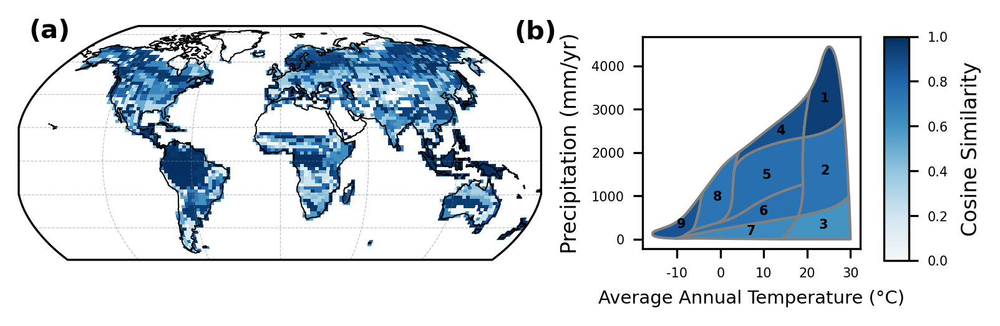

In [19]:
fig4_1(DroughtSens_PFT, DroughtSens_GC, plot_name = 'Fig6.png', save = True)

## Supplement ##

### Supplemental Table 1 ###

In [46]:
CVEG = xr.open_dataset(repo_dir+'/input/Metrics.nc').drop_sel(pft = 'c3_crop').TOTVEGC

vegprop = CVEG.mean(dim = 'time').mean(dim = 'ens') / CVEG.mean(dim = 'time').mean(dim = 'ens').sum(dim = 'pft')
n10 = (vegprop > 0.1).sum(dim = 'pft')
n1 = (vegprop > 0.01).sum(dim = 'pft')

# Step 1: Get the dominant PFT name per gridcell
dominant_pft = vegprop.idxmax(dim='pft')  # shape: (gridcell,), dtype: str
dominant_pft = dominant_pft.fillna('not_vegetated')

# Step 2: Convert to pandas and count
pft_series = dominant_pft.to_series()
pft_counts = pft_series.value_counts()

# Step 3: Get original PFT order
pft_order = vegprop.pft.values  # assumes PFT names are here in correct order

# Step 4: Reindex counts to preserve original order and fill missing with 0
pft_counts_ordered = pft_counts.reindex(pft_order).fillna(0)

# Step 5: Convert to percent
pft_percent = 100 * pft_counts_ordered / pft_counts_ordered.sum()

# Step 6: Convert to DataFrame for display
pivot_table = pft_percent.reset_index()
pivot_table.columns = ['pft', 'Percent of grid cells where PFT is the primary PFT ']

onep = 100 * (vegprop > .01).sum(dim = 'gridcell')/400
onep = onep.rename('Number of gridcells where PFT contains with >1% of total grid cell biomass')

tenp = 100 * (vegprop > .1).sum(dim = 'gridcell')/400
tenp = tenp.rename('Number of gridcells where PFT contains with >10% of total grid cell biomass')

merged = pd.merge(onep.to_dataframe(), tenp.to_dataframe(), on = 'pft')
merged = pd.merge(merged, pivot_table, on = 'pft')
merged

,pft,Number of gridcells where PFT contains with >1% of total grid cell biomass,Number of gridcells where PFT contains with >10% of total grid cell biomass,Percent of grid cells where PFT is the primary PFT
0,not_vegetated,0.00,0.00,3.00
1,needleleaf_evergreen_temperate_tree,25.25,20.25,13.75
2,needleleaf_evergreen_boreal_tree,29.25,23.00,17.25
3,needleleaf_deciduous_boreal_tree,10.75,7.00,2.50
4,broadleaf_evergreen_tropical_tree,28.00,25.75,23.00
5,broadleaf_evergreen_temperate_tree,13.25,9.25,5.25
6,broadleaf_deciduous_tropical_tree,20.25,10.00,0.75
7,broadleaf_deciduous_temperate_tree,26.00,16.00,3.50
8,broadleaf_deciduous_boreal_tree,17.25,4.75,1.00
9,broadleaf_evergreen_shrub,1.25,0.50,0.00


### Supplemental Figure 1 ###

/glade/derecho/scratch/emargiotta/tmp/ipykernel_39578/4219716441.py:150: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


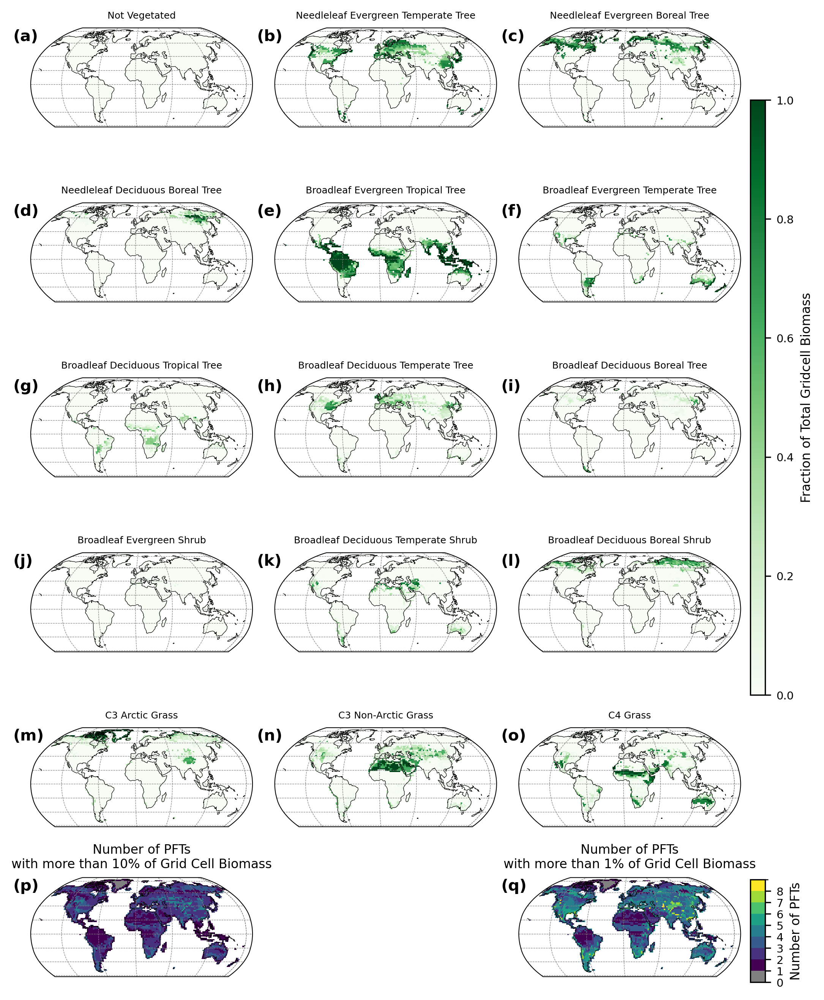

In [8]:
# Load the data
data_n10 = n10
data_n1 = n1

# --- First: prepare your PFT‐coverage figure data (vegprop, pft_names, etc.) ---
if 'pft' in vegprop.coords:
    pft_names = [name.replace("_", " ").title() for name in vegprop.pft.values]
else:
    pft_names = [f'PFT {i}' for i in range(len(vegprop.pft))]
num_pfts = len(pft_names)
ncols = 3
nrows = math.ceil(num_pfts/3)

# --- Second: prepare your two “n10 vs n1” maps ---
map_n10 = get_map(data_n10, file=repo_dir+'/utils/sgmap.nc').sel(lat=slice(-54, None))
map_n1 = get_map(data_n1, file=repo_dir+'/utils/sgmap.nc').sel(lat=slice(-54, None))
cm_discrete = plt.get_cmap('viridis',8)
colors = [(0.5,0.5,0.5)] + [cm_discrete(i) for i in range(8)]
bounds = np.arange(10)
cmap_n = mcolors.ListedColormap(colors)
norm_n = mcolors.BoundaryNorm(bounds, cmap_n.N)

# --- Now build a 6×3 grid: first nrows rows for your PFT coverage (should be 5),
#     bottom row will hold the two maps in cols 1&2 (0‑index: cols 1&2), leaving col0 blank.
total_rows = nrows + 1  # e.g. 5+1 = 6

# Increase the overall figure width and use custom width_ratios to give Panel 1 more space.
figure_width_mm = 169

# Convert millimeters to inches
figure_width_inches = figure_width_mm / 25.4


fig, axes = plt.subplots(
    total_rows, ncols,
    figsize=(figure_width_inches, nrows + 4),        # extra height for the maps row
    subplot_kw={'projection': ccrs.Robinson(central_longitude=10.0)},
    gridspec_kw={'height_ratios': [1]*nrows + [0.7]},  # slightly shorter bottom row
    dpi = 300
)

axes = axes.flatten()

# 1) Fill in the PFT‐coverage maps in axes[0] through axes[nrows*3-1]
for idx, (ax, name) in enumerate(zip(axes[:num_pfts], pft_names)):
    pft_data = vegprop.isel(pft=idx)
    m    = get_map(pft_data, file=repo_dir+'/utils/sgmap.nc').sel(lat=slice(-54, None))
    im1  = ax.pcolormesh(m.lon, m.lat, m, cmap='Greens', vmin=0, vmax=1,
                         transform=ccrs.PlateCarree())
    gl   = ax.gridlines(draw_labels=False, linewidth=0.3, linestyle='--', color='gray')
    gl.xlabel_style = {'size':7}
    gl.ylabel_style = {'size':7}
    ax.coastlines(linewidth=0.3)
    ax.set_title(name, fontsize=6)

# hide any leftover PFT panels (if num_pfts not exact multiple of 3)
for j in range(num_pfts, nrows*ncols):
    fig.delaxes(axes[j])

# 2) Bottom‐row maps: axes positions nrows*ncols + 0, +1, +2
#    We’ll leave axes[nrows*ncols + 0] blank, and plot maps in +1 and +2.
blank_ax = axes[nrows*ncols + 1]
blank_ax.axis('off')

# map >10%
ax10 = axes[nrows*ncols]
im2 = ax10.pcolormesh(map_n10.lon, map_n10.lat, map_n10,
                      cmap=cmap_n, norm=norm_n,
                      transform=ccrs.PlateCarree())
gl = ax10.gridlines(draw_labels=False, linewidth=0.3, linestyle='--', color='gray')
gl.xlabel_style = {'size':7}; gl.ylabel_style = {'size':7}
ax10.coastlines(linewidth=0.3)
ax10.set_title("Number of PFTs\nwith more than 10% of Grid Cell Biomass", fontsize=8)
ax10.text(
    -0.08, 0.99, f"(p)",
    transform=ax10.transAxes,
    fontsize=10, fontweight='bold',
    va='top', ha='left'
    )

# map >1%
ax1 = axes[nrows*ncols + 2]
im3 = ax1.pcolormesh(map_n1.lon, map_n1.lat, map_n1,
                     cmap=cmap_n, norm=norm_n,
                     transform=ccrs.PlateCarree())
gl = ax1.gridlines(draw_labels=False, linewidth=0.3, linestyle='--', color='gray')
gl.xlabel_style = {'size':7}; gl.ylabel_style = {'size':7}
ax1.coastlines(linewidth=0.3)
ax1.set_title("Number of PFTs\nwith more than 1% of Grid Cell Biomass", fontsize=8)
ax1.text(
    -0.08, 0.99, f"(q)",
    transform=ax1.transAxes,
    fontsize=10, fontweight='bold',
    va='top', ha='left'
    )

# flatten in case it’s a 2D array
axes = axes.flatten()
import string
# choose as many letters as you need
letters = list(string.ascii_lowercase)

for idx, ax in enumerate(axes[0:-3]):
    # skip any truly empty / turned‑off axes if you like:
    if not ax.has_data() and not ax.get_title():
        continue

    ax.text(
    -0.08, 0.99, f"({letters[idx]})",
    transform=ax.transAxes,
    fontsize=10, fontweight='bold',
    va='top', ha='left'
    )


for ax in axes:
    # Skip any empty/turned-off axes
    if not ax.has_data() and not ax.get_title():
        continue
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)  # thinner border (default ~1)

from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib as mpl

# ----------------------------------------
# 🔹 Colorbar for PFT coverage maps (subplots a–o)
# ----------------------------------------
# Pick any one of the axes with vegprop data — they'll all share the same scale.
cax1 = fig.add_axes([0.99, 0.3, 0.02, 0.58])  # [left, bottom, width, height] in figure coords
cb1 = fig.colorbar(im1, cax=cax1)
cb1.set_label("Fraction of Total Gridcell Biomass", fontsize=8)
cb1.ax.tick_params(labelsize=7)

# ----------------------------------------
# 🔹 Colorbar for bottom-row PFT-count maps
# ----------------------------------------
cax2 = fig.add_axes([0.99, 0.02, 0.02, 0.1])  # Lower and shorter
cb2 = fig.colorbar(im2, cax=cax2, ticks=np.arange(9))
cb2.set_label("Number of PFTs", fontsize=8)
cb2.ax.tick_params(labelsize=7)

plt.tight_layout()
plt.subplots_adjust(hspace=0.05, wspace=0.1)

plt.savefig(repo_dir+'/figs/supp/S1.png', bbox_inches='tight', transparent=True)
plt.show()


### Supplemental Figure 2 ###

In [20]:
area = xr.open_dataset(repo_dir +'/utils/areacella_fx_CESM2_historical_r1i1p1f1_gn.nc')
pr = xr.open_dataset(repo_dir +'/utils/pr_Amon_CESM2_historical_r1i1p1f1_gn_185001-201412.nc')
tas = xr.open_dataset(repo_dir +'/utils/tas_Amon_CESM2_historical_r1i1p1f1_gn_185001-201412.nc')
ForcingsAnnual = xr.open_dataset(repo_dir+'/utils/ForcingsAnnual.nc').mean(dim = 'year')

# precip calc
seconds_per_day = 86400
pr_mm_month = pr.pr * seconds_per_day * pr['time'].dt.days_in_month

#Sum over months to get mm/year
pr_mm_year = pr_mm_month.groupby('time.year').sum(dim='time')

#Select 1985–2014
pr_mm_1985_2014 = pr_mm_year.sel(year=slice(1985, 2014))

#Average over years
pr_mean_1985_2014 = pr_mm_1985_2014.mean(dim='year')

#temp calc
# Convert to Celsius
tas_C = tas.tas - 273.15

# Subset to 1985–2014
tas_C_1985_2014 = tas_C.sel(time=slice('1985', '2014'))

# Mean per year
tas_C_yearly = tas_C_1985_2014.groupby('time.year').mean(dim='time')

# Mean over years
tas_C_mean_1985_2014 = tas_C_yearly.mean(dim='year')


# If latitude is ascending (e.g., from -90 to 90)
tas_clipped = tas_C_mean_1985_2014.sel(lat=slice(-60, 90))
pr_clipped = pr_mean_1985_2014.sel(lat=slice(-60, 90))

# Step 1: Flatten lat/lon to gridcell
tas_flat = tas_clipped.stack(gridcell=('lat', 'lon'))
pr_flat = pr_clipped.stack(gridcell=('lat', 'lon'))

# Step 2: Drop NaNs
mask = np.isfinite(tas_flat) & np.isfinite(pr_flat)
tas_valid = tas_flat.where(mask, drop=True)
pr_valid = pr_flat.where(mask, drop=True)

# Step 3: Extract values for plotting
tas_vals = tas_valid.values
pr_vals = pr_valid.values

In [22]:
whit = xr.open_dataset(repo_dir + '/whit/whitkey.nc')
# Extract lat/lon
lat = whit.grid1d_lat
lon = whit.grid1d_lon

# Filter to lat > -60
mask = lat > -60
lat_filtered = lat.where(mask, drop=True)
lon_filtered = lon.where(mask, drop=True)

# Convert to numpy arrays
lat_vals = lat_filtered.values
lon_vals = lon_filtered.values

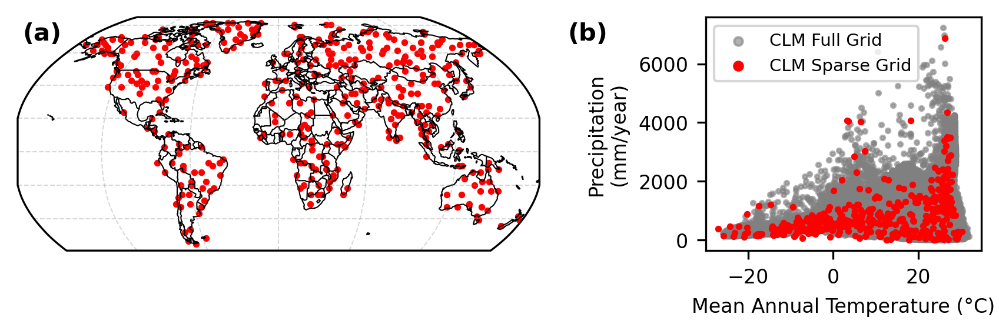

In [24]:
# --- Set figure size ---
width_mm = 169
width_in = width_mm / 25.4
height_in = width_in * 0.3  # Adjust as needed

fig = plt.figure(dpi=300, figsize=(width_in, width_in*.3))

# --- Create grid layout: same height, different width if needed ---
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[3, 1], figure=fig)

# --- Panel (a): Robinson Map ---
ax1 = fig.add_subplot(gs[0], projection=ccrs.Robinson())
ax1.set_global()
ax1.set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())

# Features
ax1.coastlines(linewidth=0.5)
ax1.add_feature(cfeature.BORDERS, linewidth=0.5)
ax1.gridlines(draw_labels=False, linewidth=0.5, color='gray', alpha=0.3, linestyle='--')

# Points
ax1.scatter(lon_vals, lat_vals, color='red', s=3, transform=ccrs.PlateCarree(), alpha=1)

# Panel label
ax1.text(0.01, 0.98, '(a)', transform=ax1.transAxes,
         fontsize=10, fontweight='bold', va='top', ha='left')

# --- Panel (b): Scatter Plot ---
ax2 = fig.add_subplot(gs[1])

ax2.scatter(tas_vals, pr_vals, s=3, alpha=0.6, c='grey', label='CLM Full Grid')
ax2.scatter(ForcingsAnnual.TBOT-273.15, ForcingsAnnual.PREC*86400*365, c='red', s=3, label='CLM Sparse Grid')

ax2.set_xlabel("Mean Annual Temperature (°C)", fontsize=8)
ax2.set_ylabel("Precipitation\n(mm/year)", fontsize=8)
ax2.tick_params(labelsize=8)
ax2.legend(fontsize=7, markerscale=2, loc='upper left')

# Panel label
ax2.text(-0.5, 0.98, '(b)', transform=ax2.transAxes,
         fontsize=10, fontweight='bold', va='top', ha='left')


# --- Finalize layout ---
plt.tight_layout(w_pad=-4)
plt.savefig(repo_dir + '/figs/supp/S2.png',dpi=300, bbox_inches='tight', transparent=True)
plt.show()


### Supplemental Figure 3 ###

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


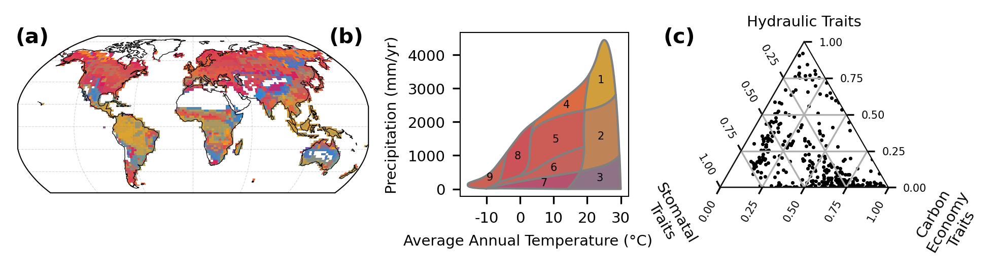

In [25]:
T_PFT = xr.open_dataset(repo_dir+'/output/ORGFAST_T.nc')
T_PFT = plotppgp(T_PFT)
fig1(T_PFT, '', plot_name = '/supp/S3.png', a = '(a)', b='(b)', c = '(c)', save = True)

### Suplemental Figures 4 ###

In [26]:
GPPDroughtSens3Year_PFT = xr.open_dataset(repo_dir + '/supplement/output/ORGFAST_GPPDroughtSens3Year.nc')
TDroughtSens3Year_PFT = xr.open_dataset(repo_dir + '/supplement/output/ORGFAST_TDroughtSens3Year.nc')
GPPDroughtSensSlope_PFT = xr.open_dataset(repo_dir + '/supplement/output/ORGFAST_GPPDroughtSensSlope.nc')
TDroughtSensSlope_PFT = xr.open_dataset(repo_dir + '/supplement/output/ORGFAST_TDroughtSensSlope.nc')

GPPDroughtSens3Year_PFT=plotppgp(GPPDroughtSens3Year_PFT)
TDroughtSens3Year_PFT = plotppgp(TDroughtSens3Year_PFT)
GPPDroughtSensSlope_PFT = plotppgp(GPPDroughtSensSlope_PFT)
TDroughtSensSlope_PFT = plotppgp(TDroughtSensSlope_PFT)

In [27]:
titles = [
    'GPP Drought Sensitivity\n3 Most Stressed Years',
    'T Drought Sensitivity\n3 Most Stressed Years',
    'GPP Drought Sensitivity\nGPP~β Slope',
    'T Drought Sensitivity\nT~β Slope'
]

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


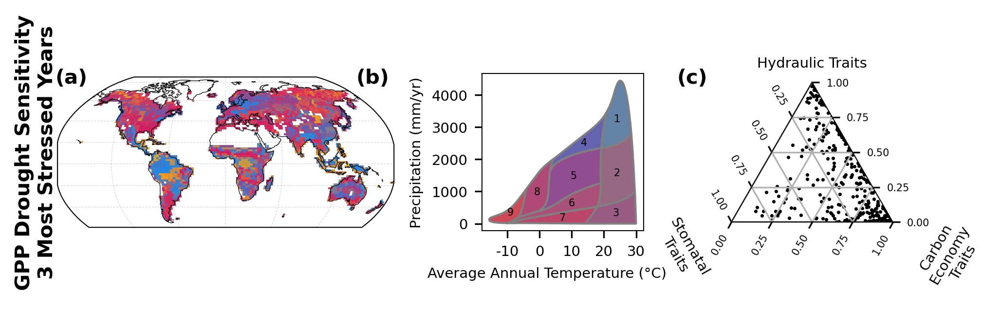

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


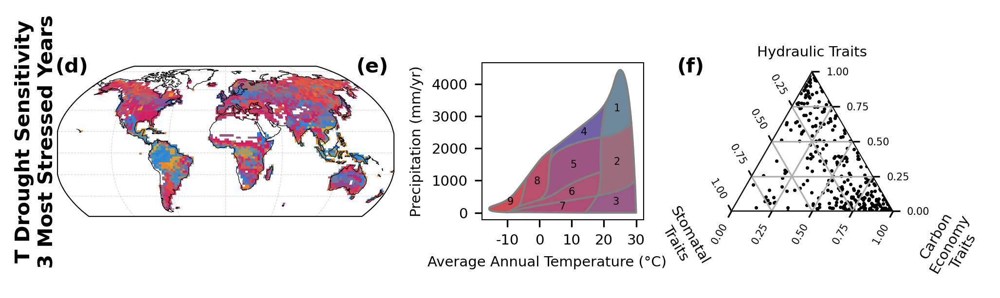

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


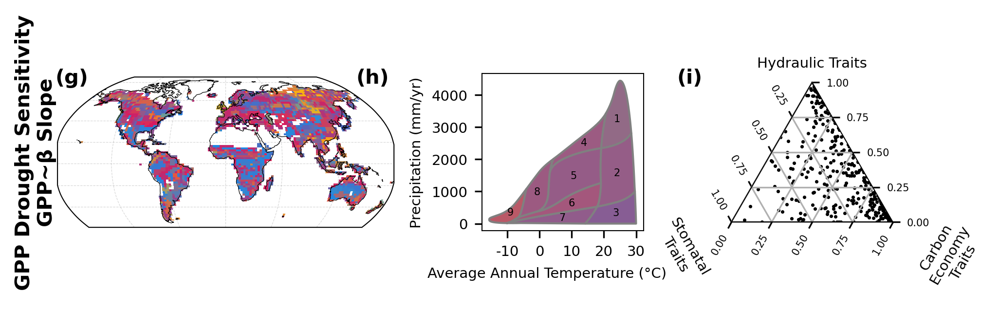

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


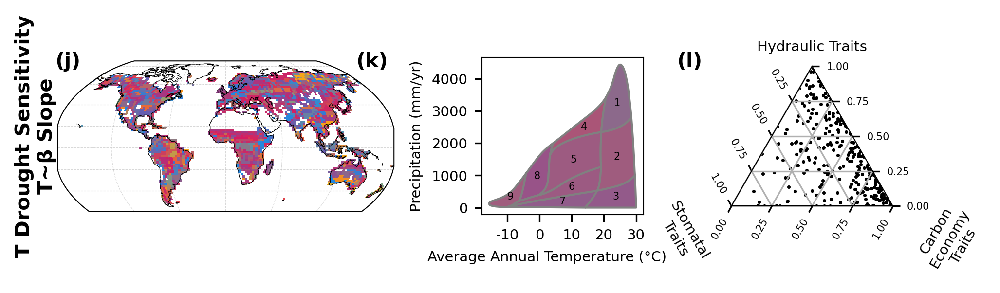

In [28]:
fig1(GPPDroughtSens3Year_PFT, titles[0], plot_name = '/supp/S4abc.png', a = '(a)', b='(b)', c = '(c)', save = True)
fig1(TDroughtSens3Year_PFT, titles[1], plot_name = '/supp/S4def.png', a = '(d)', b='(e)', c = '(f)', save = True)
fig1(GPPDroughtSensSlope_PFT, titles[2], plot_name = '/supp/S4ghi.png', a = '(g)', b='(h)', c = '(i)', save = True)
fig1(TDroughtSensSlope_PFT, titles[3], plot_name = '/supp/S4jkl.png', a = '(j)', b='(k)', c = '(l)', save = True)

### Suplemental Figures 5 ###

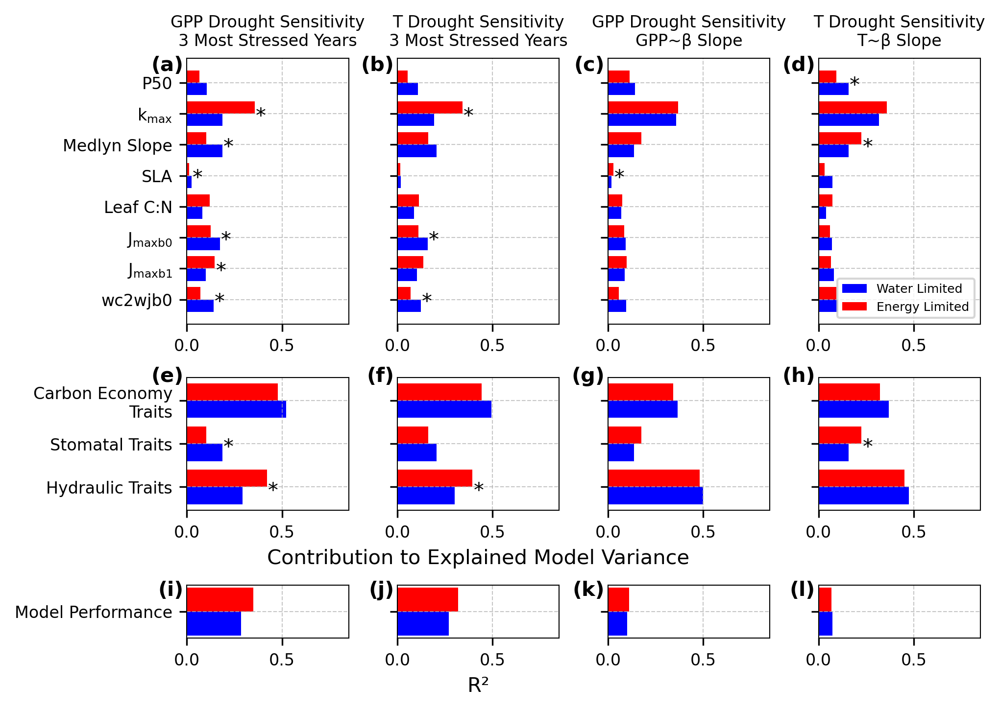

In [29]:
# List of datasets and corresponding titles
datasets = [GPPDroughtSens3Year_PFT, TDroughtSens3Year_PFT, GPPDroughtSensSlope_PFT, TDroughtSensSlope_PFT]
titles = [
    'GPP Drought Sensitivity\n3 Most Stressed Years',
    'T Drought Sensitivity\n3 Most Stressed Years',
    'GPP Drought Sensitivity\nGPP~β Slope',
    'T Drought Sensitivity\nT~β Slope'
]
# Define trait groupings
hydraulic_traits = ['kmax', 'psi50']
carbon_economy_traits = ['leafcn', 'slatop', 'jmaxb0', 'jmaxb1', 'wc2wjb0']
stomatal_traits = ['medlynslope']
group_names = ['Hydraulic Traits', 'Stomatal Traits', 'Carbon Economy\nTraits']

# Set up figure with 2 rows and 3 columns (datasets are columns, traits vs. groups are rows)
# Increase the overall figure width and use custom width_ratios to give Panel 1 more space.
figure_width_mm = 169
figure_height_mm = 120

# Convert millimeters to inches
figure_width_inches = figure_width_mm / 25.4
figure_height_inches = figure_height_mm / 25.4

fig, ax = plt.subplots(3, 4, figsize=(figure_width_inches, figure_height_inches), gridspec_kw={'height_ratios': [10, 5, 2]}, dpi = 300, constrained_layout=True)

ylabels = [
    'P50',
    r'$\mathrm{k}_{\mathrm{max}}$',
    'Medlyn Slope',
    'SLA',
    'Leaf C:N',
    r'$\mathrm{J}_{\mathrm{maxb0}}$',
    r'$\mathrm{J}_{\mathrm{maxb1}}$',
    'wc2wjb0'
]

trait_order = ['wc2wjb0', 'jmaxb1',  'jmaxb0', 'leafcn', 'slatop', 'medlynslope', 'kmax', 'psi50']

for col_idx, (data, title) in enumerate(zip(datasets, titles)):

    data = data.sel(trait = trait_order)
    data = data.where(veg_mask)
    data_r2 = data
    data = data.where(data.r2_test > .1, drop = True)
    

    ### ROW 1: Individual Traits ###
    # Means
    testW = data.S1.where(inds.ELI > 0, drop=True).mean(dim='gridcell').to_dataframe().reset_index()
    testE = data.S1.where(inds.ELI < 0, drop=True).mean(dim='gridcell').to_dataframe().reset_index()

    # Standard deviations
    testW_std = data.S1.where(inds.ELI > 0, drop=True).std(dim='gridcell').to_dataframe().reset_index()
    testE_std = data.S1.where(inds.ELI < 0, drop=True).std(dim='gridcell').to_dataframe().reset_index()

    testW['ELI'] = 'Water Limited'
    testE['ELI'] = 'Energy Limited'

    testW['std_dev'] = testW_std['S1']
    testE['std_dev'] = testE_std['S1']

    df = pd.concat([testW, testE])

    p_value_list_1 = []
    for trait in data.trait.values:
        group1 = data.sel(trait=trait).S1.where(inds.ELI > 0, drop=True).values
        group1 = group1[~np.isnan(group1)]

        group2 = data.sel(trait=trait).S1.where(inds.ELI < 0, drop=True).values
        group2 = group2[~np.isnan(group2)]

        statistic, p_value = stats.mannwhitneyu(group1, group2)
        p_value_list_1.append(p_value)

    pvalue1df = pd.DataFrame({'trait': data.trait.values, 'pvalue': p_value_list_1})

    # Merge the p-values into the main dataframe
    merged_df_all_traits = df.merge(pvalue1df, on="trait", how="left")

    # Separate the data by ELI
    water_limited = merged_df_all_traits[merged_df_all_traits['ELI'] == 'Water Limited']
    energy_limited = merged_df_all_traits[merged_df_all_traits['ELI'] == 'Energy Limited']

    # Define the x positions for the traits
    x = np.arange(len(water_limited))

    # Width of the bars
    bar_width = 0.4
    
    # Plot water-limited bars
    bars1 = ax[0, col_idx].barh(x - bar_width / 2, water_limited['S1'], bar_width, color='blue', label='Water Limited')

    # Plot energy-limited bars
    bars2 = ax[0, col_idx].barh(x + bar_width / 2, energy_limited['S1'], bar_width, color='red', label='Energy Limited')

    # Add asterisks for significant p-values (only one per trait)
    for i, trait in enumerate(trait_order):
        pval = water_limited.iloc[i]['pvalue']
        if not np.isnan(pval) and pval < 0.05:
            max_width = max(bars1[i].get_width(), bars2[i].get_width())
            ax[0, col_idx].text(max_width + 0.005, bars1[i].get_y() + bar_width * 0.75, '*', va='center', color='black', fontsize=10)

    ax[0, col_idx].set_yticks(x)
    ax[0, col_idx].set_yticklabels(ylabels[::-1])
    ax[0, col_idx].set_title(title, fontsize=8)

    ### ROW 2: Trait Groups ###
    hydraulic_W = data.H.where(inds.ELI > 0, drop=True)
    hydraulic_E = data.H.where(inds.ELI < 0, drop=True)

    stomatal_W = data.S.where(inds.ELI > 0, drop=True)
    stomatal_E = data.S.where(inds.ELI < 0, drop=True)

    carbon_economy_W = data.CE.where(inds.ELI > 0, drop=True)
    carbon_economy_E = data.CE.where(inds.ELI < 0, drop=True)

    pvalue2df2 = pd.DataFrame({'trait': group_names * 2,
                               'S1': [hydraulic_W.mean().values, stomatal_W.mean().values, carbon_economy_W.mean().values,
                                      hydraulic_E.mean().values, stomatal_E.mean().values, carbon_economy_E.mean().values],
                               'ELI': ['Water Limited', 'Water Limited', 'Water Limited',
                                       'Energy Limited', 'Energy Limited', 'Energy Limited']})

    water_limited_group = pvalue2df2[pvalue2df2['ELI'] == 'Water Limited']
    energy_limited_group = pvalue2df2[pvalue2df2['ELI'] == 'Energy Limited']

    x = np.arange(len(water_limited_group))

    bars1 = ax[1, col_idx].barh(x - bar_width / 2, water_limited_group['S1'], bar_width, color='blue', label='Water Limited')
    bars2 = ax[1, col_idx].barh(x + bar_width / 2, energy_limited_group['S1'], bar_width, color='red', label='Energy Limited')

    # Add asterisks for significant differences in the trait groups
    for i, trait in enumerate(water_limited_group['trait']):
        pval = stats.mannwhitneyu(
            hydraulic_W.where(~hydraulic_W.isnull(), drop = True).values if trait == "Hydraulic Traits" else 
            stomatal_W.where(~stomatal_W.isnull(), drop = True).values if trait == "Stomatal Traits" else 
            carbon_economy_W.where(~carbon_economy_W.isnull(), drop = True).values,
            
            hydraulic_E.where(~hydraulic_E.isnull(), drop = True).values if trait == "Hydraulic Traits" else 
            stomatal_E.where(~stomatal_E.isnull(), drop = True).values if trait == "Stomatal Traits" else 
            carbon_economy_E.where(~carbon_economy_E.isnull(), drop = True).values
        )[1]  # Extract p-value
    
        if not np.isnan(pval) and pval < 0.05:
            max_width = max(bars1[i].get_width(), bars2[i].get_width())
            ax[1, col_idx].text(max_width + 0.005, bars1[i].get_y() + bar_width * 0.75, '*', 
                                va='center', color='black', fontsize=10)
        
    ax[1, col_idx].set_yticks(x)
    ax[1, col_idx].set_yticklabels(group_names)

    ### ROW 3: R² by regime ###
    r2 = data_r2.r2_test.where(veg_mask)
    r2 = r2.where(r2 > 0, 0)
    
    r2_W = r2.where(inds.ELI > 0, drop=True).values
    r2_E = r2.where(inds.ELI < 0, drop=True).values
    r2_W = r2_W[~np.isnan(r2_W)]
    r2_E = r2_E[~np.isnan(r2_E)]

    mean_W = np.nanmean(r2_W) if r2_W.size else np.nan
    mean_E = np.nanmean(r2_E) if r2_E.size else np.nan

    x3 = np.array([0])  # single category "R²"
    bars1 = ax[2, col_idx].barh(x3 - bar_width/2, [mean_W], bar_width, color='blue',  label='Water Limited')
    bars2 = ax[2, col_idx].barh(x3 + bar_width/2, [mean_E], bar_width, color='red',   label='Energy Limited')

    # significance star
    pval_r2 = np.nan
    if r2_W.size and r2_E.size:
        try:
            pval_r2 = stats.mannwhitneyu(r2_W, r2_E).pvalue
        except Exception:
            pval_r2 = np.nan

    if np.isfinite(mean_W) and np.isfinite(mean_E) and (not np.isnan(pval_r2)) and (pval_r2 < 0.05):
        max_width = max(bars1[0].get_width(), bars2[0].get_width())
        ax[2, col_idx].text(max_width + 0.005,
                            bars1[0].get_y() + bar_width*0.75,
                            '*', va='center', color='black', fontsize=10)

    ax[2, col_idx].set_yticks(x3)
    ax[2, col_idx].set_yticklabels(['Model Performance'])
    
# Global x-axis label
ax[1, 1].set_xlabel('Contribution to Explained Model Variance', fontsize=10)
ax[2, 1].set_xlabel('R²', fontsize=10)

for i in range(3):  # Rows
    for j in range(4):  # Columns
        ax[i, j].grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
        ax[i, j].set_xlim(0, 0.85)
        ax[i, j].tick_params(axis='y', which='major', labelsize=8)
        ax[i, j].tick_params(axis='x', which='major', labelsize=8)
        if j > 0:  # Hide y-axis labels for columns 2 and 3
            ax[i, j].set_yticklabels([])
            ax[i, j].set_ylabel("")
        if ((j > 2) & (i == 0)):
            ax[i, j].legend(fontsize = 6, loc = 'lower right')


# Add annotations (a), (b), and (c) to the top-left of each subplot in the first row
annotations = ['(a)', '(b)', '(c)', '(d)']
for col_idx in range(4):  # Iterate over the 3 top row subplots
    ax[0, col_idx].text(-0.02, 1.01, annotations[col_idx], transform=ax[0, col_idx].transAxes,
                         fontsize=10, fontweight='bold', va='top', ha='right')
annotations = ['(e)', '(f)', '(g)', '(h)']
for col_idx in range(4):  # Iterate over the 3 top row subplots
    ax[1, col_idx].text(-0.02, 1.08, annotations[col_idx], transform=ax[1, col_idx].transAxes,
                         fontsize=10, fontweight='bold', va='top', ha='right')

annotations = ['(i)', '(j)', '(k)', '(l)']
for col_idx in range(4):
    ax[2, col_idx].text(-0.02, 1.08, annotations[col_idx],
                        transform=ax[2, col_idx].transAxes,
                        fontsize=10, fontweight='bold', va='top', ha='right')
#plt.tight_layout()
#plt.subplots_adjust(
#    wspace=0.22,  # horizontal spacing (default ~0.2–0.3)
#    hspace=0.3   # vertical spacing (default ~0.4)
#)

for row in ax:
    for a in row:
        for spine in a.spines.values():
            spine.set_linewidth(0.5)  # thinner border (default ~1)

plt.savefig(repo_dir+'/figs/supp/S5.png', transparent = True, bbox_inches='tight')

plt.show()

### Suplemental Figures 6 ###

In [30]:
def figs6(data, title, plot_name, a = 'a', b ='b', c= 'c', save = False): 
    # -------------------------------
    # Panel 1: Cartopy Map Plot
    # -------------------------------
    data1 = data.copy()
    data1 = data1.where(veg_mask)
    
    # Compute normalized components
    brown = data1.Mean
    green = data1.Diversity
    white = data1.Universals
    
    brown_norm = (brown - brown.min()) / (brown.max() - brown.min())
    green_norm = (green - green.min()) / (green.max() - green.min())
    white_norm = (white - white.min()) / (white.max() - white.min())
    
    brown_norm_rgb = np.outer(brown_norm, np.array([84*2/255, 48*2/255, 5*2/255]))
    green_norm_rgb = np.outer(green_norm, np.array([0*2/255, 60*2/255, 48*2/255]))
    white_norm_rgb = np.outer(white_norm, np.array([200/255, 200/255, 200/255]))
    colors1 = brown_norm_rgb + green_norm_rgb + white_norm_rgb
    
    data1['color'] = xr.DataArray(
        colors1,
        dims=['gridcell', 'rgb'],
        coords={'gridcell': np.arange(400), 'rgb': ['r','g','b']}
    )
    
    map_data = get_map(data1, file=repo_dir+'/utils/sgmap.nc').sel(lat=slice(-54, None))
    map_data = map_data.assign_coords(lon=((map_data.lon + 180) % 360) - 180).sortby("lon")
    color_data = map_data['color'].values
    color_data = masked_array(color_data, np.isnan(color_data))
    
    # -------------------------------
    # Panel 2: Biome Plot via Geopandas
    # -------------------------------
    data2 = data.copy().where(veg_mask)
    data2 = data2.where(data2.r2_test > .1)

    
    brown = data2.Mean
    green = data2.Diversity
    white = data2.Universals
    
    brown_norm = (brown - brown.min()) / (brown.max() - brown.min())
    green_norm = (green - green.min()) / (green.max() - green.min())
    white_norm = (white - white.min()) / (white.max() - white.min())
    
    brown_norm_rgb = np.outer(brown_norm, np.array([84*2/255, 48*2/255, 5*2/255]))
    green_norm_rgb = np.outer(green_norm, np.array([0*2/255, 60*2/255, 48*2/255]))
    white_norm_rgb = np.outer(white_norm, np.array([200/255, 200/255, 200/255]))
    colors2 = brown_norm_rgb + green_norm_rgb + white_norm_rgb
    
    data2['color'] = xr.DataArray(
        colors2,
        dims=['gridcell', 'rgb'],
        coords={'gridcell': np.arange(400), 'rgb': ['r','g','b']}
    )
    
    # Group by biome (assuming inds.biome exists) and compute the mean, dropping biome==0.
    data2_grouped = data2.groupby(inds.biome).mean().drop_sel(biome=0)
    colors_array = data2_grouped.color.values  # each row is an RGB triplet
    cmap = ListedColormap(colors_array)
    biomes_list = list(data2_grouped.coords['biome'].values)
    
    whitpol = gpd.read_file(repo_dir + '/whit/whittaker.shp')
    whitpol.crs = None
    whitpol.loc[whitpol["biome"] == "Tundra", "B_ID"] = 9
    whitpol.loc[whitpol["biome"] == "Boreal forest", "B_ID"] = 8
    whitpol.loc[whitpol["biome"] == "Temperate grassland/desert", "B_ID"] = 7
    whitpol.loc[whitpol["biome"] == "Woodland/shrubland", "B_ID"] = 6
    whitpol.loc[whitpol["biome"] == "Temperate seasonal forest", "B_ID"] = 5
    whitpol.loc[whitpol["biome"] == "Temperate rain forest", "B_ID"] = 4
    whitpol.loc[whitpol["biome"] == "Tropical rain forest", "B_ID"] = 1
    whitpol.loc[whitpol["biome"] == "Tropical seasonal forest/savanna", "B_ID"] = 2
    whitpol.loc[whitpol["biome"] == "Subtropical desert", "B_ID"] = 3
    whitpol['centroid'] = whitpol.geometry.centroid
    whitpol['X'] = whitpol.centroid.x
    whitpol['Y'] = whitpol.centroid.y
    whitpol["label"] = whitpol["biome"] + " (" + whitpol["b_score"].astype(str) + ")"
    
    # -------------------------------
    # Panel 3: Ternary Plot via mpltern
    # -------------------------------
    data2 = data.copy().where(veg_mask)
    r_values = data2.Mean.values
    y_values = data2.Universals.values
    b_values = data2.Diversity.values
    
    # -------------------------------
    # Create Combined Figure with 3 Subpanels
    # -------------------------------
    # Increase the overall figure width and use custom width_ratios to give Panel 1 more space.
    figure_width_mm = 169
    figure_height_mm = 120
    
    # Convert millimeters to inches
    figure_width_inches = figure_width_mm / 25.4
    figure_height_inches = figure_height_mm / 25.4

    fig = plt.figure(figsize=(figure_width_inches, figure_height_inches), dpi = 300)
    gs = gridspec.GridSpec(1, 3, width_ratios=[2.5, 1.2, 1.2])
    
    # Panel 1: Cartopy map with Robinson projection
    ax1 = fig.add_subplot(gs[0], projection=ccrs.Robinson(central_longitude=0))
    ax1.set_extent([map_data.lon.min(), map_data.lon.max(), -60, map_data.lat.max()], crs=ccrs.PlateCarree())
    ax1.imshow(
        color_data,
        origin='lower',
        transform=ccrs.PlateCarree(),
        extent=(map_data.lon.min(), map_data.lon.max(), map_data.lat.min(), map_data.lat.max()),
        interpolation='none'
    )
    ax1.coastlines(linewidth=0.3)
    ax1.gridlines(draw_labels=False, linewidth=0.3, color='gray', linestyle='--', alpha = 0.3)
    
    # Panel 2: Biome plot
    ax2 = fig.add_subplot(gs[1])
    whitpol.plot(column="B_ID", cmap=cmap, edgecolor="gray", linewidth=1, ax=ax2, legend=False)
    for idx, row in whitpol.iterrows():
        ax2.text(row['X'], row['Y'], str(int(row['B_ID'])), 
                 fontsize=5, color='black', ha='center', va='center')
    def scale_yticks(y, _):
        return f"{int(y * 100)}"
    ax2.yaxis.set_major_formatter(mticker.FuncFormatter(scale_yticks))
    ax2.set_xlabel("Average Annual Temperature (°C)          ", fontsize=7)
    ax2.set_ylabel("Precipitation (mm/yr)", fontsize=7)
    ax2.tick_params(labelsize=7)
    ax2.set_xticks([-10, 0, 10, 20, 30])
    ax2.set_xticklabels(['-10', '0', '10', '20', '30'])
    
    # Panel 3: Ternary plot
    ax3 = fig.add_subplot(gs[2], projection="ternary")
    ax3.scatter(b_values, y_values, r_values, c='black', s=.5)
    ax3.set_llabel('Global\nTraits', fontsize=8)
    ax3.set_rlabel('Trait\nMeans', fontsize=8)
    ax3.set_tlabel('Trait CVs', fontsize=8)
    
    ax3.tick_params(labelsize=5)
    ax3.grid()
    custom_ticks = [0, 0.25, 0.5, 0.75, 1.0]
    ax3.taxis.set_ticks(custom_ticks)  # Top axis (Hydraulic)
    ax3.laxis.set_ticks([0.25, 0.5, 0.75, 1.0])  # Left axis (Stomatal)
    ax3.raxis.set_ticks(custom_ticks)  # Right axis (Carbon Economy)
    
    fig.text(0.02, 0.6, f'({a})', fontsize=10, fontweight='bold', transform=fig.transFigure)
    fig.text(0.35, 0.6, f'({b})', fontsize=10, fontweight='bold', transform=fig.transFigure)
    fig.text(0.66, 0.6,  f'({c})', fontsize=10, fontweight='bold', transform=fig.transFigure)
        
    for spine in ax3.spines.values():
        spine.set_linewidth(0.5)
    # Thin the borders for ax1 (Cartopy map)
    for spine in ax1.spines.values():
        spine.set_linewidth(0.5)
    # Thin the borders for ax2 (Whitaker plot)
    for spine in ax2.spines.values():
        spine.set_linewidth(0.5)
    
    fig.text(-0.02, 0.5, title, rotation=90, fontsize=10, fontweight='bold', va='center', ha='center', transform=fig.transFigure)
    

    fig.tight_layout()
    plt.subplots_adjust(wspace=0.35)
    
    if save == True:
        plt.savefig(repo_dir+'/figs/supp/'+plot_name, transparent = True, bbox_inches='tight')
    plt.show()

In [31]:
GPPDroughtSens3Year_GC = xr.open_dataset(repo_dir + '/supplement/output/ECOFAST_GPPDroughtSens3Year.nc')
TDroughtSens3Year_GC = xr.open_dataset(repo_dir + '/supplement/output/ECOFAST_TDroughtSens3Year.nc')
GPPDroughtSensSlope_GC = xr.open_dataset(repo_dir + '/supplement/output/ECOFAST_GPPDroughtSensSlope.nc')
TDroughtSensSlope_GC = xr.open_dataset(repo_dir + '/supplement/output/ECOFAST_TDroughtSensSlope.nc')

GPPDroughtSens3Year_GC=plotppgp_GC(GPPDroughtSens3Year_GC)
TDroughtSens3Year_GC = plotppgp_GC(TDroughtSens3Year_GC)
GPPDroughtSensSlope_GC = plotppgp_GC(GPPDroughtSensSlope_GC)
TDroughtSensSlope_GC = plotppgp_GC(TDroughtSensSlope_GC)

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


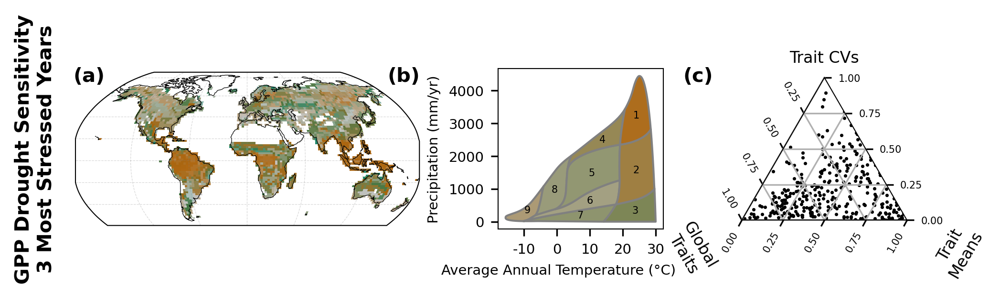

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


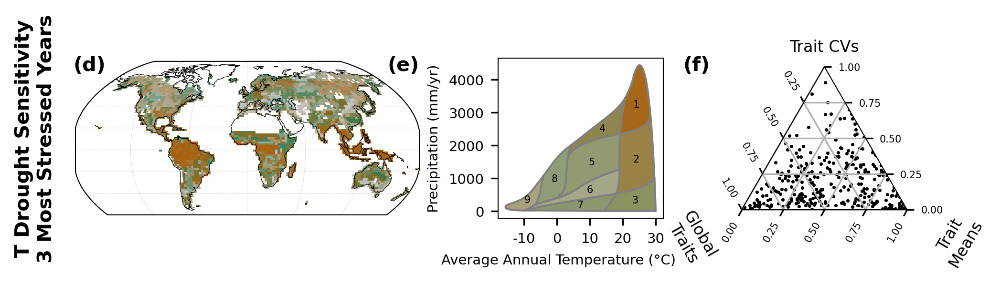

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


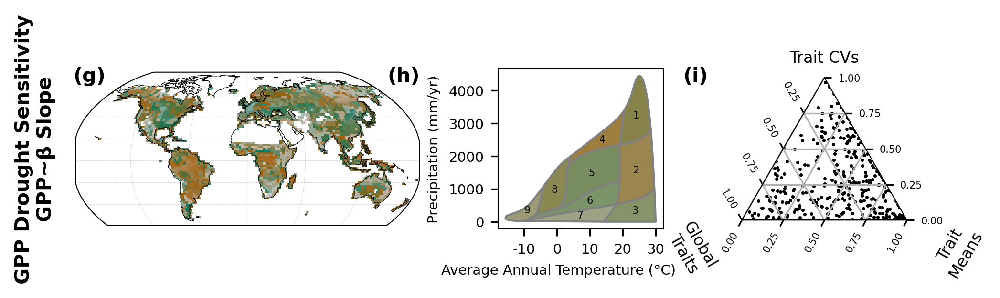

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


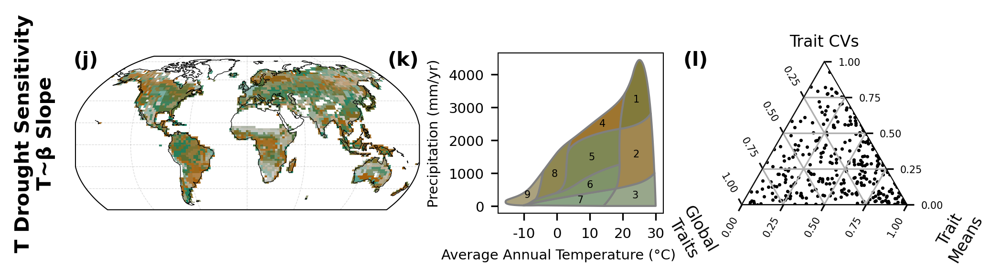

In [32]:
titles = [
    'GPP Drought Sensitivity\n3 Most Stressed Years',
    'T Drought Sensitivity\n3 Most Stressed Years',
    'GPP Drought Sensitivity\nGPP~β Slope',
    'T Drought Sensitivity\nT~β Slope'
]
#titles = ["", "", "", ""]


figs6(GPPDroughtSens3Year_GC, title = titles[0], plot_name = 'S6abc.png', a = 'a', b = 'b', c = 'c', save = True)
figs6(TDroughtSens3Year_GC, title = titles[1], plot_name = 'S6def.png', a = 'd', b = 'e', c = 'f',save = True)
figs6(GPPDroughtSensSlope_GC, title = titles[2], plot_name = 'S6ghi.png', a = 'g', b = 'h', c = 'i',save = True)
figs6(TDroughtSensSlope_GC, title = titles[3], plot_name = 'S6jkl.png', a = 'j', b = 'k', c = 'l',save = True)

### Supplemental Figure 7 ###

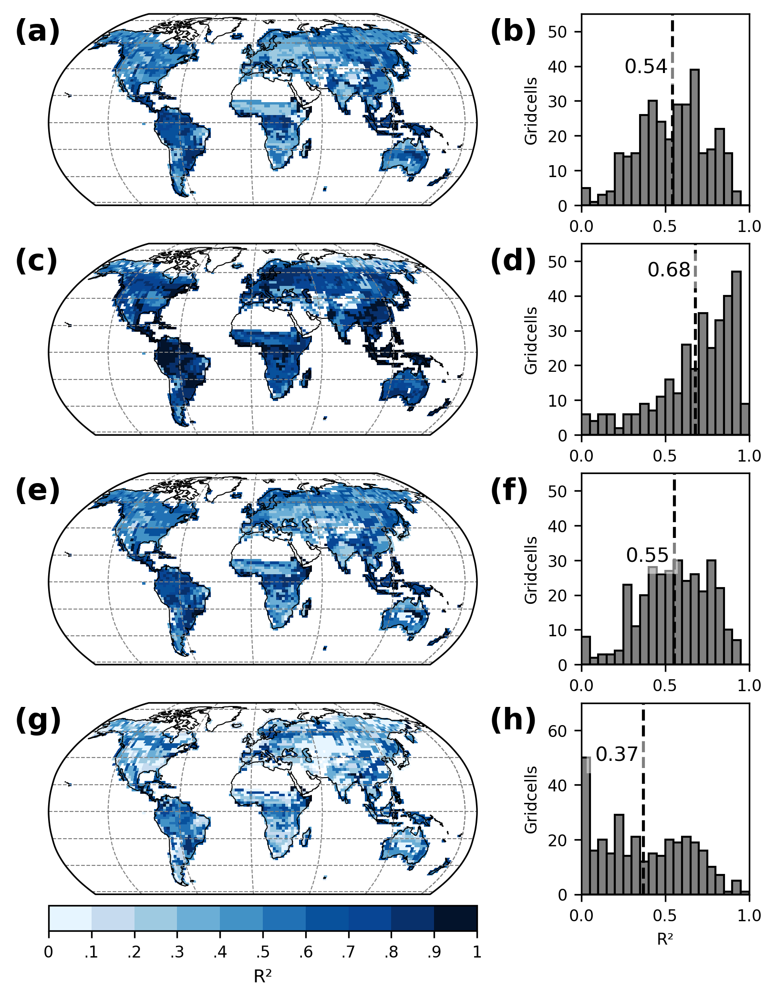

In [39]:
# --- Define custom "Confidence Blue" colormap (10 colors) ---
colors = [
    (230/255, 245/255, 255/255),
    (198/255, 219/255, 239/255),
    (158/255, 202/255, 225/255),
    (107/255, 174/255, 214/255),
    (66/255, 146/255, 198/255),
    (33/255, 113/255, 181/255),
    (8/255, 81/255, 156/255),
    (8/255, 69/255, 148/255),
    (8/255, 48/255, 107/255),
    (3/255, 19/255, 43/255),
]
cm = ListedColormap(colors)
bounds = np.linspace(0, 1, 11)                      # 10 bins
norm = BoundaryNorm(boundaries=bounds, ncolors=10)

datasets = [GPP_PFT, Stress_PFT, T_PFT, DroughtSens_PFT]
titles = ['GPP', 'Stress', 'Transpiration', 'Drought Sensitivity']

figure_width_mm = 169

figure_width_inches = figure_width_mm / 25.4
fig, axes = plt.subplots(
    nrows=4, ncols=2,
    figsize=(figure_width_inches, figure_width_inches*1.2),
    gridspec_kw={'width_ratios': [3, 1]},
    #constrained_layout=True,  # let MPL manage spacing
    dpi=300
)

for i, ds in enumerate(datasets):
    ds = ds.where(ds.r2_test > 0, 0)
    data = ds.r2_test.where(veg_mask)
    data_map = get_map(data, file=repo_dir+'/utils/sgmap.nc').sel(lat=slice(-54, None))

    # ---- LEFT: replace placeholder with a Cartopy axis in the SAME grid cell ----
    sp = axes[i, 0].get_subplotspec()   # grab the slot
    axes[i, 0].remove()                 # remove placeholder
    ax_map = fig.add_subplot(sp, projection=ccrs.Robinson(central_longitude=10.0))

    im = ax_map.pcolormesh(data_map.lon, data_map.lat, data_map, cmap=cm, norm=norm,
                           transform=ccrs.PlateCarree())
    ax_map.coastlines(linewidth=0.5)
    ax_map.gridlines(draw_labels=False, linewidth=0.5, color='gray', linestyle='--')
    ax_map.text(-0.08, 0.98, f"({chr(97 + 2*i)})", transform=ax_map.transAxes,
                fontsize=15, fontweight='bold', va='top', ha='left')
    if i == len(datasets) - 1:
        bottom_map_ax = ax_map
        last_im = im
    
    # ---- RIGHT: use the existing histogram axis from the same row ----
    ax_hist = axes[i, 1]
    r2_vals = np.asarray(data.values).ravel()
    r2_vals = r2_vals[np.isfinite(r2_vals)]
    mean_r2 = float(np.mean(r2_vals)) if r2_vals.size else np.nan

    ax_hist.hist(r2_vals, bins=20, range=(0, 1), color='gray', edgecolor='black')
    if np.isfinite(mean_r2):
        ax_hist.axvline(mean_r2, color='black', linestyle='--')
        ax_hist.text(mean_r2 - 0.29, ax_hist.get_ylim()[1]*0.90,
                     f"{mean_r2:.2f}", fontsize=10, va='bottom', ha='left',
                     bbox=dict(facecolor='white', edgecolor='none',alpha = 0.5))

    ax_hist.set_xlim(0, 1)
    ax_hist.set_ylim(0, 55 if i < 3 else 70)
    ax_hist.set_ylabel("Gridcells", fontsize=8)
    ax_hist.tick_params(axis='both', labelsize=8)
    ax_hist.text(-0.55, 0.98, f"({chr(97 + 2*i + 1)})", transform=ax_hist.transAxes,
                 fontsize=15, fontweight='bold', va='top', ha='left')
    axes[i,1].set_xlabel("", fontsize=8)

axes[i,1].set_xlabel("R²", fontsize=8)
# Shared mappable using your discrete colormap/norm
# --- Horizontal colorbar under the bottom map only ---
# Make sure layout is finalized before reading positions
fig.canvas.draw()

# Get the bottom-left map position (in figure coords)
bbox = bottom_map_ax.get_position()
cbar_h = 0.022     # height of the colorbar (relative to figure)
pad    = 0.010     # gap between map and colorbar

# y of the colorbar (don’t let it go off the figure)
cbar_y = max(0.02, bbox.y0 - pad - cbar_h)

# Create a brand-new axes for the colorbar; this will NOT resize the map
cax = fig.add_axes([bbox.x0, cbar_y, bbox.width, cbar_h])

# Horizontal colorbar using the same mappable/norm
tick_vals = np.linspace(0, 1, 11)
cb = fig.colorbar(
    last_im, cax=cax, orientation='horizontal',
    ticks=tick_vals, boundaries=bounds
)
cb.set_label("R²", fontsize=9)
cb.set_ticklabels(['0'] + [f'.{i}' for i in range(1, 10)] + ['1'])
cb.ax.tick_params(labelsize=8)

fig.set_constrained_layout_pads(w_pad=0.02, h_pad=0.02, hspace=0.1, wspace=0.002)
plt.savefig(repo_dir+'/figs/supp/S7.png', transparent = True, bbox_inches='tight', dpi = 300)
plt.show()


### Supplemental Figure 8 ###

In [40]:
#results RF
RF_GPP_PFT = xr.open_dataset(repo_dir + '/supplement/output/ORGFAST_RF_GPP.nc')
RF_Stress_PFT = xr.open_dataset(repo_dir + '/supplement/output/ORGFAST_RF_Stress.nc')
RF_DroughtSens_PFT = xr.open_dataset(repo_dir + '/supplement/output/ORGFAST_RF_DroughtSens.nc')

In [41]:
def plotpprf(data):
    hydraulic_traits = ['kmax', 'psi50']
    carbon_economy_traits = ['leafcn', 'slatop', 'jmaxb0', 'jmaxb1', 'wc2wjb0']
    stomatal_traits =  ['medlynslope']
    
    all_traits = hydraulic_traits+carbon_economy_traits+stomatal_traits
    
    data['H'] = data.sel(trait = hydraulic_traits).ImportanceStandard.sum(dim = 'trait') / data.sel(trait = all_traits).ImportanceStandard.sum(dim = 'trait')
    data['CE'] = data.sel(trait = carbon_economy_traits).ImportanceStandard.sum(dim = 'trait') / data.sel(trait = all_traits).ImportanceStandard.sum(dim = 'trait')
    data['S'] = data.sel(trait = stomatal_traits).ImportanceStandard.sum(dim = 'trait') / data.sel(trait = all_traits).ImportanceStandard.sum(dim = 'trait')

  
    new_data = data.apply(lambda x: x.where(np.isfinite(x), np.nan))

    return new_data

In [42]:
RF_GPP_PFT = plotpprf(RF_GPP_PFT)
RF_Stress_PFT = plotpprf(RF_Stress_PFT)
RF_DroughtSens_PFT = plotpprf(RF_DroughtSens_PFT)

In [43]:
def figS8(data, title, plot_name, a = '', b = '', c = '', save = False):
 
    # -------------------------------
    # Panel 1: Cartopy Map Plot
    # -------------------------------
    data1 = data.copy()
    data1 = data1.where(veg_mask)
    
    # Compute normalized components
    magenta = data1.CE
    blue = data1.H
    yellow = data1.S
    
    
    magenta_norm_rgb = np.outer(magenta,np.array([216/255, 27/255, 96/255])) # Magenta for CE
    blue_norm_rgb =  np.outer(blue,np.array([30/255, 136/255, 229/255]))  # Sky Blue for H
    yellow_norm_rgb = np.outer(yellow, np.array([255/255, 193/255, 7/255]))  # Yellow for LUNA
    colors1 = magenta_norm_rgb + blue_norm_rgb + yellow_norm_rgb
    
    data1['color'] = xr.DataArray(
        colors1,
        dims=['gridcell', 'rgb'],
        coords={'gridcell': np.arange(400), 'rgb': ['r','g','b']}
    )
    
    map_data = get_map(data1, file=repo_dir+'/utils/sgmap.nc').sel(lat=slice(-54, None))
    map_data = map_data.assign_coords(lon=((map_data.lon + 180) % 360) - 180).sortby("lon")
    color_data = map_data['color'].values
    color_data = masked_array(color_data, np.isnan(color_data))
    
    # -------------------------------
    # Panel 2: Biome Plot
    # -------------------------------
    data2 = data.copy().where(veg_mask)
    #data2 = data2.where(data2.r2_test > .1)
    
    magenta = data2.CE
    blue = data2.H
    yellow = data2.S
    
    magenta_norm_rgb = np.outer(magenta,np.array([216/255, 27/255, 96/255])) # Magenta for CE
    blue_norm_rgb =  np.outer(blue,np.array([30/255, 136/255, 229/255]))  # Sky Blue for H
    yellow_norm_rgb = np.outer(yellow, np.array([255/255, 193/255, 7/255]))  # Yellow for LUNA
    
    
    # Combine the RGB values by summing them
    colors2 = magenta_norm_rgb + blue_norm_rgb + yellow_norm_rgb
    
    data2['color'] = xr.DataArray(
        colors2,
        dims=['gridcell', 'rgb'],
        coords={'gridcell': np.arange(400), 'rgb': ['r','g','b']}
    )
    
    # Group by biome (assuming inds.biome exists) and compute the mean, dropping biome==0.
    data2_grouped = data2.groupby(inds.biome).mean().drop_sel(biome=0)
    colors_array = data2_grouped.color.values  # each row is an RGB triplet
    colors_array = np.clip(colors_array, None, 1)
    cmap = ListedColormap(colors_array)
    biomes_list = list(data2_grouped.coords['biome'].values)
    
    whitpol = gpd.read_file(repo_dir + '/whit/whittaker.shp')
    whitpol.crs = None
    whitpol.loc[whitpol["biome"] == "Tundra", "B_ID"] = 9
    whitpol.loc[whitpol["biome"] == "Boreal forest", "B_ID"] = 8
    whitpol.loc[whitpol["biome"] == "Temperate grassland/desert", "B_ID"] = 7
    whitpol.loc[whitpol["biome"] == "Woodland/shrubland", "B_ID"] = 6
    whitpol.loc[whitpol["biome"] == "Temperate seasonal forest", "B_ID"] = 5
    whitpol.loc[whitpol["biome"] == "Temperate rain forest", "B_ID"] = 4
    whitpol.loc[whitpol["biome"] == "Tropical rain forest", "B_ID"] = 1
    whitpol.loc[whitpol["biome"] == "Tropical seasonal forest/savanna", "B_ID"] = 2
    whitpol.loc[whitpol["biome"] == "Subtropical desert", "B_ID"] = 3
    whitpol['centroid'] = whitpol.geometry.centroid
    whitpol['X'] = whitpol.centroid.x
    whitpol['Y'] = whitpol.centroid.y
    whitpol["label"] = whitpol["biome"] + " (" + whitpol["b_score"].astype(str) + ")"
    
    # -------------------------------
    # Panel 3: Ternary Plot via mpltern
    # -------------------------------
    r_values = data2.CE.values
    y_values = data2.S.values
    b_values = data2.H.values
    
    # -------------------------------
    # Create Combined Figure with 3 Subpanels
    # -------------------------------
    # Increase the overall figure width and use custom width_ratios to give Panel 1 more space.
    figure_width_mm = 169
    figure_height_mm = 120
    
    # Convert millimeters to inches
    figure_width_inches = figure_width_mm / 25.4
    figure_height_inches = figure_height_mm / 25.4

    fig = plt.figure(figsize=(figure_width_inches, figure_height_inches), dpi = 300)
    gs = gridspec.GridSpec(1, 3, width_ratios=[2.5, 1.2, 1.2])
    
    # Panel 1: Cartopy map with Robinson projection
    ax1 = fig.add_subplot(gs[0], projection=ccrs.Robinson(central_longitude=0))
    ax1.set_extent([map_data.lon.min(), map_data.lon.max(), -60, map_data.lat.max()], crs=ccrs.PlateCarree())
    ax1.imshow(
        color_data,
        origin='lower',
        transform=ccrs.PlateCarree(),
        extent=(map_data.lon.min(), map_data.lon.max(), map_data.lat.min(), map_data.lat.max()),
        interpolation='none'
    )
    ax1.coastlines(linewidth=0.3)
    ax1.gridlines(draw_labels=False, linewidth=0.3, color='gray', linestyle='--', alpha = 0.3)
    
    # Panel 2: Biome plot
    ax2 = fig.add_subplot(gs[1])
    whitpol.plot(column="B_ID", cmap=cmap, edgecolor="gray", linewidth=1, ax=ax2, legend=False)
    for idx, row in whitpol.iterrows():
        ax2.text(row['X'], row['Y'], str(int(row['B_ID'])), 
                 fontsize=5, color='black', ha='center', va='center')
    def scale_yticks(y, _):
        return f"{int(y * 100)}"
    ax2.yaxis.set_major_formatter(mticker.FuncFormatter(scale_yticks))
    ax2.set_xlabel("Average Annual Temperature (°C)       ", fontsize=7)
    ax2.set_ylabel("Precipitation (mm/yr)", fontsize=7)
    ax2.tick_params(labelsize=7)
    ax2.set_xticks([-10, 0, 10, 20, 30])
    ax2.set_xticklabels(['-10', '0', '10', '20', '30'])
    ax2.set_yticks([0, 10, 20, 30, 40])
    #gs.update(wspace=0.7)
    # Panel 3: Ternary plot
    ax3 = fig.add_subplot(gs[2], projection="ternary")
    ax3.scatter(b_values, y_values, r_values, c='black', s=0.5)
    ax3.set_llabel('Stomatal\nTraits', fontsize=7)
    ax3.set_rlabel('Carbon\nEconomy\nTraits', fontsize=7)
    ax3.set_tlabel('Hydraulic Traits', fontsize=7)
    ax3.tick_params(labelsize=5)
    ax3.grid()
    custom_ticks = [0, 0.25, 0.5, 0.75, 1.0]
    ax3.taxis.set_ticks(custom_ticks)  # Top axis (Hydraulic)
    ax3.laxis.set_ticks([0.25, 0.5, 0.75, 1.0])  # Left axis (Stomatal)
    ax3.raxis.set_ticks(custom_ticks)  # Right axis (Carbon Economy)
    for spine in ax3.spines.values():
        spine.set_linewidth(0.5)
    # Thin the borders for ax1 (Cartopy map)
    for spine in ax1.spines.values():
        spine.set_linewidth(0.5)
    
    # Thin the borders for ax2 (Whitaker plot)
    for spine in ax2.spines.values():
        spine.set_linewidth(0.5)
    
    
    fig.text(0.02, 0.6, a, fontsize=10, fontweight='bold', transform=fig.transFigure)
    fig.text(0.33, 0.6, b, fontsize=10, fontweight='bold', transform=fig.transFigure)
    fig.text(0.66, 0.6, c, fontsize=10, fontweight='bold', transform=fig.transFigure)
    
    box = ax3.get_position()
    ax3.set_position([box.x0, box.y0, box.width, box.height])
    
    fig.text(-0.0, 0.5, title, rotation=90, fontsize=10, fontweight='bold', va='center', ha='center', transform=fig.transFigure)

    fig.tight_layout()
    plt.subplots_adjust(wspace=0.4)
    if save == True:
        plt.savefig(repo_dir+'/figs/supp/'+plot_name, transparent = True, dpi=300, bbox_inches=None)
    
    plt.show()

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


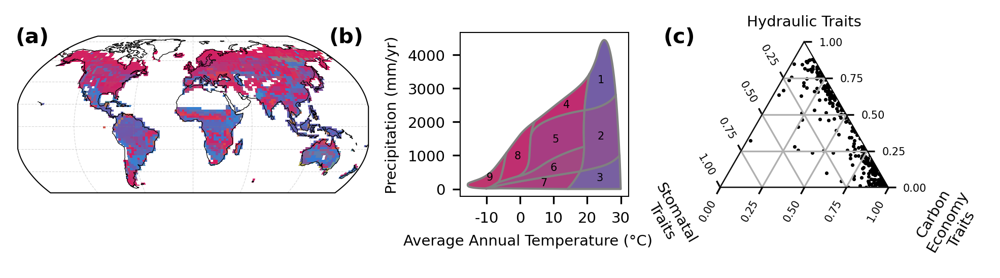

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


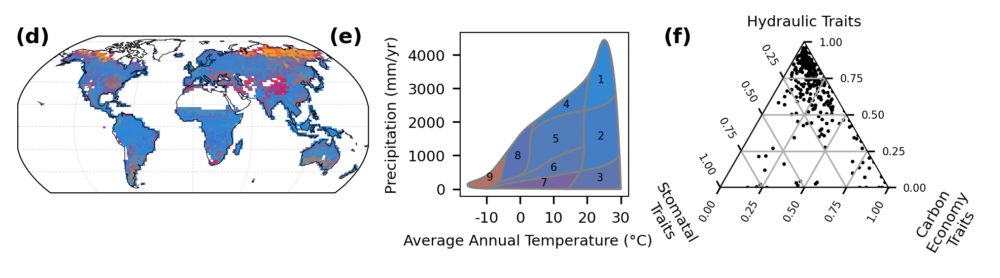

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


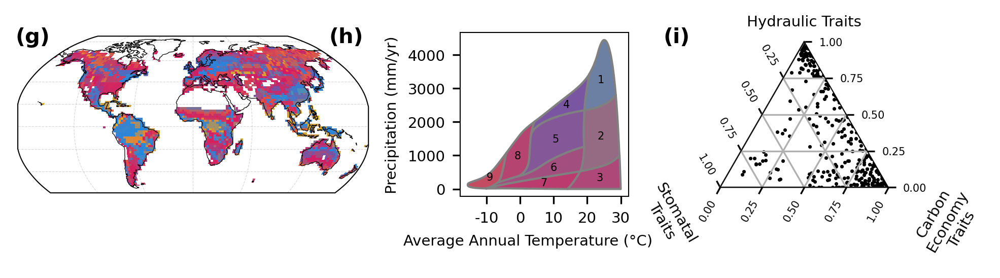

In [44]:
figS8(RF_GPP_PFT, '', 'S8abc.png', a='(a)', b = '(b)', c = '(c)', save = True)
figS8(RF_Stress_PFT, '', 'S8def.png', a='(d)', b = '(e)', c = '(f)', save = True)
figS8(RF_DroughtSens_PFT, '', 'S8ghi.png', a='(g)', b = '(h)', c = '(i)', save = True)

### Supplemental Figure 9 ###

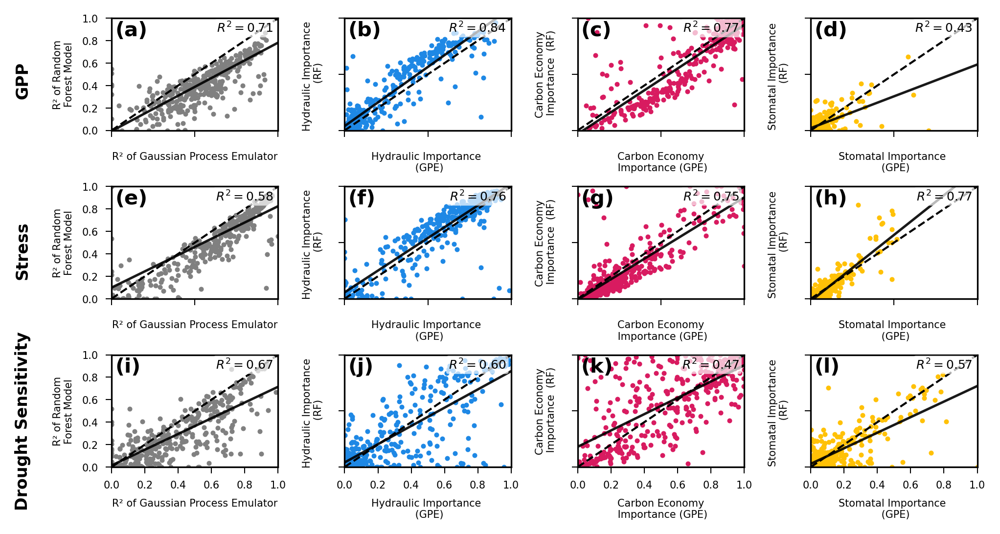

In [45]:
# Define trait colors
hydraulic_color = (30/255, 136/255, 229/255)
carbon_economy_color = (216/255, 27/255, 96/255)
stomatal_color = (255/255, 193/255, 7/255)

# List of datasets (each pair is GPE, RF)
datasets = [
    (GPP_PFT, RF_GPP_PFT),
    (Stress_PFT, RF_Stress_PFT),
    (DroughtSens_PFT, RF_DroughtSens_PFT)
]

titles = ['r2_test', 'H (Hydraulic)', 'CE (Carbon Economy)', 'S (Stomatal)']
colors = ['grey', hydraulic_color, carbon_economy_color, stomatal_color]
traits = ['r2_test', 'H', 'CE', 'S']

figure_width_mm = 169

# Convert millimeters to inches
figure_width_inches = figure_width_mm / 25.4

fig, axs = plt.subplots(3, 4, figsize=(figure_width_inches, figure_width_inches*(9/16)), dpi = 300)

for row, (gpe_data, rf_data) in enumerate(datasets):
    for col, (trait, color) in enumerate(zip(traits, colors)):
        ax = axs[row, col]

        gpe_data['r2_test'] = gpe_data.where(gpe_data.r2_test>0,0).r2_test
        rf_data['r2_test'] = rf_data.where(rf_data.r2_test>0,0).r2_test
        # Scatter plot
        ax.scatter(getattr(gpe_data, trait), getattr(rf_data, trait), color=color, s = 2)
        ax.plot([0, 1], [0, 1], linestyle='--', color='black', linewidth=1)
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        
        # Y label and ticks
        if col == 0:
            ax.set_ylabel(f"R² of Random\nForest Model", fontsize=5)
            ax.set_xlabel(f"R² of Gaussian Process Emulator", fontsize=5)
            ax.tick_params(axis='y', labelsize=5, length=3, width=.5)
        if col == 1:
            ax.set_ylabel(f"Hydraulic Importance \n (RF)", fontsize=5)
            ax.set_xlabel(f"Hydraulic Importance \n (GPE)", fontsize=5)
            ax.set_yticklabels([])
            ax.tick_params(axis='y', length=3, width=.5)
        if col == 2:
            ax.set_ylabel(f"Carbon Economy\n Importance  (RF)", fontsize=5)
            ax.set_xlabel(f"Carbon Economy\n Importance (GPE)", fontsize=5)
            ax.set_yticklabels([])
            ax.tick_params(axis='y', length=3, width=.5)
        if col == 3:
            ax.set_ylabel(f"Stomatal Importance \n (RF)", fontsize=5)
            ax.set_xlabel(f"Stomatal Importance \n (GPE)", fontsize=5)
            ax.set_yticklabels([])
            ax.tick_params(axis='y', length=3, width=.5)
            
        # X label and ticks
        if row == 0:
            ax.set_xticklabels([])
            ax.tick_params(axis='x', length=3, width=.5)
        if row == 1:
            ax.set_xticklabels([])
            ax.tick_params(axis='x', length=3, width=.5)
        if row == 2:
            ax.tick_params(axis='x', labelsize=5, length=3, width=.5)

        # --- best-fit line + R² for RF vs GPE ---
        # Get x (GPE) and y (RF)
        x_vals = getattr(gpe_data, trait).values.ravel()
        y_vals = getattr(rf_data,  trait).values.ravel()
        
        # Mask NaNs
        mask = np.isfinite(x_vals) & np.isfinite(y_vals)
        x_valid = x_vals[mask].astype(float)
        y_valid = y_vals[mask].astype(float)
        
        # Fit OLS with intercept only if we have variation in x
        if x_valid.size >= 2 and np.ptp(x_valid) > 1e-12:
            slope, intercept, rvalue, pval, stderr = linregress(x_valid, y_valid)
            r2 = rvalue**2  # R² for simple linear regression
        
            # Plot best-fit line over the axes span
            x_line = np.array([0.0, 1.0])
            y_line = intercept + slope * x_line
            ax.plot(x_line, y_line, color='black', linewidth=1.2, alpha=0.9)
        
            # R² annotation
            ax.text(
                0.97, 0.97, f"$R^2 = {r2:.2f}$",
                transform=ax.transAxes, fontsize=6, color='black',
                ha='right', va='top',
                bbox=dict(boxstyle='round,pad=0.2', facecolor='white', edgecolor='none', alpha=0.7)
            )
        

        # Get x and y data
        x_vals = getattr(gpe_data, trait).values.flatten()
        y_vals = getattr(rf_data, trait).values.flatten()
        
        # Mask to exclude NaNs
        mask = np.isfinite(x_vals) & np.isfinite(y_vals)
        x_valid = x_vals[mask]
        y_valid = y_vals[mask]
        
        
        
# Add bold row labels to the left
row_labels = ['GPP','Stress','Drought Sensitivity']
for i, label in enumerate(row_labels):
    fig.text(-.0, 0.84 - i * 0.31, label, va='center', ha='right', fontsize=8, rotation = 90, fontweight = 'bold')

import string

# Add subplot labels: 'a', 'b', ..., 'l'
labels = list(string.ascii_lowercase)
for i, ax in enumerate(axs.flat):
    ax.text(0.02, 0.98, f'({labels[i]})', transform=ax.transAxes,
            fontsize=10, fontweight='bold', va='top', ha='left')

plt.tight_layout()
plt.subplots_adjust(
    wspace=0.4,  # horizontal spacing (default ~0.2–0.3)
    hspace=0.5   # vertical spacing (default ~0.4)
)
plt.savefig(repo_dir+'/figs/supp/S9.png', transparent = True, bbox_inches='tight', dpi = 300)

plt.show()


### Supplemental Figure 10 ##

/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/scipy/interpolate/_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]


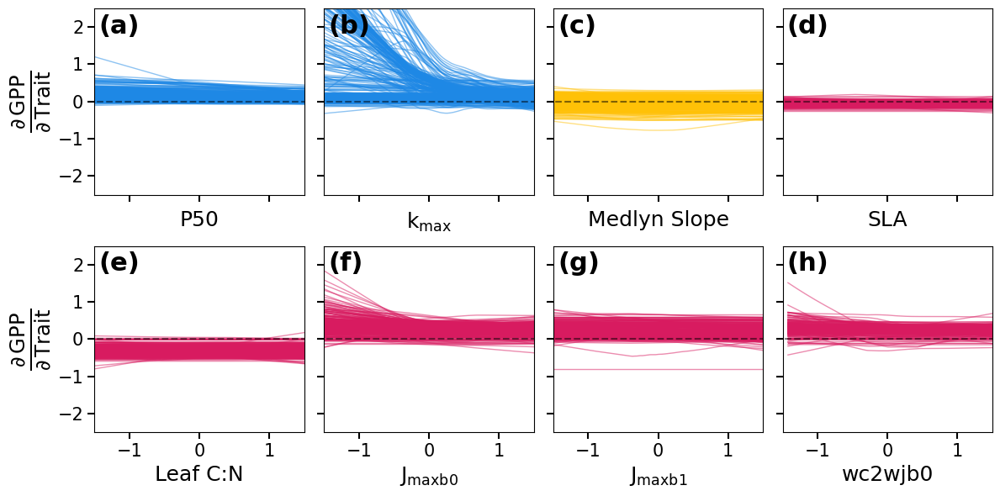

In [38]:
data = GPP_PFT
data = data.where(veg_mask)

# --- Trait metadata ---
rename_traits = {
    'slatop': 'SLA',
    'kmax': 'kmax',
    'medlynslope': 'Medlyn Slope',
    'psi50': 'p50',
    'leafcn': 'Leaf C:N'
}
trait_type_mapping = {
    'SLA': 'carbon economy', 'Leaf C:N': 'carbon economy',
    'jmaxb0': 'carbon economy', 'wc2wjb0': 'carbon economy', 'jmaxb1': 'carbon economy',
    'kmax': 'hydraulic', 'p50': 'hydraulic', 'Medlyn Slope': 'stomatal'
}
trait_type_colors = {
    'carbon economy': (216/255, 27/255, 96/255),
    'hydraulic':      (30/255, 136/255, 229/255),
    'stomatal':       (255/255, 193/255, 7/255)
}

trait_label_mapping = {
    'p50':'P50',
    'kmax':r'$\mathrm{k}_{\mathrm{max}}$',
    'Medlyn Slope':'Medlyn Slope',
    'SLA':'SLA',
    'Leaf C:N': 'Leaf C:N',
    'jmaxb0':r'$\mathrm{J}_{\mathrm{maxb0}}$',
    'jmaxb1':r'$\mathrm{J}_{\mathrm{maxb1}}$',
    'wc2wjb0':'wc2wjb0'
}


# Rename trait coords
data = data.assign_coords(trait=[rename_traits.get(t, t) for t in data.trait.values])
data = data.sel(trait=['p50','kmax','Medlyn Slope','SLA','Leaf C:N','jmaxb0','jmaxb1','wc2wjb0'])
traits = list(data.trait.values)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
axes = axes.flatten()

for i, trait in enumerate(traits):
    trait_type = trait_type_mapping.get(trait, 'carbon economy')
    color = trait_type_colors[trait_type]
    label = trait_label_mapping[trait]
    
    d = data.sel(trait=trait)
    #d = d.where(d.S1 > 0.1, drop=True)

    ax = axes[i]

    for gi in d.gridcell.values:
        try:
            x = d.X.sel(gridcell=gi).values
            y = d.grads.sel(gridcell=gi).values
            mask = np.isfinite(x) & np.isfinite(y)
            
            # Purge gridcells with extreme values
            if (
                np.any(x[mask] > 6) or np.any(x[mask] < -6) or
                np.any(y[mask] > 6) or np.any(y[mask] < -6)
            ):
                continue  # skip this gridcell
                
            if np.count_nonzero(mask) > 10:
                x_valid = x[mask]
                y_valid = y[mask]

                # Apply LOWESS smoothing
                lowess_result = lowess(y_valid, x_valid, frac=0.75, return_sorted=True)
                f_interp = interp1d(lowess_result[:, 0], lowess_result[:, 1], bounds_error=False, fill_value="extrapolate")
                x_interp = np.linspace(-1.5, 1.5, 200)
                y_interp = f_interp(x_interp)
                ax.plot(x_interp, y_interp, color=color, linewidth=1, alpha = 0.5)
        except Exception:
            continue  # skip failed gridcells

    ax.hlines(0, xmin=-2, xmax=2, color='black', linestyle='--', alpha=0.5)
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-2.5, 2.5)
    ax.set_xlabel(label, fontsize=18)

    is_bottom_row = i >= 4
    is_left_col = i % 4 == 0

    if not is_bottom_row:
        ax.set_xticklabels([])
        ax.tick_params(axis='x', length=4, width=1)

    if is_left_col:
        ax.set_ylabel(r'$\frac{\partial\,\mathrm{GPP}}{\partial\,\mathrm{Trait}}$', fontsize=25)
    else:
        ax.set_ylabel('')
        ax.set_yticklabels([])
        ax.tick_params(axis='y', length=4, width=1)

    ax.tick_params(axis='both', labelsize=15, length=6, width=1.5)
    ax.text(0.02, 0.97, f'({chr(97 + i)})', transform=ax.transAxes,
        fontsize=22, fontweight='bold', va='top', ha='left')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig(repo_dir+'/figs/supp/S10_GPP.png', transparent = True, bbox_inches='tight')
plt.show()


/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/scipy/interpolate/_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]


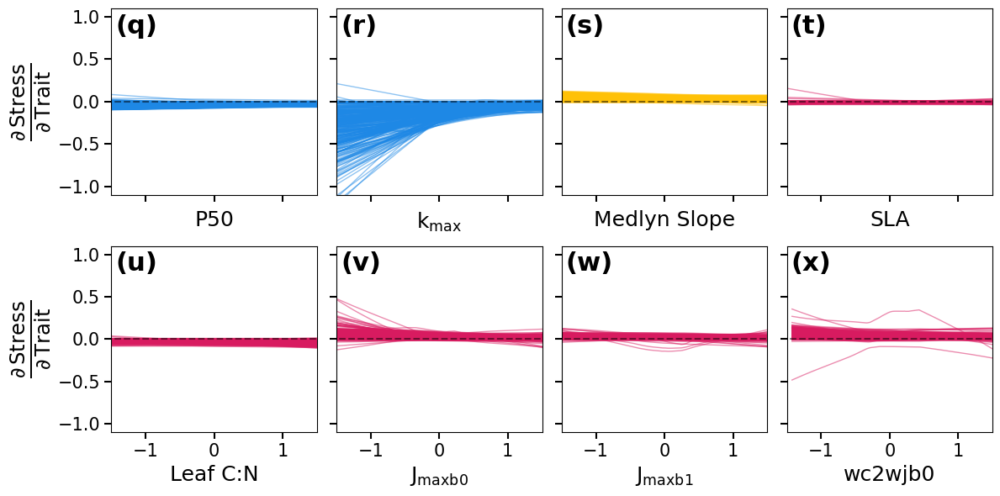

In [40]:
data = Stress_PFT
data = data.where(veg_mask)

# --- Trait metadata ---
rename_traits = {
    'slatop': 'SLA',
    'kmax': 'kmax',
    'medlynslope': 'Medlyn Slope',
    'psi50': 'p50',
    'leafcn': 'Leaf C:N'
}
trait_type_mapping = {
    'SLA': 'carbon economy', 'Leaf C:N': 'carbon economy',
    'jmaxb0': 'carbon economy', 'wc2wjb0': 'carbon economy', 'jmaxb1': 'carbon economy',
    'kmax': 'hydraulic', 'p50': 'hydraulic', 'Medlyn Slope': 'stomatal'
}
trait_type_colors = {
    'carbon economy': (216/255, 27/255, 96/255),
    'hydraulic':      (30/255, 136/255, 229/255),
    'stomatal':       (255/255, 193/255, 7/255)
}

trait_label_mapping = {
    'p50':'P50',
    'kmax':r'$\mathrm{k}_{\mathrm{max}}$',
    'Medlyn Slope':'Medlyn Slope',
    'SLA':'SLA',
    'Leaf C:N': 'Leaf C:N',
    'jmaxb0':r'$\mathrm{J}_{\mathrm{maxb0}}$',
    'jmaxb1':r'$\mathrm{J}_{\mathrm{maxb1}}$',
    'wc2wjb0':'wc2wjb0'
}


# Rename trait coords
data = data.assign_coords(trait=[rename_traits.get(t, t) for t in data.trait.values])
data = data.sel(trait=['p50','kmax','Medlyn Slope','SLA','Leaf C:N','jmaxb0','jmaxb1','wc2wjb0'])
traits = list(data.trait.values)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
axes = axes.flatten()

for i, trait in enumerate(traits):
    trait_type = trait_type_mapping.get(trait, 'carbon economy')
    color = trait_type_colors[trait_type]
    label = trait_label_mapping[trait]

    d = data.sel(trait=trait)
    #d = d.where(d.S1 > 0.1, drop=True)

    ax = axes[i]

    for gi in d.gridcell.values:
        try:
            x = d.X.sel(gridcell=gi).values
            y = d.grads.sel(gridcell=gi).values
            mask = np.isfinite(x) & np.isfinite(y)
            
            # Purge gridcells with extreme values
            if (
                np.any(x[mask] > 6) or np.any(x[mask] < -6) or
                np.any(y[mask] > 6) or np.any(y[mask] < -6)
            ):
                continue  # skip this gridcell

            if np.count_nonzero(mask) > 10:
                x_valid = x[mask]
                y_valid = y[mask]

                # Apply LOWESS smoothing
                lowess_result = lowess(y_valid, x_valid, frac=0.75, return_sorted=True)
                f_interp = interp1d(lowess_result[:, 0], lowess_result[:, 1], bounds_error=False, fill_value="extrapolate")
                x_interp = np.linspace(-1.5, 1.5, 200)
                y_interp = f_interp(x_interp)
                ax.plot(x_interp, y_interp, color=color, linewidth=1, alpha = 0.5)
        except Exception:
            continue  # skip failed gridcells

    ax.hlines(0, xmin=-2, xmax=2, color='black', linestyle='--', alpha=0.5)
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlabel(label, fontsize=18)

    is_bottom_row = i >= 4
    is_left_col = i % 4 == 0

    if not is_bottom_row:
        ax.set_xticklabels([])
        ax.tick_params(axis='x', length=4, width=1)

    if is_left_col:
        ax.set_ylabel(r'$\frac{\partial\,\mathrm{Stress}}{\partial\,\mathrm{Trait}}$', fontsize=25)
    else:
        ax.set_ylabel('')
        ax.set_yticklabels([])
        ax.tick_params(axis='y', length=4, width=1)

    ax.tick_params(axis='both', labelsize=15, length=6, width=1.5)
    ax.text(0.02, 0.97, f'({chr(97 + 16 + i)})', transform=ax.transAxes,
        fontsize=22, fontweight='bold', va='top', ha='left')
# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig(repo_dir+'/figs/supp/S10_Stress.png', transparent = True, bbox_inches='tight')
plt.show()


/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/scipy/interpolate/_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]


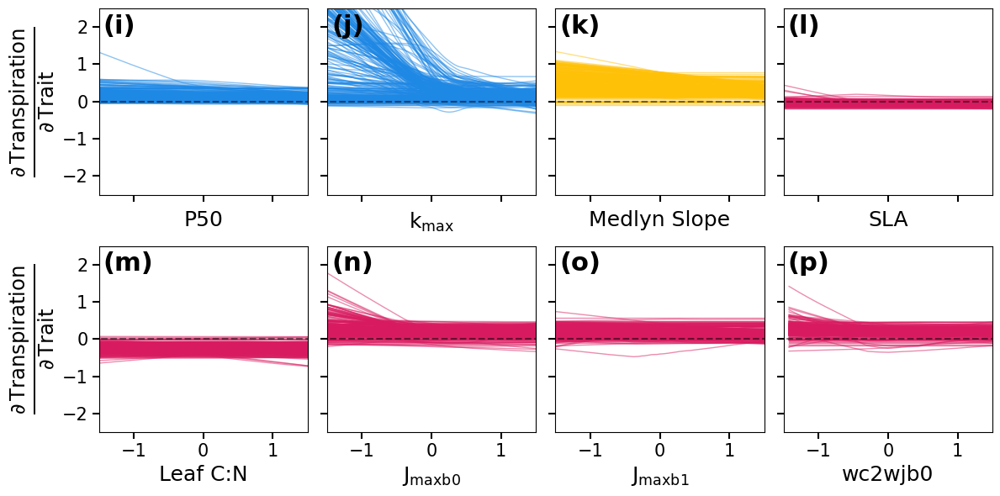

In [53]:
data = T_PFT
data = data.where(veg_mask)

# --- Trait metadata ---
rename_traits = {
    'slatop': 'SLA',
    'kmax': 'kmax',
    'medlynslope': 'Medlyn Slope',
    'psi50': 'p50',
    'leafcn': 'Leaf C:N'
}
trait_type_mapping = {
    'SLA': 'carbon economy', 'Leaf C:N': 'carbon economy',
    'jmaxb0': 'carbon economy', 'wc2wjb0': 'carbon economy', 'jmaxb1': 'carbon economy',
    'kmax': 'hydraulic', 'p50': 'hydraulic', 'Medlyn Slope': 'stomatal'
}
trait_type_colors = {
    'carbon economy': (216/255, 27/255, 96/255),
    'hydraulic':      (30/255, 136/255, 229/255),
    'stomatal':       (255/255, 193/255, 7/255)
}


trait_label_mapping = {
    'p50':'P50',
    'kmax':r'$\mathrm{k}_{\mathrm{max}}$',
    'Medlyn Slope':'Medlyn Slope',
    'SLA':'SLA',
    'Leaf C:N': 'Leaf C:N',
    'jmaxb0':r'$\mathrm{J}_{\mathrm{maxb0}}$',
    'jmaxb1':r'$\mathrm{J}_{\mathrm{maxb1}}$',
    'wc2wjb0':'wc2wjb0'
}


# Rename trait coords
data = data.assign_coords(trait=[rename_traits.get(t, t) for t in data.trait.values])
data = data.sel(trait=['p50','kmax','Medlyn Slope','SLA','Leaf C:N','jmaxb0','jmaxb1','wc2wjb0'])
traits = list(data.trait.values)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
axes = axes.flatten()

for i, trait in enumerate(traits):
    trait_type = trait_type_mapping.get(trait, 'carbon economy')
    color = trait_type_colors[trait_type]
    label = trait_label_mapping[trait]

    d = data.sel(trait=trait)
    #d = d.where(d.S1 > 0.1, drop=True)

    ax = axes[i]

    for gi in d.gridcell.values:
        try:
            x = d.X.sel(gridcell=gi).values
            y = d.grads.sel(gridcell=gi).values
            mask = np.isfinite(x) & np.isfinite(y)
            
            # Purge gridcells with extreme values
            if (
                np.any(x[mask] > 6) or np.any(x[mask] < -6) or
                np.any(y[mask] > 6) or np.any(y[mask] < -6)
            ):
                continue  # skip this gridcell

            if np.count_nonzero(mask) > 10:
                x_valid = x[mask]
                y_valid = y[mask]

                # Apply LOWESS smoothing
                lowess_result = lowess(y_valid, x_valid, frac=0.75, return_sorted=True)
                f_interp = interp1d(lowess_result[:, 0], lowess_result[:, 1], bounds_error=False, fill_value="extrapolate")
                x_interp = np.linspace(-1.5, 1.5, 200)
                y_interp = f_interp(x_interp)
                ax.plot(x_interp, y_interp, color=color, linewidth=1, alpha = 0.5)
        except Exception:
            continue  # skip failed gridcells

    ax.hlines(0, xmin=-2, xmax=2, color='black', linestyle='--', alpha=0.5)
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-2.5, 2.5)
    ax.set_xlabel(label, fontsize=18)

    is_bottom_row = i >= 4
    is_left_col = i % 4 == 0

    if not is_bottom_row:
        ax.set_xticklabels([])
        ax.tick_params(axis='x', length=4, width=1)

    if is_left_col:
        ax.set_ylabel(r'$\frac{\partial\,\mathrm{Transpiration}}{\partial\,\mathrm{Trait}}$', fontsize=25)
    else:
        ax.set_ylabel('')
        ax.set_yticklabels([])
        ax.tick_params(axis='y', length=4, width=1)

    ax.tick_params(axis='both', labelsize=15, length=6, width=1.5)
    ax.text(0.02, 0.97, f'({chr(97 + 8 + i)})', transform=ax.transAxes,
        fontsize=22, fontweight='bold', va='top', ha='left')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig(repo_dir+'/figs/supp/S10_T.png', transparent = True, bbox_inches='tight')
plt.show()


/glade/u/home/emargiotta/AridityEnv/lib/python3.11/site-packages/scipy/interpolate/_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]


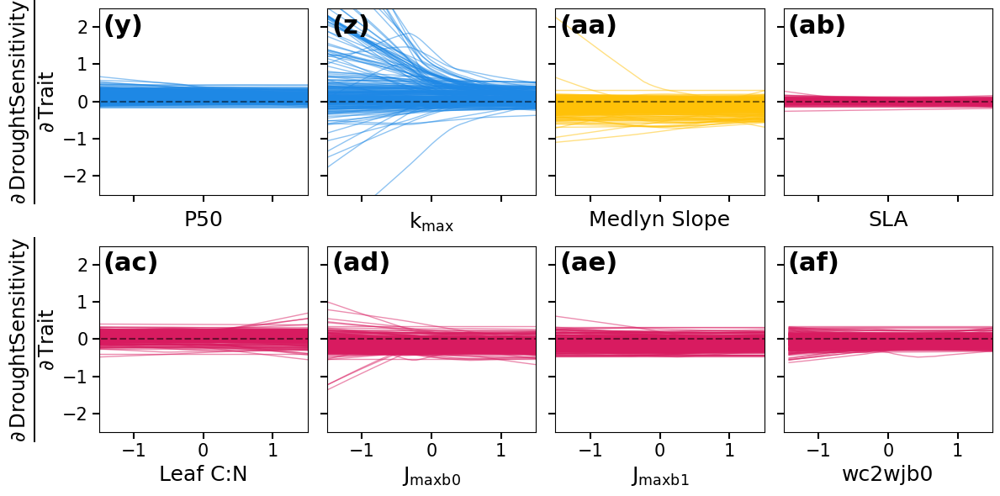

In [51]:
data = DroughtSens_PFT
data = data.where(veg_mask)

# --- Trait metadata ---
rename_traits = {
    'slatop': 'SLA',
    'kmax': 'kmax',
    'medlynslope': 'Medlyn Slope',
    'psi50': 'p50',
    'leafcn': 'Leaf C:N'
}
trait_type_mapping = {
    'SLA': 'carbon economy', 'Leaf C:N': 'carbon economy',
    'jmaxb0': 'carbon economy', 'wc2wjb0': 'carbon economy', 'jmaxb1': 'carbon economy',
    'kmax': 'hydraulic', 'p50': 'hydraulic', 'Medlyn Slope': 'stomatal'
}
trait_type_colors = {
    'carbon economy': (216/255, 27/255, 96/255),
    'hydraulic':      (30/255, 136/255, 229/255),
    'stomatal':       (255/255, 193/255, 7/255)
}

labels = ['y', 'z', 'aa', 'ab', 'ac', 'ad', 'ae', 'af']

trait_label_mapping = {
    'p50':'P50',
    'kmax':r'$\mathrm{k}_{\mathrm{max}}$',
    'Medlyn Slope':'Medlyn Slope',
    'SLA':'SLA',
    'Leaf C:N': 'Leaf C:N',
    'jmaxb0':r'$\mathrm{J}_{\mathrm{maxb0}}$',
    'jmaxb1':r'$\mathrm{J}_{\mathrm{maxb1}}$',
    'wc2wjb0':'wc2wjb0'
}


# Rename trait coords
data = data.assign_coords(trait=[rename_traits.get(t, t) for t in data.trait.values])
data = data.sel(trait=['p50','kmax','Medlyn Slope','SLA','Leaf C:N','jmaxb0','jmaxb1','wc2wjb0'])
traits = list(data.trait.values)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
axes = axes.flatten()

for i, trait in enumerate(traits):
    trait_type = trait_type_mapping.get(trait, 'carbon economy')
    color = trait_type_colors[trait_type]
    label = trait_label_mapping[trait]

    d = data.sel(trait=trait)
    #d = d.where(d.S1 > 0.1, drop=True)

    ax = axes[i]

    for gi in d.gridcell.values:
        try:
            x = d.X.sel(gridcell=gi).values
            y = d.grads.sel(gridcell=gi).values
            mask = np.isfinite(x) & np.isfinite(y)
            
            # Purge gridcells with extreme values
            if (
                np.any(x[mask] > 6) or np.any(x[mask] < -6) or
                np.any(y[mask] > 6) or np.any(y[mask] < -6)
            ):
                continue  # skip this gridcell

            if np.count_nonzero(mask) > 10:
                x_valid = x[mask]
                y_valid = y[mask]

                # Apply LOWESS smoothing
                lowess_result = lowess(y_valid, x_valid, frac=0.75, return_sorted=True)
                f_interp = interp1d(lowess_result[:, 0], lowess_result[:, 1], bounds_error=False, fill_value="extrapolate")
                x_interp = np.linspace(-1.5, 1.5, 200)
                y_interp = f_interp(x_interp)
                ax.plot(x_interp, y_interp, color=color, linewidth=1, alpha = 0.5)
        except Exception:
            continue  # skip failed gridcells

    ax.hlines(0, xmin=-2, xmax=2, color='black', linestyle='--', alpha=0.5)
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-2.5, 2.5)
    ax.set_xlabel(label, fontsize=18)

    is_bottom_row = i >= 4
    is_left_col = i % 4 == 0

    if not is_bottom_row:
        ax.set_xticklabels([])
        ax.tick_params(axis='x', length=4, width=1)

    if is_left_col:
        ax.set_ylabel(r'$\frac{\partial\,\mathrm{Drought Sensitivity}}{\partial\,\mathrm{Trait}}$', fontsize=25)
    else:
        ax.set_ylabel('')
        ax.set_yticklabels([])
        ax.tick_params(axis='y', length=4, width=1)

    ax.tick_params(axis='both', labelsize=15, length=6, width=1.5)
    ax.text(0.02, 0.97, f'({labels[i]})', transform=ax.transAxes,
        fontsize=22, fontweight='bold', va='top', ha='left')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig(repo_dir+'/figs/supp/S10_DroughtSens.png', transparent = True, bbox_inches='tight')
plt.show()


### Supplemental Figure 11 ###

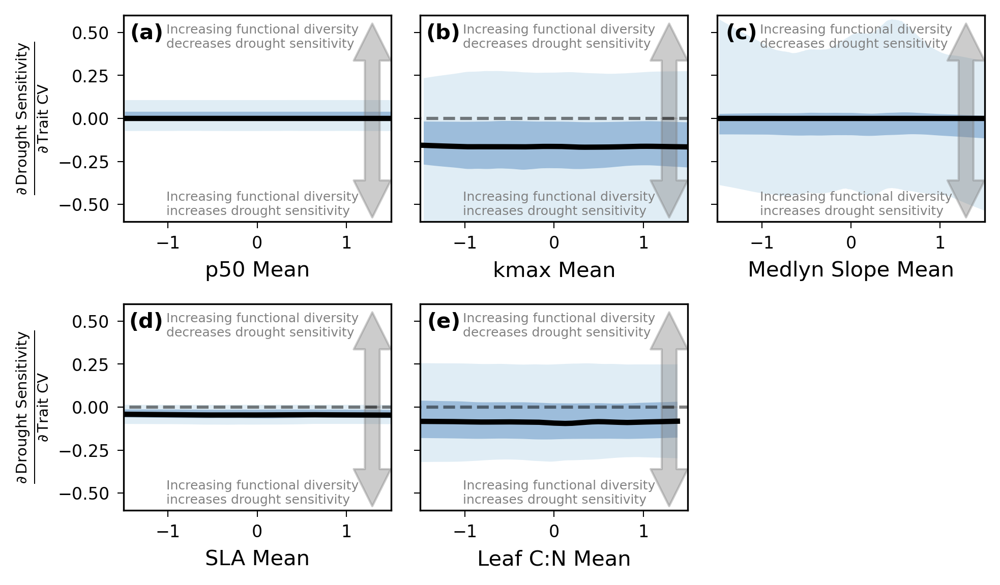

In [47]:
# --- Filter data (as you had) ---
data = DroughtSens_GC
data = data.where(veg_mask)
data = data.where(data.r2_test > 0.1)
data = data.where(data.S1 > 0.1)

div_traits = ['psi50CV', 'kmaxCV', 'medlynslopeCV', 'slatopCV', 'leafcnCV']
mean_trait_lookup = {
    'psi50CV': 'psi50Mean',
    'kmaxCV': 'kmaxMean',
    'medlynslopeCV': 'medlynslopeMean',
    'slatopCV': 'slatopMean',
    'leafcnCV': 'leafcnMean'
}
xlabs = ['p50 Mean', 'kmax Mean', 'Medlyn Slope Mean', 'SLA Mean', 'Leaf C:N Mean']
panel_labels = ['(a)', '(b)', '(c)', '(d)', '(e)']

xlabelsize = 10
ylabelsize = 10
ticksize = 8
lettersize = 12
figure_width_mm = 169
figure_height_mm = 100

fig, axes = plt.subplots(2, 3, figsize=(figure_width_mm/25.4, figure_height_mm/25.4), dpi = 300)
axes = axes.flatten()

for col_idx, trait in enumerate(div_traits):
    ax = axes[col_idx]
    grad_trait = trait
    x_trait = mean_trait_lookup[trait]

    # Select arrays: X grid (per gridcell) and gradient values (per gridcell)
    d_grad = data.sel(trait=grad_trait)           # has .grads with dims like (X, gridcell)
    d_mean = data.sel(trait=x_trait)              # has .X with dims like (X, gridcell)

    # ---- compute ALL needed quantiles at once (2.5, 25, 50, 75, 97.5) ----
    y_q = d_grad.grads.quantile([0.025, 0.25, 0.5, 0.75, 0.975], dim='gridcell', skipna=True)
    
    x_arr = np.asarray(d_mean.X.median(dim='gridcell', skipna=True).values)
    y_p50 = np.asarray(y_q.sel(quantile=0.5).values)
    y_p25 = np.asarray(y_q.sel(quantile=0.25).values)
    y_p75 = np.asarray(y_q.sel(quantile=0.75).values)
    y_p025 = np.asarray(y_q.sel(quantile=0.025).values)
    y_p975 = np.asarray(y_q.sel(quantile=0.975).values)
    
    mask = np.isfinite(x_arr) & np.isfinite(y_p50) & np.isfinite(y_p25) & np.isfinite(y_p75) \
           & np.isfinite(y_p025) & np.isfinite(y_p975)
    x_arr, y_p50, y_p25, y_p75, y_p025, y_p975 = \
        x_arr[mask], y_p50[mask], y_p25[mask], y_p75[mask], y_p025[mask], y_p975[mask]
    
    if x_arr.size > 5:
        order = np.argsort(x_arr)
        x_sorted  = x_arr[order]
        y50_sorted = y_p50[order]
        y25_sorted = y_p25[order]
        y75_sorted = y_p75[order]
        ylo95_sorted = y_p025[order]
        yhi95_sorted = y_p975[order]
    
        frac = 0.3  # smoothing strength
    
        # LOWESS smooth each series
        sm50   = lowess(y50_sorted,   x_sorted, frac=frac, return_sorted=True)
        sm25   = lowess(y25_sorted,   x_sorted, frac=frac, return_sorted=True)
        sm75   = lowess(y75_sorted,   x_sorted, frac=frac, return_sorted=True)
        smlo95 = lowess(ylo95_sorted, x_sorted, frac=frac, return_sorted=True)
        smhi95 = lowess(yhi95_sorted, x_sorted, frac=frac, return_sorted=True)
    
        # Common x-grid for clean fills
        x_interp = np.linspace(x_sorted.min(), x_sorted.max(), 300)
        f50   = interp1d(sm50[:,0],   sm50[:,1],   bounds_error=False, fill_value="extrapolate")
        f25   = interp1d(sm25[:,0],   sm25[:,1],   bounds_error=False, fill_value="extrapolate")
        f75   = interp1d(sm75[:,0],   sm75[:,1],   bounds_error=False, fill_value="extrapolate")
        flo95 = interp1d(smlo95[:,0], smlo95[:,1], bounds_error=False, fill_value="extrapolate")
        fhi95 = interp1d(smhi95[:,0], smhi95[:,1], bounds_error=False, fill_value="extrapolate")
    
        y50_i   = f50(x_interp)
        y25_i   = f25(x_interp)
        y75_i   = f75(x_interp)
        ylo95_i = flo95(x_interp)
        yhi95_i = fhi95(x_interp)
    
        # Guard against crossings
        lo95 = np.minimum(ylo95_i, yhi95_i)
        hi95 = np.maximum(ylo95_i, yhi95_i)
        loIQR = np.minimum(y25_i, y75_i)
        hiIQR = np.maximum(y25_i, y75_i)
    
        # Colors: light blue for 95%, darker blue for IQR
        light_blue = mcolors.to_rgba("#67a9cf", alpha=0.20)  # soft
        dark_blue  = mcolors.to_rgba("#2166ac", alpha=0.35)  # darker
    
        # Plot: 95% first, then IQR on top, then median line
        ax.fill_between(x_interp, lo95,  hi95,  facecolor=light_blue, edgecolor='none')
        ax.fill_between(x_interp, loIQR, hiIQR, facecolor=dark_blue,  edgecolor='none')
        ax.plot(x_interp, y50_i, color='black', linewidth=2.5, label='Median')
    
        # Aesthetics (as you had)
        ax.hlines(0, xmin=-2, xmax=2, color='black', linestyle='--', alpha=0.5)
        ax.set_xlim(-1.5, 1.5)
        ax.set_ylim(-.6, .6)
        ax.set_xticks([-1, 0, 1])
        ax.set_yticks([-.5, -.25, 0, .25, .5])
        ax.set_xlabel(xlabs[col_idx], fontsize=xlabelsize)
        ax.tick_params(axis='both', labelsize=ticksize, length=3, width=.5)
    
        if col_idx % 3 == 0:
            ax.set_ylabel(r'$\frac{\partial\,\mathrm{Drought\ Sensitivity}}{\partial\,\mathrm{Trait\ CV}}$', fontsize=ylabelsize)
        else:
            ax.set_yticklabels([])
    
        ax.text(0.15, 0.96, f'{panel_labels[col_idx]}', transform=ax.transAxes,
                fontsize=10, fontweight='bold', va='top', ha='right')

# Turn off unused panel if needed
if len(div_traits) < len(axes):
    axes[len(div_traits)].axis('off')

# Keep your arrows/annotations
for ax in axes.flatten()[0:5]:
    # Up arrow
    up_arrow = mpatches.FancyArrowPatch(
        (0.93, 0.48), (0.93, .98),
        transform=ax.transAxes, mutation_scale=35, color='gray', alpha=0.4
    )
    ax.add_patch(up_arrow)
    ax.text(0.16, 0.83, 'Increasing functional diversity\ndecreases drought sensitivity',
            transform=ax.transAxes, ha='left', va='bottom', fontsize=6, color='grey')

    # Down arrow
    down_arrow = mpatches.FancyArrowPatch(
        (0.93, 0.52), (0.93, 0.0),
        transform=ax.transAxes, mutation_scale=35, color='gray', alpha=0.4
    )
    ax.add_patch(down_arrow)
    ax.text(0.16, 0.02, 'Increasing functional diversity\nincreases drought sensitivity',
            transform=ax.transAxes, ha='left', va='bottom', fontsize=6, color='grey')

plt.tight_layout()
plt.savefig(repo_dir+'/figs/supp/S11.png', transparent = True, bbox_inches='tight', dpi = 300)
plt.show()

### Supplemental Figure 12 ###

In [46]:
# --- Shared settings ---
# --- Font sizes ---
xlabelsize = 10
ylabelsize = 10
ticksize = 8
panelsize = 6
lettersize = 12

xtraits_PFT = ['kmax_Norm','leafcn_Norm','medlynslope_Norm','psi50_Norm','slatop_Norm','jmaxb0','jmaxb1','wc2wjb0']

trait_ds = trait_data[xtraits_PFT]
trait_ds = (trait_ds - trait_ds.mean(dim = 'ens'))/ trait_ds.std(dim = 'ens')
inds_test_PFT = xr.merge([trait_ds, Metrics_PFT])
rename_dict = {var: var.replace("_Norm", "") for var in inds_test_PFT.data_vars}
inds_test_PFT = inds_test_PFT.rename(rename_dict)
xtraits_PFT = ['kmax','leafcn','medlynslope','psi50','slatop','jmaxb0','jmaxb1','wc2wjb0']
inds_test_PFT['Stress'] = 1 - inds_test_PFT['B']

dslist = []
for i in inds_test_PFT.gridcell.values:
    sub = inds_test_PFT.sel(gridcell = i)
    ppft = prim_pft.pft.sel(gridcell = i)
    sub = sub.sel(pft = ppft)
    dslist.append(sub)
inds_test_PFT = xr.concat(dslist, dim = 'gridcell')

biome_ids = np.unique(inds.biome.values[~np.isnan(inds.biome.values)]).astype(int)
biome_names = inds.biome_name.values
num_biomes = len(biome_ids)
cmap = cm.get_cmap('tab10', num_biomes)
biome_colors = {bid: cmap(i) for i, bid in enumerate(biome_ids)}

panel_labels_top = ['(a)', '(b)', '(c)']
panel_labels_bottom = ['(d)', '(e)', '(f)']

# Trait name and derivative label
trait_name = 'kmax'
grad_label = r"$\frac{\partial\,\mathrm{Metric}}{\partial\,k_{\mathrm{max}}}$"

# --- Set up 2x3 plot ---
figure_width_mm = 140
figure_height_mm = 100
fig, axes = plt.subplots(2, 2, figsize=(figure_width_mm / 25.4, figure_height_mm / 25.4), dpi=300)
axes = axes.flatten()

# Panel a
ax = axes[0]
trait = 'kmax'
data_top = inds_test_PFT.where(veg_mask)
#data_top = data_top.where(DroughtSens_PFT.r2_test>0.1)
data_top = data_top.where(DroughtSens_PFT.sel(trait = 'kmax').S1>0.1)

b = 3
d_trait = data_top.where(inds.biome == b).median(dim='gridcell')
x = d_trait[trait]
x = (x - x.mean(dim = 'ens'))/x.std(dim = 'ens')
y = (((d_trait.DroughtSens - d_trait.DroughtSens.mean())/d_trait.DroughtSens.std()).values)*2
mask = np.isfinite(x) & np.isfinite(y)
if np.any(mask):
    sm = lowess(y[mask], x[mask], frac=0.75, return_sorted=True)
    f_interp = interp1d(sm[:, 0], sm[:, 1], bounds_error=False, fill_value="extrapolate")

    # Main curve
    x_interp = np.linspace(-1.5, 1.5, 200)
    y_interp = f_interp(x_interp)
    ax.plot(x_interp, y_interp-1, color=biome_colors[b], linewidth=1.5, label=biome_names[b])


# Black dots at x = -1 and x = 1
x_pts = [-1, 1]
y_pts = f_interp(np.array(x_pts)) -1
ax.plot(x_pts, y_pts, 'o', color='black', markersize=4, zorder=5)

# Dashed line connecting them
ax.plot(x_pts, y_pts, linestyle='--', color='black', linewidth=1, zorder=4)

# ⭐ Red star 1: x = 0 on LOWESS curve → f(𝑥̄)
y_star_curve = f_interp(0)-1
ax.plot(0, y_star_curve, marker='*', color=biome_colors[b], markersize=7, zorder=6)
ax.text(-0.4, y_star_curve - 0.65, r'$f(\bar{x})$', fontsize=11, color=biome_colors[b], va='bottom', ha='left')

# ⭐ Black star 2: x = 0 on dashed line → 𝑓̄(x)
y_star_line = np.mean(y_pts)
ax.plot(0, y_star_line, marker='*', color='black', markersize=7, zorder=6)
ax.text(0.1, y_star_line + 0.4, r'$\overline{f(x)}$', fontsize=11, color='black', va='top', ha='left')

ax.text(0.2, 0.87, 'Concave Function', color='grey', fontsize=10,
        transform=ax.transAxes, va='center', ha='left')

ax.set_xlabel(r'$\mathrm{k}_{\mathrm{max}}$', fontsize=xlabelsize)
ax.set_ylabel('Drought Sensitivity', fontsize=ylabelsize)
ax.tick_params(axis='both', labelsize=ticksize) 
ax.set_xticks([-1, 0, 1])
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-2.2, 1.5)
ax.set_yticks([-2,-1,0,1])
ax.text(0.18, 0.96, f'(a)', transform=ax.transAxes,
        fontsize=lettersize, fontweight='bold', va='top', ha='right')


# Panel b
ax = axes[1]
trait = 'kmax'
data_top = inds_test_PFT.where(veg_mask)
#data_top = data_top.where(DroughtSens_PFT.r2_test>0.1)
data_top = data_top.where(DroughtSens_PFT.sel(trait = 'kmax').S1>0.1)

b = 5
d_trait = data_top.where(inds.biome == b).median(dim='gridcell')
x = d_trait[trait]
x = (x - x.mean(dim = 'ens'))/x.std(dim = 'ens')
y = (((d_trait.DroughtSens - d_trait.DroughtSens.mean())/d_trait.DroughtSens.std()).values)
mask = np.isfinite(x) & np.isfinite(y)
if np.any(mask):
    sm = lowess(y[mask], x[mask], frac=0.75, return_sorted=True)
    f_interp = interp1d(sm[:, 0], sm[:, 1], bounds_error=False, fill_value="extrapolate")

    # Main curve
    x_interp = np.linspace(-1.5, 1.5, 200)
    y_interp = f_interp(x_interp)
    ax.plot(x_interp, y_interp, color=biome_colors[b], linewidth=1.5, label=biome_names[b])

# Black dots at x = -1 and x = 1
x_pts = [-1, 1]
y_pts = f_interp(np.array(x_pts))
ax.plot(x_pts, y_pts, 'o', color='black', markersize=4, zorder=5)

# Dashed line connecting them
ax.plot(x_pts, y_pts, linestyle='--', color='black', linewidth=1, zorder=4)

# ⭐ Brown star 1: x = 0 on LOWESS curve → f(𝑥̄)
y_star_curve = f_interp(0)
ax.plot(0, y_star_curve, marker='*', color=biome_colors[b], markersize=7, zorder=6)
ax.text(-0.4, y_star_curve + 0.2, r'$f(\bar{x})$', fontsize=11, color=biome_colors[b], va='bottom', ha='left')

# ⭐ Black star 2: x = 0 on dashed line → 𝑓̄(x)
y_star_line = np.mean(y_pts)
ax.plot(0, y_star_line, marker='*', color='black', markersize=7, zorder=6)
ax.text(0.1, y_star_line - 0.2, r'$\overline{f(x)}$', fontsize=11, color='black', va='top', ha='left')

ax.text(0.2, 0.13, 'Convex Function', color='grey', fontsize=10,
        transform=ax.transAxes, va='center', ha='left')

ax.set_xlabel(r'$\mathrm{k}_{\mathrm{max}}$', fontsize=xlabelsize)
ax.set_ylabel('Drought Sensitivity', fontsize=ylabelsize)
ax.tick_params(axis='both', labelsize=ticksize) 
ax.set_xticks([-1, 0, 1])
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-2.2, 1.5)
ax.set_yticks([-2,-1,0,1])
ax.text(0.18, 0.96, f'(b)', transform=ax.transAxes,
        fontsize=lettersize, fontweight='bold', va='top', ha='right')


# panel c
# Filter data
data = DroughtSens_GC
data = data.where(veg_mask)
data = data.where(data.S1 > 0.1)
#data = data.where(data.r2_test > 0.1)


ax = axes[2]
mean_trait_lookup = {
    'kmaxCV': 'kmaxMean'}
trait = 'kmaxCV'
grad_trait = trait
x_trait = mean_trait_lookup[trait]

d_grad = data.sel(trait=grad_trait)
d_mean = data.sel(trait=x_trait)

biome_id = 3
gridcells = inds.gridcell.where(inds.biome == biome_id, drop=True).values

x_vals = d_mean.X.sel(gridcell=gridcells)
y_vals = d_grad.grads.sel(gridcell=gridcells)

x_median = x_vals.median(dim='gridcell', skipna=True).values
y_median = y_vals.median(dim='gridcell', skipna=True).values

mask = np.isfinite(x_median) & np.isfinite(y_median)

if np.count_nonzero(mask) > 20:
    x_valid = x_median[mask]
    y_valid = y_median[mask]
    sm = lowess(y_valid, x_valid, frac=0.75, return_sorted=True)
    f_interp = interp1d(sm[:, 0], sm[:, 1], bounds_error=False, fill_value="extrapolate")
    x_interp = np.linspace(-1.5, 1.5, 200)
    y_interp = f_interp(x_interp)
    ax.plot(x_interp, y_interp, color=biome_colors[biome_id], label=biome_names[biome_id], linewidth=1.5)
    
# --- Arrows ---
up_arrow = mpatches.FancyArrowPatch(
    (0.91, 0.48), (0.91, 0.95), transform=ax.transAxes,
    mutation_scale=40, color='gray', alpha=0.4)
down_arrow = mpatches.FancyArrowPatch(
    (0.91, 0.52), (0.91, 0.05), transform=ax.transAxes,
    mutation_scale=40, color='gray', alpha=0.4)
ax.add_patch(up_arrow)
ax.add_patch(down_arrow)

# --- Annotations ---
ax.text(0.42, 0.87, r'$\overline{f(x)} > f(\bar{x})$', color='grey', fontsize=12,
        transform=ax.transAxes, va='center', ha='left')
ax.text(0.42, 0.13, r'$\overline{f(x)} < f(\bar{x})$', color='grey', fontsize=12,
        transform=ax.transAxes, va='center', ha='left')

# Aesthetics
ax.hlines(0, xmin=-2, xmax=2, color='black', linestyle='--', alpha=0.5)
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-.3, .3)
ax.set_xticks([-1, 0, 1])
ax.set_yticks([-.25, 0, .25])
ax.set_xlabel('kmax Mean', fontsize=xlabelsize)
ax.tick_params(axis='both', labelsize=ticksize, length=3, width=.5)
ax.set_ylabel(r'$\frac{\partial\,\mathrm{Drought\ Sensitivity}}{\partial\,\mathrm{k}_{\mathrm{max}}\ \mathrm{CV}}$',fontsize=ylabelsize*1.3)
ax.set_xlabel(r'$\mathrm{k}_{\mathrm{max}}$ Mean', fontsize=xlabelsize)

ax.text(0.18, 0.96, f'(c)', transform=ax.transAxes,
        fontsize=lettersize, fontweight='bold', va='top', ha='right')


# panel d
# Filter data
data = DroughtSens_GC
data = data.where(veg_mask)
data = data.where(data.S1 > 0.1)
#data = data.where(data.r2_test > 0.1)


ax = axes[3]
mean_trait_lookup = {
    'kmaxCV': 'kmaxMean'}
trait = 'kmaxCV'
grad_trait = trait
x_trait = mean_trait_lookup[trait]

d_grad = data.sel(trait=grad_trait)
d_mean = data.sel(trait=x_trait)

biome_id = 5
gridcells = inds.gridcell.where(inds.biome == biome_id, drop=True).values

x_vals = d_mean.X.sel(gridcell=gridcells)
y_vals = d_grad.grads.sel(gridcell=gridcells)

x_median = x_vals.median(dim='gridcell', skipna=True).values
y_median = y_vals.median(dim='gridcell', skipna=True).values

mask = np.isfinite(x_median) & np.isfinite(y_median)

if np.count_nonzero(mask) > 20:
    x_valid = x_median[mask]
    y_valid = y_median[mask]
    sm = lowess(y_valid, x_valid, frac=0.75, return_sorted=True)
    f_interp = interp1d(sm[:, 0], sm[:, 1], bounds_error=False, fill_value="extrapolate")
    x_interp = np.linspace(-1.5, 1.5, 200)
    y_interp = f_interp(x_interp)
    ax.plot(x_interp, y_interp+.06, color=biome_colors[biome_id], label=biome_names[biome_id], linewidth=1.5)

# --- Arrows ---
up_arrow = mpatches.FancyArrowPatch(
    (0.91, 0.48), (0.91, 0.95), transform=ax.transAxes,
    mutation_scale=40, color='gray', alpha=0.4)
down_arrow = mpatches.FancyArrowPatch(
    (0.91, 0.52), (0.91, 0.05), transform=ax.transAxes,
    mutation_scale=40, color='gray', alpha=0.4)
ax.add_patch(up_arrow)
ax.add_patch(down_arrow)

# --- Annotations ---
ax.text(0.42, 0.87, r'$\overline{f(x)} > f(\bar{x})$', color='grey', fontsize=12,
        transform=ax.transAxes, va='center', ha='left')
ax.text(0.42, 0.13, r'$\overline{f(x)} < f(\bar{x})$', color='grey', fontsize=12,
        transform=ax.transAxes, va='center', ha='left')

# Aesthetics
ax.hlines(0, xmin=-2, xmax=2, color='black', linestyle='--', alpha=0.5)
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-.3, .3)
ax.set_xticks([-1, 0, 1])
ax.set_yticks([-.25, 0, .25])
ax.tick_params(axis='both', labelsize=ticksize, length=3, width=.5)
ax.set_ylabel(r'$\frac{\partial\,\mathrm{Drought\ Sensitivity}}{\partial\,\mathrm{k}_{\mathrm{max}}\ \mathrm{CV}}$',fontsize=ylabelsize*1.3)
ax.set_xlabel(r'$\mathrm{k}_{\mathrm{max}}$ Mean', fontsize=xlabelsize)

ax.text(0.18, 0.96, f'(d)', transform=ax.transAxes,
        fontsize=lettersize, fontweight='bold', va='top', ha='right')

plt.tight_layout()

plt.savefig(repo_dir+'/figs/supp/S12.png', transparent = True, bbox_inches='tight', dpi = 300)


AttributeError: 'ListedColormap' object has no attribute 'get_cmap'